# Importing Libraries

In [ ]:
from keras.datasets import mnist
from tensorflow.keras.datasets import cifar10, cifar100
from keras import ops
import tensorflow as tf
import numpy as np
import random
from sklearn.metrics import precision_score, recall_score
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import *
from keras.utils import to_categorical
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import *
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt
import json
from keras.models import load_model, Model
import datetime
import pytz
from keras import backend as K
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn.functional as F
import re
import torch.nn as nn
from torchvision import models

random.seed(123)
tf.random.set_seed(123)
np.random.seed(123)
torch.manual_seed(123)
torch.cuda.manual_seed(123)

# Noise Introduction Function

In [ ]:
def introduce_label_noise(labels, num_classes, noise_ratio):

    num_samples = len(labels)
    num_corrupt = int(noise_ratio * num_samples)

    indices = np.random.choice(num_samples, num_corrupt, replace=False)
    corrupted_labels = labels.copy()

    corrupted_labels[indices]=np.random.randint(0, num_classes, size=num_corrupt)

    return corrupted_labels

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 18s 0us/step


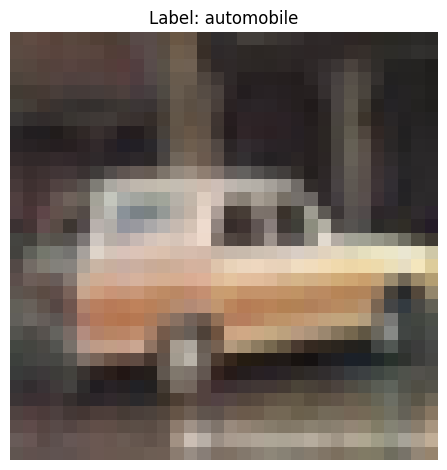

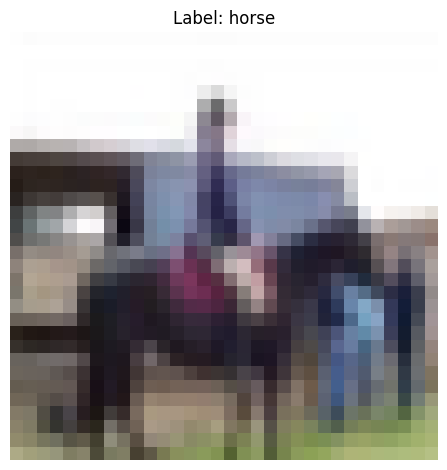

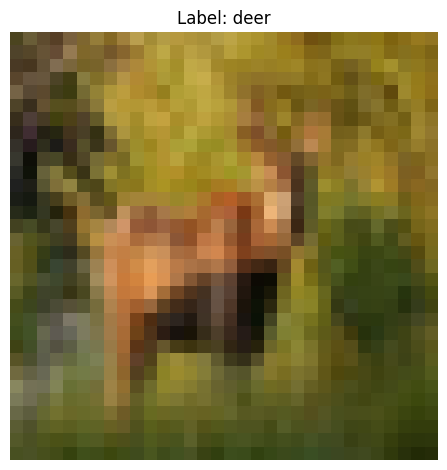

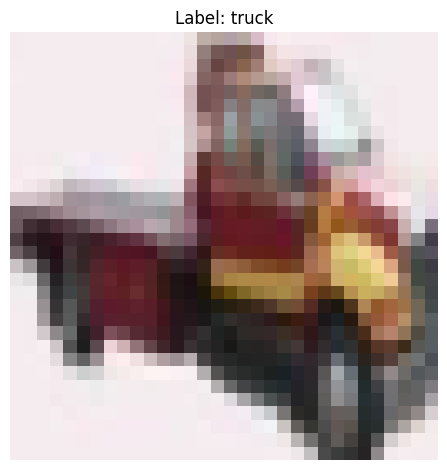

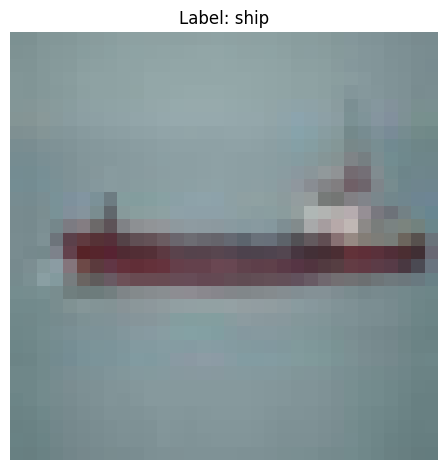

In [ ]:
def visualize_mislabeled_samples(original_images,
                                 original_labels,
                                 corrupted_labels,
                                 label_map,
                                 num_samples=5):

    mismatches = np.where(original_labels != corrupted_labels)[0]

    selected_indices = np.random.choice(mismatches,
                                        min(num_samples, len(mismatches)),
                                        replace=False)

    for i in selected_indices:
        plt.imshow(original_images[i])
        orig_label_name = label_map[original_labels[i]]
        corrupt_label_name = label_map[corrupted_labels[i]]
        #plt.title(f"Original: {orig_label_name} | Corrupted: {corrupt_label_name}")
        plt.title(f"Label: {orig_label_name}")

        plt.axis('off')
        plt.tight_layout()
        plt.show()

mnist_labs = [0,1,2,3,4,5,6,7,8,9]
cifar_10_labs = ['airplane', 'automobile', 'bird', 'cat', 'deer','dog', 'frog', 'horse', 'ship', 'truck']
(x_train_cifar10, y_train_cifar10), (x_test_cifar10, y_test_cifar10) = cifar10.load_data()
y_train_cifar10 = y_train_cifar10.flatten()
#(x_train_mnist, y_train_mnist), (x_test_mnist, y_test_mnist) = mnist.load_data()

noise_ratio = 0.3  # Example: 30% label corruption
#corrupted_labels = introduce_label_noise(y_train_cifar10, num_classes=10, noise_ratio=noise_ratio)
#visualize_mislabeled_samples(x_train_cifar10, y_train_cifar10, corrupted_labels, num_samples=1)

corrupted_labels_mnist_thirty = introduce_label_noise(y_train_cifar10, num_classes=10, noise_ratio=noise_ratio)
visualize_mislabeled_samples(x_train_cifar10, y_train_cifar10, corrupted_labels_mnist_thirty,label_map=cifar_10_labs, num_samples=5)

#Save Directories for Models Trained on Data Variants

In [ ]:

cnn_mnist_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/CNN Checkpoints/MNIST"
cnn_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/CNN Checkpoints/CIFAR 10"
cnn_cifar100_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/CNN Checkpoints/CIFAR 100"

dnn_mnist_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/DNN Checkpoints/MNIST"
dnn_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/DNN Checkpoints/CIFAR 10"
dnn_cifar100_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/DNN Checkpoints/CIFAR 100"

vision_transformer_mnist_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Vision Transformer Checkpoints/MNIST"
vision_transformer_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Vision Transformer Checkpoints/CIFAR 10"

ct_nr_cnn_mnist_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co Teaching NR CNNs/MNIST"
ct_nr_cnn_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co Teaching NR CNNs/CIFAR10"


nr_cnn_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10"
nr_resnet_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10"
nr_cnn_mnist_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/MNIST"

co_teaching_mnist_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST"
co_teaching_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10"
co_teaching_cifar100_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 100"


densenet_cifar10_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/DenseNet Checkpoints/CIFAR 10"
densenet_cifar10_assymetric_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/DenseNet Checkpoints/CIFAR 10 Asymmetric"
densenet_cifar100_save_dir = "/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/DenseNet Checkpoints/CIFAR 100"


list_of_save_dir = [cnn_mnist_save_dir,cnn_cifar10_save_dir,cnn_cifar100_save_dir,
                    dnn_mnist_save_dir, dnn_cifar10_save_dir, dnn_cifar100_save_dir,
                    ct_nr_cnn_cifar10_save_dir, ct_nr_cnn_cifar10_save_dir,
                    vision_transformer_mnist_save_dir,vision_transformer_mnist_save_dir, nr_cnn_cifar10_save_dir,
                    co_teaching_mnist_save_dir, co_teaching_cifar10_save_dir, co_teaching_cifar10_save_dir,
                    densenet_cifar10_save_dir, densenet_cifar10_assymetric_save_dir, densenet_cifar100_save_dir]

for i in list_of_save_dir:
      os.makedirs(i, exist_ok=True)

#Time Stamped File Paths

In [ ]:
timezone = pytz.timezone('US/Central')
def get_timestamped_path(base_name):
    timestamp = datetime.datetime.now(tz = timezone).strftime("%Y-%m-%d %H:%M:%S")
    for save_dir in list_of_save_dir:
      return os.path.join(save_dir, f"{timestamp}_{base_name}.h5")

# Accuracy & Loss Plotting + Metrics Functions

In [ ]:
def calc_dindex(accuracy, specificity, sensitivity):
    d = np.log2(1 + accuracy) + np.log2(1 + ((sensitivity + specificity) / 2))
    return d

def plot_coteaching_metrics(json_paths, model_names=None):
    precision_list = []
    recall_list = []
    f1_list = []
    labels = []

    for i, path in enumerate(json_paths):
        with open(path, 'r') as f:
            history = json.load(f)

        try:
            precision = history["test_precision"][-1]
            recall = history["test_recall"][-1]
        except (KeyError, IndexError):
            print(f"Something's wrong in:  {path}")
            continue

        f1 = 2 * (precision * recall) / (precision + recall + 1e-8)

        precision_list.append(precision)
        recall_list.append(recall)
        f1_list.append(f1)
        labels.append(model_names[i] if model_names else f"Model {i+1}")

    x = np.arange(len(labels))
    width = 0.25

    plt.figure(figsize=(12, 6))
    plt.bar(x - width, precision_list, width, label='Precision', color = "orange")
    plt.bar(x, recall_list, width, label='Recall', color = "green")
    plt.bar(x + width, f1_list, width, label='F1 Score', color = "red")

    plt.xticks(x, labels, rotation=45, ha='right')
    plt.ylabel('Score')
    plt.title('Precision, Recall, and F1 Score for Each Model')
    plt.ylim(0, 1.05)
    plt.legend()
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)

    for i in range(len(labels)):
        plt.text(x[i] - width, precision_list[i] + 0.01, f"{precision_list[i]:.2f}", ha='center')
        plt.text(x[i], recall_list[i] + 0.01, f"{recall_list[i]:.2f}", ha='center')
        plt.text(x[i] + width, f1_list[i] + 0.01, f"{f1_list[i]:.2f}", ha='center')

    plt.tight_layout()
    plt.show()

In [ ]:
import torch
import numpy as np
import json
from sklearn.metrics import confusion_matrix

def compute_sens_spec(model, test_loader, device='cuda'):
    model.eval()
    model.to(device)

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for x_batch, y_batch in test_loader:
            x_batch = x_batch.to(device)
            y_batch = y_batch.to(device)

            outputs = model(x_batch)
            preds = torch.argmax(outputs, dim=1)

            all_preds.append(preds.cpu().numpy())
            all_labels.append(y_batch.cpu().numpy())

    y_pred = np.concatenate(all_preds)
    y_true = np.concatenate(all_labels)

    cm = confusion_matrix(y_true, y_pred)
    n_classes = cm.shape[0]

    sensitivities = []
    specificities = []

    for i in range(n_classes):
        TP = cm[i, i]
        FN = np.sum(cm[i, :]) - TP
        FP = np.sum(cm[:, i]) - TP
        TN = np.sum(cm) - (TP + FP + FN)

        sensitivities.append(TP / (TP + FN + 1e-8))
        specificities.append(TN / (TN + FP + 1e-8))

    sensitivity = np.mean(sensitivities)
    specificity = np.mean(specificities)

    return sensitivity, specificity


def evaluate_coteaching_models_shared_json(model1_path,
                                           model2_path,
                                           history_json_path,
                                           model_class,
                                           test_loader, device='cuda'):
    model1 = model_class()
    model1.load_state_dict(torch.load(model1_path, map_location=device))

    model2 = model_class()
    model2.load_state_dict(torch.load(model2_path, map_location=device))

    sens1, spec1 = compute_sens_spec(model1, test_loader, device)
    sens2, spec2 = compute_sens_spec(model2, test_loader, device)

    with open(history_json_path, 'r') as f:
        history = json.load(f)

    history['model1'] = history.get('model1', {})
    history['model2'] = history.get('model2', {})

    history['model1']['sensitivity'] = float(sens1)
    history['model1']['specificity'] = float(spec1)

    history['model2']['sensitivity'] = float(sens2)
    history['model2']['specificity'] = float(spec2)

    with open(history_json_path, 'w') as f:
        json.dump(history, f, indent=4)

    print(f"\nCo-Teaching Model Comparison: File'{history_json_path}')")
    print(f"{'Model':<10} | {'Sensitivity':>12} | {'Specificity':>12}")
    print("-" * 38)
    print(f"{'Model 1':<10} | {sens1:>12.4f} | {spec1:>12.4f}")
    print(f"{'Model 2':<10} | {sens2:>12.4f} | {spec2:>12.4f}")


def evaluate_models_json(model_ath, history_json_path, model_class, test_loader, device='cpu'):
    model = model_class()
    model.load_state_dict(torch.load(model_ath, map_location=device))

    sens, spec = compute_sens_spec(model, test_loader, device)

    with open(history_json_path, 'r') as f:
        history = json.load(f)

    history['model1'] = history.get('model1', {})

    history['model1']['sensitivity'] = float(sens)
    history['model1']['specificity'] = float(spec)

    with open(history_json_path, 'w') as f:
        json.dump(history, f, indent=4)

    print(f"\nModel Comparison: File'{history_json_path}')")
    print(f"{'Model':<10} | {'Sensitivity':>12} | {'Specificity':>12}")
    print("-" * 38)
    print(f"{'Model 1':<10} | {sens:>12.4f} | {spec:>12.4f}")


In [ ]:
def plot_misclassified_classes_from_dataloaders(pt_paths, test_loaders, model_fn, class_names=None, top_n=3, device='cpu'):
    for pt_path, test_loader in zip(pt_paths, test_loaders):
        model = model_fn().to(device)
        state_dict = torch.load(pt_path, map_location=device)
        model.load_state_dict(state_dict)
        model.eval()

        all_preds = []
        all_labels = []

        with torch.no_grad():
            for images, labels in test_loader:
                images = images.to(device).float()
                outputs = model(images)
                preds = torch.argmax(outputs, dim=1)

                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        y_pred = np.array(all_preds)
        y_true = np.array(all_labels)
        cm = confusion_matrix(y_true, y_pred)

        cm_no_diag = cm.copy()
        np.fill_diagonal(cm_no_diag, 0)
        total_misclassifications = cm_no_diag.sum()

        misclassified_pairs = []
        for _ in range(top_n):
            max_idx = np.unravel_index(np.argmax(cm_no_diag), cm_no_diag.shape)
            true_label, pred_label = max_idx
            if cm_no_diag[true_label, pred_label] == 0:
                break
            misclassified_pairs.append((
                class_names[true_label] if class_names else str(true_label),
                class_names[pred_label] if class_names else str(pred_label),
                cm_no_diag[true_label, pred_label]
            ))
            cm_no_diag[true_label, pred_label] = 0

        match = re.search(r"(\d+)_percent_noise", pt_path)
        noise_level = int(match.group(1)) if match else "Unknown"

        print(f"\n{pt_path.split('/')[-1]} - Most Misclassified Classes (Noise Level: {noise_level}%):")
        print(f"Total Misclassifications: {total_misclassifications}")
        for true_class, pred_class, count in misclassified_pairs:
            print(f"  - {true_class} → {pred_class} ({count} times)")

        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=class_names if class_names else None,
                    yticklabels=class_names if class_names else None)
        plt.xlabel('Predicted Label')
        plt.ylabel('True Label')
        plt.title(f'Confusion Matrix ({pt_path.split("/")[-1]})')
        plt.tight_layout()
        plt.show()



In [ ]:
def plot_dindex(json_paths, model_names=None, use_model='model1'):
    d_indices = []
    labels = []

    for i, path in enumerate(json_paths):
        with open(path, 'r') as f:
            data = json.load(f)

        try:
            accuracy = data["test_acc"][-1] / 100
            sensitivity = data[use_model]["sensitivity"]
            specificity = data[use_model]["specificity"]
        except KeyError as e:
            print(f"Theres an issue {path} > {use_model}: {e}, check the checkpoint folder.")
            continue

        d = calc_dindex(accuracy, specificity, sensitivity)
        d_indices.append(d)
        labels.append(model_names[i] if model_names else f"Model {i+1}")

    if not d_indices:
        print("No D-Index found")
        return

    plt.figure(figsize=(10, 6))
    bars = plt.bar(labels, d_indices, color='teal')
    plt.ylabel('D-Index')
    plt.title(f'D-Index for Co Teaching ({use_model})')
    plt.ylim(0, max(d_indices) + 0.5)
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)

    for bar, d in zip(bars, d_indices):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.03,
                 f"{d:.2f}", ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.cm as cm
def load_history(file_path):
    try:
        with open(file_path, 'r') as f:
            history = json.load(f)
            return history
    except FileNotFoundError:
        print(f"This file is missing, check the checkpoint folder in drive, please: {file_path}")
        return None

def extract_noise_level(file_path):
    match = re.search(r"(\d+)_percent_history", file_path)
    if match:
        return match.group(1)
    return "Unknown"

def plot_training_history(file_paths):
    num_files = len(file_paths)
    colors = ["#4169E1",  # Royal Blue
              "#DC143C",  # Crimson Red
              "#FF8C00",  # Dark Orange
              "#228B22",  # Forest Green
              "#9932CC",  # Purple Orchid
              "#FF1493"]

    plt.figure(figsize=(22, 10))

    plt.subplot(1, 2, 1)
    for i, file_path in enumerate(file_paths):
        history = load_history(file_path)
        noise_level = extract_noise_level(file_path)
        epochs = range(len(history["train_loss"]))

        train_loss = history["train_loss"]
        test_loss = history.get("test_loss", history.get("val_loss")) # Changed this line to use get method and fallback to 'val_loss' if 'test_loss' is missing

        plt.plot(epochs, train_loss, linestyle='dashed', color=colors[i], label=f"Train {noise_level}%")
        plt.plot(epochs, test_loss, linestyle='solid', color=colors[i], label=f"Test {noise_level}%")
        plt.fill_between(epochs, train_loss, test_loss, alpha=0.1, color=colors[i])

    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training & Testing Loss Across Noise Levels')
    plt.legend()

    plt.subplot(1, 2, 2)
    for i, file_path in enumerate(file_paths):
        history = load_history(file_path)
        noise_level = extract_noise_level(file_path)
        epochs = range(len(history["train_acc"]))


        train_acc = history["train_acc"]
        test_acc = history.get("test_acc", history.get("val_acc")) # Changed this line to use get method and fallback to 'val_acc' if 'test_acc' is missing

        train_acc = [acc * 100 for acc in history["train_acc"]]
        test_acc = [acc * 100 for acc in history.get("test_acc", history.get("val_acc"))] # Changed this line to use get method and fallback to 'val_acc' if 'test_acc' is missing


        print(f"File: {file_path}, Noise Level: {noise_level}%")
        print(f"Training Accuracy: {train_acc[:5]}")  #

        plt.plot(epochs, train_acc, linestyle='dashed', color=colors[i], label=f"Train {noise_level}%")
        plt.plot(epochs, test_acc, linestyle='solid', color=colors[i], label=f"Test {noise_level}%")
        plt.fill_between(epochs, train_acc, test_acc, alpha=0.1, color=colors[i])

    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Training & Testing Accuracy Across Noise Levels')
    plt.legend()
    plt.tight_layout()
    plt.show()


#Custom Loss Functions

[APL Functions](https://github.com/HanxunH/Active-Passive-Losses/blob/master/loss.py)

In [ ]:
import torch
import torch.nn.functional as F

def normalized_reverse_cross_entropy_loss_fn(y_true, y_pred, scale=1.0, num_classes=10):
    y_pred = F.softmax(y_pred, dim=1)
    y_true_one_hot = F.one_hot(y_true, num_classes=num_classes).float()

    rce = -torch.sum(y_pred * torch.log(y_true_one_hot + 1e-7), dim=1)
    normalizer = 0.25 * (num_classes - 1.0)
    return scale * normalizer * rce.mean()

def normalized_focal_loss_loss_fn(y_true, y_pred, gamma=2, alpha=None, scale=1.0, num_classes=10):
    y_pred = F.softmax(y_pred, dim=1).clamp(min=1e-7, max=1.0)
    y_true_one_hot = F.one_hot(y_true, num_classes=num_classes).float()

    pt = torch.sum(y_true_one_hot * y_pred, dim=1)
    logpt = torch.log(pt)

    if alpha is not None:
        alpha = torch.tensor(alpha).to(y_pred.device)
        alpha_factor = torch.sum(y_true_one_hot * alpha, dim=1)
        logpt *= alpha_factor

    loss = -((1 - pt) ** gamma) * logpt
    normalizer = 0.25 * (num_classes - 1.0)
    return scale * normalizer * loss.mean()

def nfl_and_rce_loss_fn(logits, targets, alpha=1.0, beta=1.0, gamma=2.0, num_classes=10):
    rce_loss = normalized_reverse_cross_entropy_loss_fn(targets, logits, scale=beta, num_classes=num_classes)
    nfl_loss = normalized_focal_loss_loss_fn(targets, logits, gamma=gamma, alpha=alpha, scale=alpha, num_classes=num_classes)
    return alpha * rce_loss + beta * nfl_loss


In [ ]:
##### used for co teaching since it uses mini batches
def nfl_rce_loss_fn(logits, targets, alpha=1.0, beta=1.0, gamma=2.0, num_classes=10, eps=1e-7):
    targets_onehot = F.one_hot(targets, num_classes=num_classes).float()
    probs = F.softmax(logits, dim=1).clamp(min=eps, max=1.0)

    logpt = torch.sum(targets_onehot * torch.log(probs), dim=1)
    pt = logpt.exp()
    focal_loss = -((1 - pt) ** gamma) * logpt

    targets_clipped = targets_onehot.clamp(min=eps)
    rce = -torch.sum(probs * torch.log(targets_clipped), dim=1)

    return alpha * focal_loss + beta * rce

# Co-Teaching Noise-Robust CNNs Utilizing Active Passive Loss Functions(s)

## Save Directories and Model Paths

In [ ]:
co_teaching1_mnist_10_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_10_percent_path.pt")
co_teaching1_mnist_20_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_20_percent_path.pt")
co_teaching1_mnist_30_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_30_percent_path.pt")
co_teaching1_mnist_40_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_40_percent_path.pt")
co_teaching1_mnist_50_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_50_percent_path.pt")
co_teaching1_mnist_60_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_60_percent_path.pt")

co_teaching2_mnist_10_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_10_percent_path.pt")
co_teaching2_mnist_20_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_20_percent_path.pt")
co_teaching2_mnist_30_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_30_percent_path.pt")
co_teaching2_mnist_40_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_40_percent_path.pt")
co_teaching2_mnist_50_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_50_percent_path.pt")
co_teaching2_mnist_60_percent_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_60_percent_path.pt")

co_teaching_mnist_10_percent_history_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_10_percent_history.json")
co_teaching_mnist_20_percent_history_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_20_percent_history.json")
co_teaching_mnist_30_percent_history_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_30_percent_history.json")
co_teaching_mnist_40_percent_history_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_40_percent_history.json")
co_teaching_mnist_50_percent_history_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_50_percent_history.json")
co_teaching_mnist_60_percent_history_path = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_60_percent_history.json")

co_teaching1_mnist_10_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_10_percent_path.pt")
co_teaching1_mnist_20_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_20_percent_path.pt")
co_teaching1_mnist_30_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_30_percent_path.pt")
co_teaching1_mnist_40_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_40_percent_path.pt")
co_teaching1_mnist_50_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_50_percent_path.pt")
co_teaching1_mnist_60_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching1_mnist_60_percent_path.pt")

co_teaching2_mnist_10_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_10_percent_path.pt")
co_teaching2_mnist_20_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_20_percent_path.pt")
co_teaching2_mnist_30_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_30_percent_path.pt")
co_teaching2_mnist_40_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_40_percent_path.pt")
co_teaching2_mnist_50_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_50_percent_path.pt")
co_teaching2_mnist_60_percent_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching2_mnist_60_percent_path.pt")

co_teaching_mnist_10_percent_history_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_10_percent_history.json")
co_teaching_mnist_20_percent_history_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_20_percent_history.json")
co_teaching_mnist_30_percent_history_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_30_percent_history.json")
co_teaching_mnist_40_percent_history_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_40_percent_history.json")
co_teaching_mnist_50_percent_history_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_50_percent_history.json")
co_teaching_mnist_60_percent_history_path_nfl_rce = os.path.join(co_teaching_mnist_save_dir, "co_teaching_mnist_60_percent_history.json")

In [ ]:
co_teaching1_cifar10_10_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_10_percent_path.pt")
co_teaching1_cifar10_20_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_20_percent_path.pt")
co_teaching1_cifar10_30_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_30_percent_path.pt")
co_teaching1_cifar10_40_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_40_percent_path.pt")
co_teaching1_cifar10_50_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_50_percent_path.pt")
co_teaching1_cifar10_60_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_60_percent_path.pt")

co_teaching2_cifar10_10_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_10_percent_path.pt")
co_teaching2_cifar10_20_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_20_percent_path.pt")
co_teaching2_cifar10_30_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_30_percent_path.pt")
co_teaching2_cifar10_40_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_40_percent_path.pt")
co_teaching2_cifar10_50_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_50_percent_path.pt")
co_teaching2_cifar10_60_percent_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_60_percent_path.pt")

co_teaching_cifar10_10_percent_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_10_percent_history.json")
co_teaching_cifar10_20_percent_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_20_percent_history.json")
co_teaching_cifar10_30_percent_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_30_percent_history.json")
co_teaching_cifar10_40_percent_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_40_percent_history.json")
co_teaching_cifar10_50_percent_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_50_percent_history.json")
co_teaching_cifar10_60_percent_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_60_percent_history.json")


# Co-Teaching with NFL + RCE model save paths####################################################
co_teaching1_cifar10_10_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_10_percent_nfl_rce.pt")
co_teaching1_cifar10_20_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_20_percent_nfl_rce.pt")
co_teaching1_cifar10_30_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_30_percent_nfl_rce.pt")
co_teaching1_cifar10_40_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_40_percent_nfl_rce.pt")
co_teaching1_cifar10_50_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_50_percent_nfl_rce.pt")
co_teaching1_cifar10_60_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching1_cifar10_60_percent_nfl_rce.pt")

co_teaching2_cifar10_10_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_10_percent_nfl_rce.pt")
co_teaching2_cifar10_20_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_20_percent_nfl_rce.pt")
co_teaching2_cifar10_30_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_30_percent_nfl_rce.pt")
co_teaching2_cifar10_40_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_40_percent_nfl_rce.pt")
co_teaching2_cifar10_50_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_50_percent_nfl_rce.pt")
co_teaching2_cifar10_60_percent_nfl_rce_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching2_cifar10_60_percent_nfl_rce.pt")

co_teaching_cifar10_10_percent_nfl_rce_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_10_percent_nfl_rce_history.json")
co_teaching_cifar10_20_percent_nfl_rce_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_20_percent_nfl_rce_history.json")
co_teaching_cifar10_30_percent_nfl_rce_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_30_percent_nfl_rce_history.json")
co_teaching_cifar10_40_percent_nfl_rce_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_40_percent_nfl_rce_history.json")
co_teaching_cifar10_50_percent_nfl_rce_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_50_percent_nfl_rce_history.json")
co_teaching_cifar10_60_percent_nfl_rce_history_path = os.path.join(co_teaching_cifar10_save_dir, "co_teaching_cifar10_60_percent_nfl_rce_history.json")

###Plots for MNIST

Something's wrong in:  /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_10_percent_history.json
Something's wrong in:  /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_20_percent_history.json
Something's wrong in:  /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_30_percent_history.json
Something's wrong in:  /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_40_percent_history.json


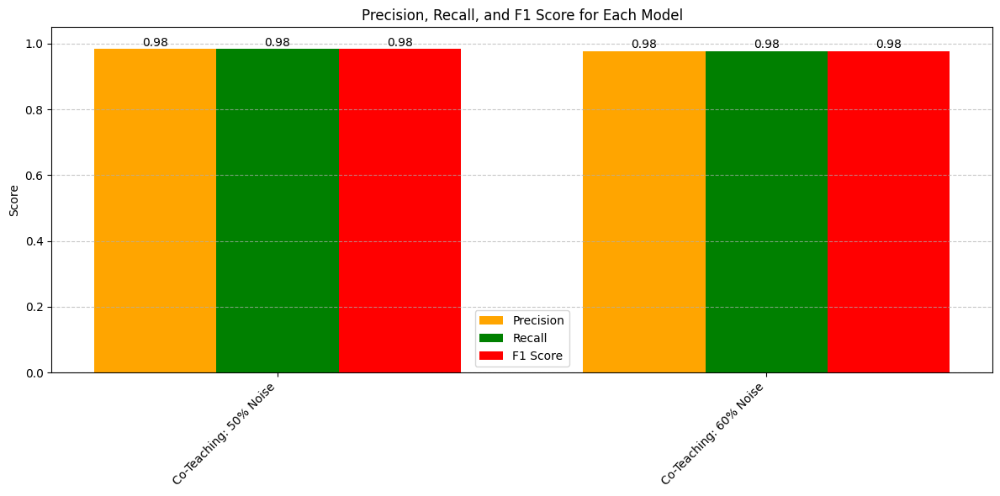

In [ ]:
mnist_json =   [co_teaching_mnist_10_percent_history_path,
                co_teaching_mnist_20_percent_history_path,
                co_teaching_mnist_30_percent_history_path,
                co_teaching_mnist_40_percent_history_path,
                co_teaching_mnist_50_percent_history_path,
                co_teaching_mnist_60_percent_history_path]

model_names = ["Co-Teaching: 10% Noise", "Co-Teaching: 20% Noise",
               "Co-Teaching: 30% Noise", "Co-Teaching: 40% Noise",
               "Co-Teaching: 50% Noise", "Co-Teaching: 60% Noise"]

plot_coteaching_metrics(mnist_json, model_names)

###Plots for CIFAR - 10

In [ ]:
cifar10_apl_json = [co_teaching_cifar10_10_percent_nfl_rce_history_path,
                co_teaching_cifar10_20_percent_nfl_rce_history_path,
                co_teaching_cifar10_30_percent_nfl_rce_history_path,
                co_teaching_cifar10_40_percent_nfl_rce_history_path,
                co_teaching_cifar10_50_percent_nfl_rce_history_path,
                co_teaching_cifar10_60_percent_nfl_rce_history_path]
model_names_apl = ["Co-Teaching w/ NFL+RCE: 10% Noise", "Co-Teaching w/ NFL+RCE: 20% Noise",
               "Co-Teaching w/ NFL+RCE: 30% Noise", "Co-Teaching w/ NFL+RCE: 40% Noise",
               "Co-Teaching w/ NFL+RCE: 50% Noise", "Co-Teaching w/ NFL+RCE: 60% Noise"]

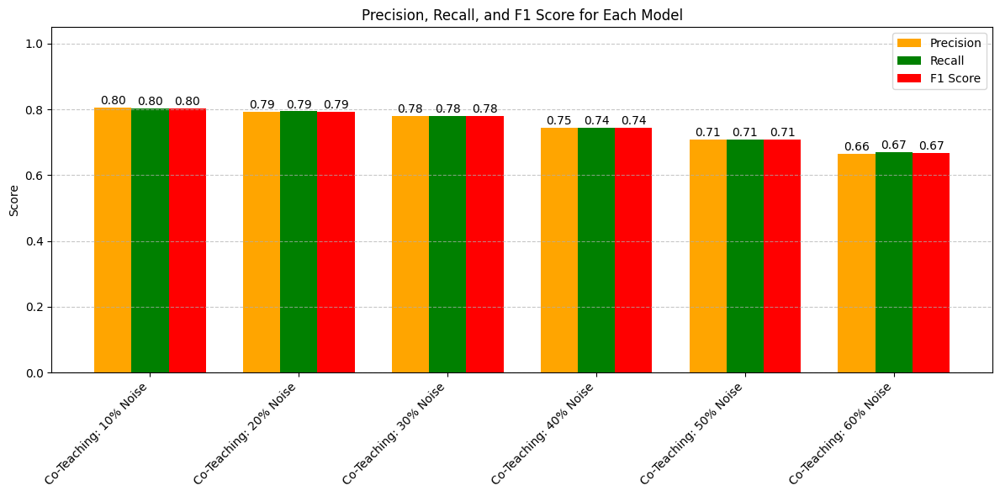

In [ ]:
cifar10_json = [
                co_teaching_cifar10_10_percent_history_path,
                co_teaching_cifar10_20_percent_history_path,
                co_teaching_cifar10_30_percent_history_path,
                co_teaching_cifar10_40_percent_history_path,
                co_teaching_cifar10_50_percent_history_path,
                co_teaching_cifar10_60_percent_history_path]

model_names = ["Co-Teaching: 10% Noise", "Co-Teaching: 20% Noise",
               "Co-Teaching: 30% Noise", "Co-Teaching: 40% Noise",
               "Co-Teaching: 50% Noise", "Co-Teaching: 60% Noise"]

plot_coteaching_metrics(cifar10_json, model_names)

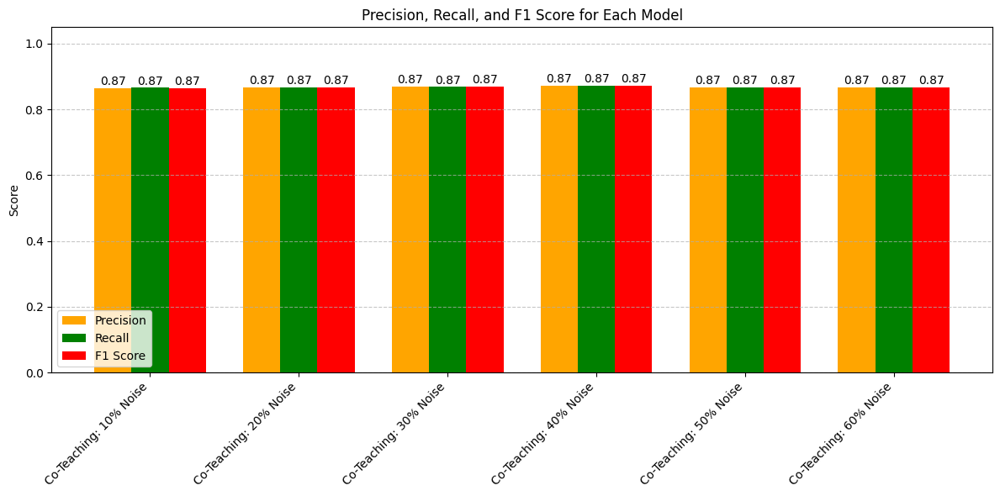

In [ ]:
plot_coteaching_metrics(cifar10_apl_json, model_names)

In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_10_percent_path,
    model2_path=co_teaching2_cifar10_10_percent_path,
    history_json_path=co_teaching_cifar10_10_percent_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_10_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.8025 |       0.9781
Model 2    |       0.8033 |       0.9781


In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_20_percent_path,
    model2_path=co_teaching2_cifar10_20_percent_path,
    history_json_path=co_teaching_cifar10_20_percent_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_20_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.7941 |       0.9771
Model 2    |       0.7928 |       0.9770


In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_30_percent_path,
    model2_path=co_teaching2_cifar10_30_percent_path,
    history_json_path=co_teaching_cifar10_30_percent_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_30_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.7805 |       0.9756
Model 2    |       0.7771 |       0.9752


In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_40_percent_path,
    model2_path=co_teaching2_cifar10_40_percent_path,
    history_json_path=co_teaching_cifar10_40_percent_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_40_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.7438 |       0.9715
Model 2    |       0.7481 |       0.9720


In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_50_percent_path,
    model2_path=co_teaching2_cifar10_50_percent_path,
    history_json_path=co_teaching_cifar10_50_percent_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_50_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.7075 |       0.9675
Model 2    |       0.7116 |       0.9680


In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_60_percent_path,
    model2_path=co_teaching2_cifar10_60_percent_path,
    history_json_path=co_teaching_cifar10_60_percent_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_60_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.6696 |       0.9633
Model 2    |       0.6790 |       0.9643


In [ ]:
evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_10_percent_nfl_rce_path,
    model2_path=co_teaching2_cifar10_10_percent_nfl_rce_path,
    history_json_path=co_teaching_cifar10_10_percent_nfl_rce_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)

evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_20_percent_nfl_rce_path,
    model2_path=co_teaching1_cifar10_20_percent_nfl_rce_path,
    history_json_path=co_teaching_cifar10_20_percent_nfl_rce_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_30_percent_nfl_rce_path,
    model2_path=co_teaching2_cifar10_30_percent_nfl_rce_path,
    history_json_path=co_teaching_cifar10_30_percent_nfl_rce_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)

evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_40_percent_nfl_rce_path,
    model2_path=co_teaching2_cifar10_40_percent_nfl_rce_path,
    history_json_path=co_teaching_cifar10_40_percent_nfl_rce_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)

evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_50_percent_nfl_rce_path,
    model2_path=co_teaching2_cifar10_50_percent_nfl_rce_path,
    history_json_path=co_teaching_cifar10_50_percent_nfl_rce_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)

evaluate_coteaching_models_shared_json(
    model1_path=co_teaching1_cifar10_60_percent_nfl_rce_path,
    model2_path=co_teaching2_cifar10_60_percent_nfl_rce_path,
    history_json_path=co_teaching_cifar10_60_percent_nfl_rce_history_path,
    model_class=CNN8Layer,
    test_loader=cifar10_test_loader,
    device='cuda'
)


Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_10_percent_nfl_rce_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.8656 |       0.9851
Model 2    |       0.8646 |       0.9850

Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_20_percent_nfl_rce_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.8664 |       0.9852
Model 2    |       0.8664 |       0.9852

Co-Teaching Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_30_percent_nfl_rce_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |     

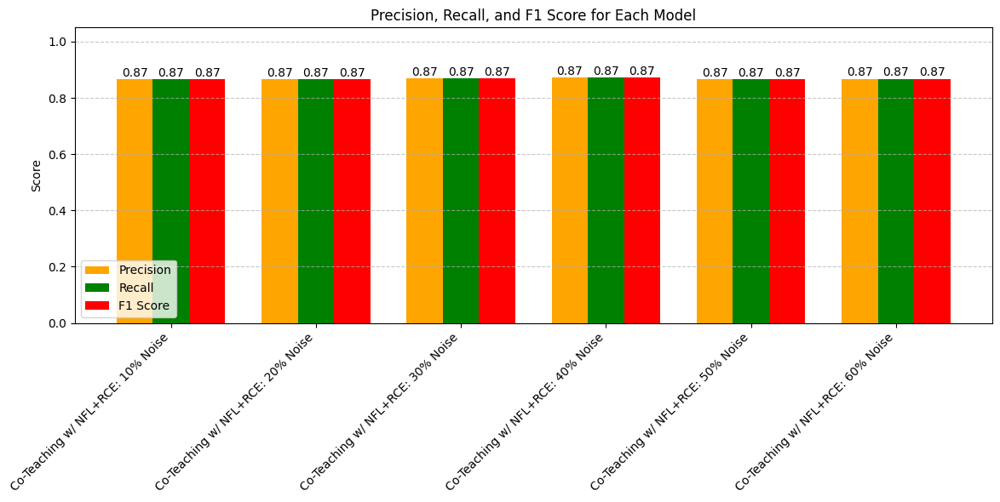

In [ ]:
plot_coteaching_metrics(cifar10_apl_json, model_names_apl)

In [ ]:
plot_dindex(mnist_json, model_names, use_model='model2')

Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_10_percent_history.json > model2: 'model2', skipping.
Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_20_percent_history.json > model2: 'model2', skipping.
Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_30_percent_history.json > model2: 'model2', skipping.
Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_40_percent_history.json > model2: 'model2', skipping.
Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_50_percent_history.json > model2: 'model2', skipping.
Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Chec

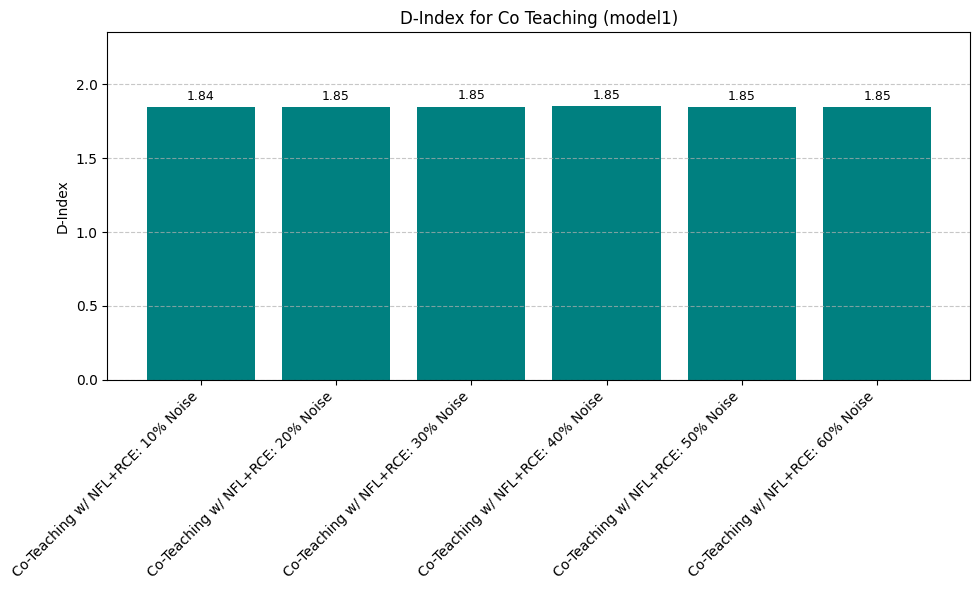

In [ ]:
plot_dindex(cifar10_apl_json, model_names_apl)

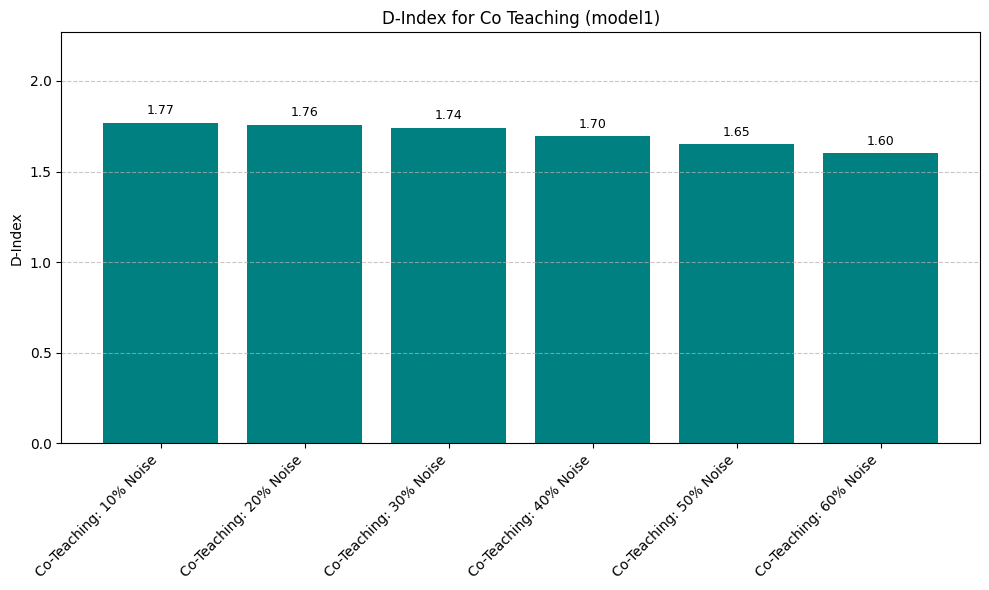

In [ ]:
plot_dindex(cifar10_json, model_names, use_model='model1')

Problem in /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_10_percent_history.json > model2: 'model2', skipping.


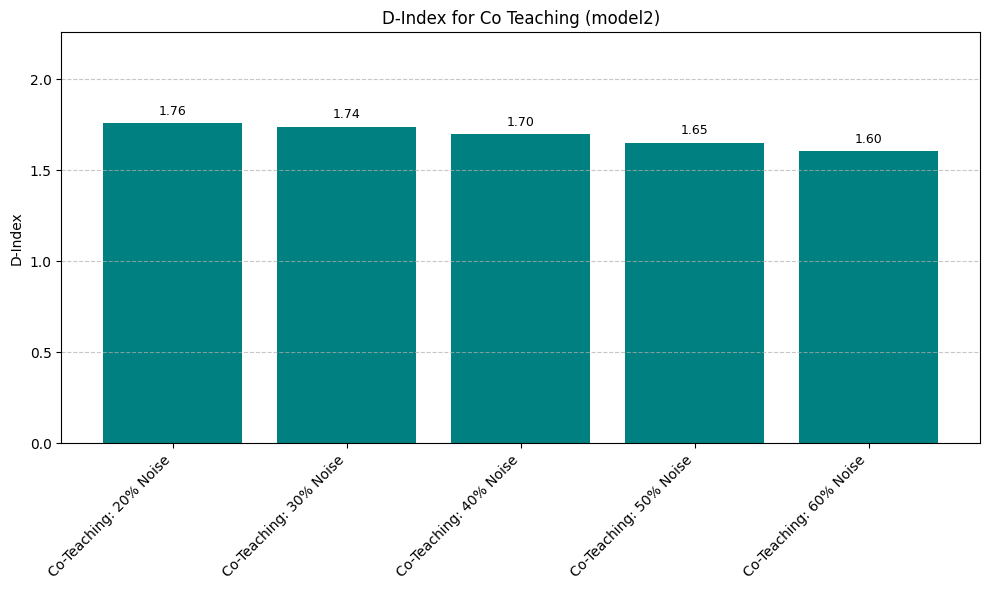

In [ ]:
plot_dindex(cifar10_json, model_names, use_model='model2')

File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_10_percent_history.json, Noise Level: 10%
Training Accuracy: [78.685, 88.005, 88.90833333333333, 89.37333333333333, 89.54666666666667]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_20_percent_history.json, Noise Level: 20%
Training Accuracy: [77.47833333333334, 80.38333333333333, 80.71666666666667, 80.91666666666667, 80.97333333333333]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_30_percent_history.json, Noise Level: 30%
Training Accuracy: [68.64166666666667, 71.52333333333334, 71.85833333333333, 72.0, 72.13333333333334]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/MNIST/co_teaching_mnist_40_percent_history.json, Noise Level: 40%
Training Accuracy: [58.614

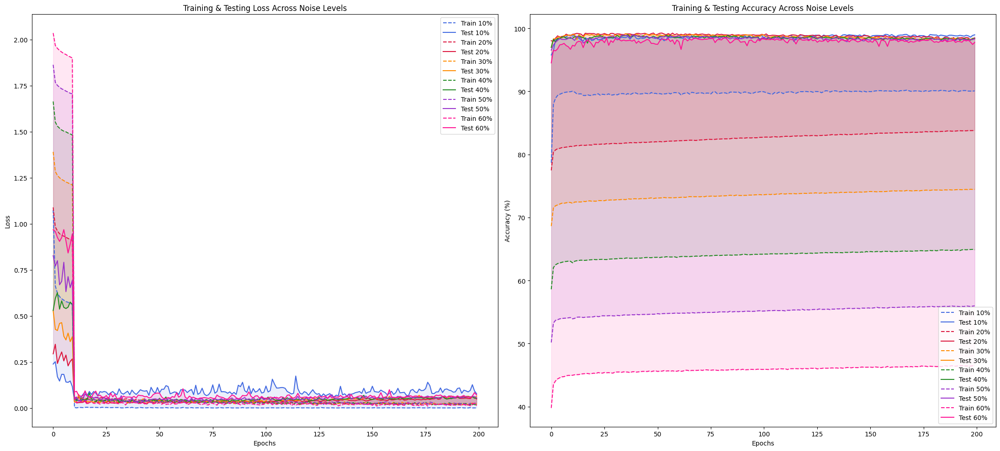

In [ ]:
plot_training_history(mnist_json)

File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_10_percent_history.json, Noise Level: 10%
Training Accuracy: [40.448, 55.708, 61.224000000000004, 65.378, 67.776]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_20_percent_history.json, Noise Level: 20%
Training Accuracy: [34.98, 47.746, 52.876, 55.808, 58.352000000000004]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_30_percent_history.json, Noise Level: 30%
Training Accuracy: [42.333999999999996, 63.002, 65.3, 66.72200000000001, 67.428]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_40_percent_history.json, Noise Level: 40%
Training Accuracy: [25.906000000000002, 34.57, 37.972, 39.944, 42.13]
File: /content/drive/M

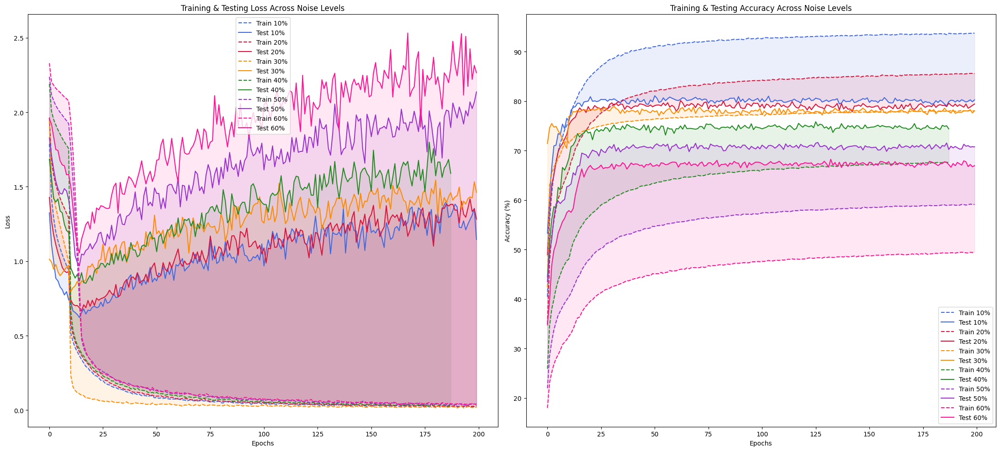

In [ ]:
plot_training_history(cifar10_json)

File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_10_percent_nfl_rce_history.json, Noise Level: Unknown%
Training Accuracy: [65.73, 66.738, 67.848, 68.382, 69.432]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_20_percent_nfl_rce_history.json, Noise Level: Unknown%
Training Accuracy: [64.942, 62.897999999999996, 66.08800000000001, 68.96, 71.078]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_30_percent_nfl_rce_history.json, Noise Level: Unknown%
Training Accuracy: [53.168000000000006, 56.07, 60.934, 64.18199999999999, 65.666]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Co-Teaching/CIFAR 10/co_teaching_cifar10_40_percent_nfl_rce_history.json, Noise Level: Unknown%
Training Accuracy: [45.007999999999996, 5

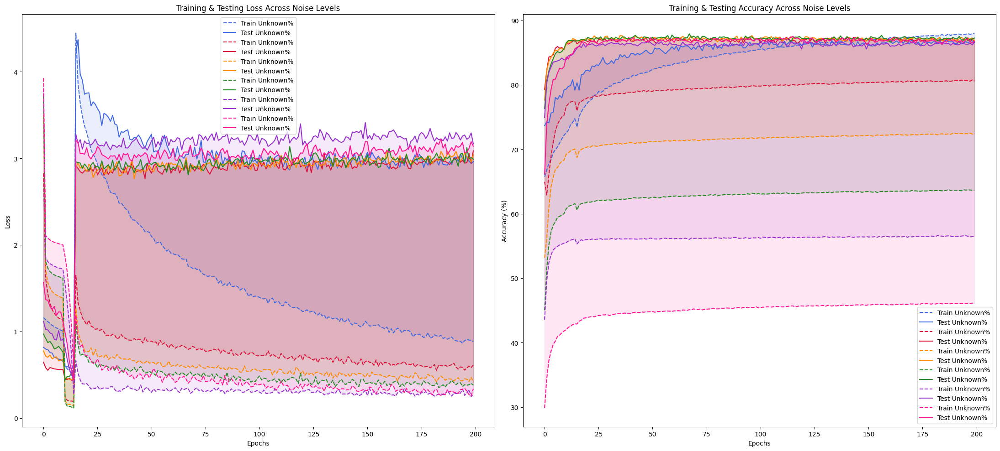

In [ ]:
plot_training_history(cifar10_apl_json)

In [ ]:
import json

with open(co_teaching_cifar10_10_percent_history_path, "r") as f:
    history = json.load(f)

print("train_acc type:", type(history["train_acc"]))
print("train_acc sample:", history["train_acc"][:10])


train_acc type: <class 'list'>
train_acc sample: [0.40448, 0.55708, 0.61224, 0.65378, 0.67776, 0.6984, 0.71604, 0.72676, 0.7416, 0.75088]


In [ ]:
test_loaders = [
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader
]
aplt_pt_paths = [co_teaching1_cifar10_10_percent_nfl_rce_path,
            co_teaching1_cifar10_20_percent_nfl_rce_path,
            co_teaching1_cifar10_30_percent_nfl_rce_path,
            co_teaching1_cifar10_40_percent_nfl_rce_path,
            co_teaching1_cifar10_50_percent_nfl_rce_path,
            co_teaching1_cifar10_60_percent_nfl_rce_path]
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plot_misclassified_classes_from_dataloaders(
    pt_paths=aplt_pt_paths,
    test_loaders=test_loaders,
    model_fn=CNN8Layer,
    class_names=class_names,
    top_n=3)

RuntimeError: Error(s) in loading state_dict for CNN8Layer:
	Missing key(s) in state_dict: "convs.0.weight", "convs.0.bias", "convs.1.weight", "convs.1.bias", "convs.2.weight", "convs.2.bias", "convs.3.weight", "convs.3.bias", "convs.4.weight", "convs.4.bias", "convs.5.weight", "convs.5.bias", "convs.6.weight", "convs.6.bias", "convs.7.weight", "convs.7.bias", "bns.0.weight", "bns.0.bias", "bns.0.running_mean", "bns.0.running_var", "bns.1.weight", "bns.1.bias", "bns.1.running_mean", "bns.1.running_var", "bns.2.weight", "bns.2.bias", "bns.2.running_mean", "bns.2.running_var", "bns.3.weight", "bns.3.bias", "bns.3.running_mean", "bns.3.running_var", "bns.4.weight", "bns.4.bias", "bns.4.running_mean", "bns.4.running_var", "bns.5.weight", "bns.5.bias", "bns.5.running_mean", "bns.5.running_var", "bns.6.weight", "bns.6.bias", "bns.6.running_mean", "bns.6.running_var", "bns.7.weight", "bns.7.bias", "bns.7.running_mean", "bns.7.running_var". 
	Unexpected key(s) in state_dict: "blocks.0.0.weight", "blocks.0.0.bias", "blocks.0.1.weight", "blocks.0.1.bias", "blocks.0.1.running_mean", "blocks.0.1.running_var", "blocks.0.1.num_batches_tracked", "blocks.1.0.weight", "blocks.1.0.bias", "blocks.1.1.weight", "blocks.1.1.bias", "blocks.1.1.running_mean", "blocks.1.1.running_var", "blocks.1.1.num_batches_tracked", "blocks.2.0.weight", "blocks.2.0.bias", "blocks.2.1.weight", "blocks.2.1.bias", "blocks.2.1.running_mean", "blocks.2.1.running_var", "blocks.2.1.num_batches_tracked", "blocks.3.0.weight", "blocks.3.0.bias", "blocks.3.1.weight", "blocks.3.1.bias", "blocks.3.1.running_mean", "blocks.3.1.running_var", "blocks.3.1.num_batches_tracked", "blocks.4.0.weight", "blocks.4.0.bias", "blocks.4.1.weight", "blocks.4.1.bias", "blocks.4.1.running_mean", "blocks.4.1.running_var", "blocks.4.1.num_batches_tracked", "blocks.5.0.weight", "blocks.5.0.bias", "blocks.5.1.weight", "blocks.5.1.bias", "blocks.5.1.running_mean", "blocks.5.1.running_var", "blocks.5.1.num_batches_tracked". 
	size mismatch for fc.weight: copying a param with shape torch.Size([10, 512]) from checkpoint, the shape in current model is torch.Size([10, 6272]).


co_teaching1_cifar10_10_percent_path.pt - Most Misclassified Classes (Noise Level: Unknown%):
  - dog → cat (157 times)
  - cat → dog (90 times)
  - cat → bird (60 times)


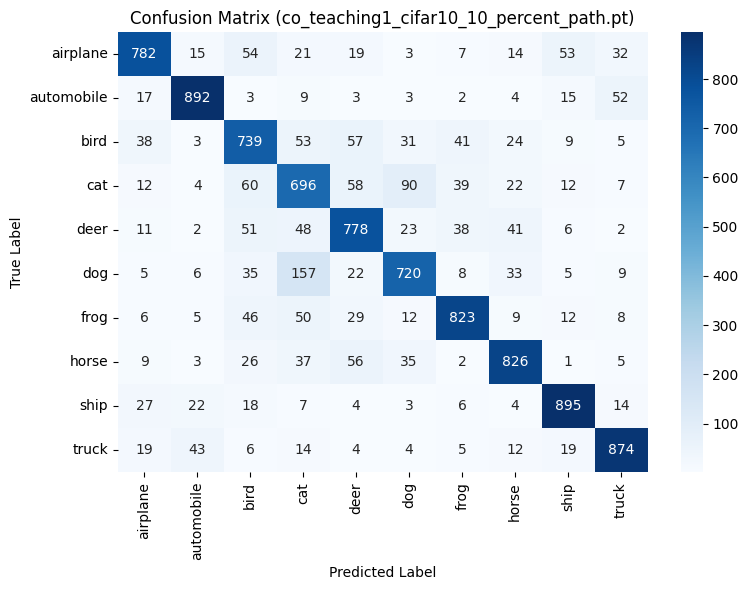


co_teaching1_cifar10_20_percent_path.pt - Most Misclassified Classes (Noise Level: Unknown%):
  - cat → dog (144 times)
  - dog → cat (93 times)
  - deer → horse (71 times)


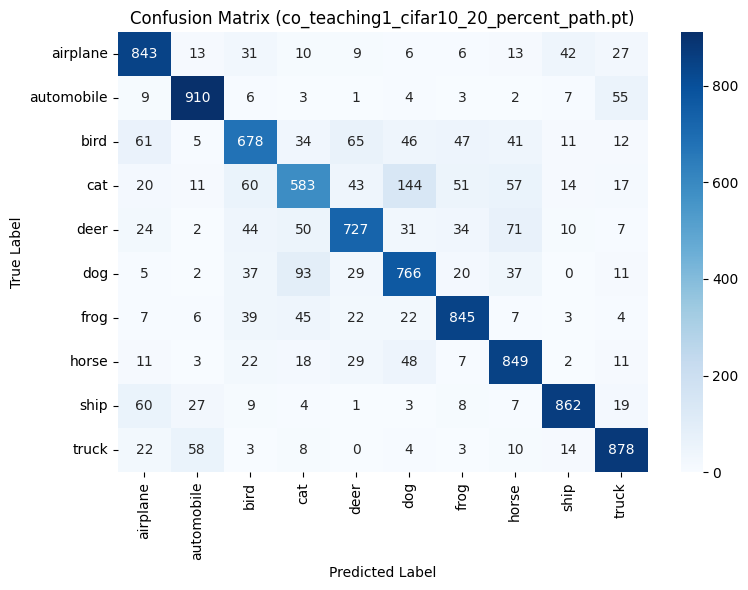


co_teaching1_cifar10_30_percent_path.pt - Most Misclassified Classes (Noise Level: Unknown%):
  - cat → dog (145 times)
  - dog → cat (113 times)
  - bird → deer (74 times)


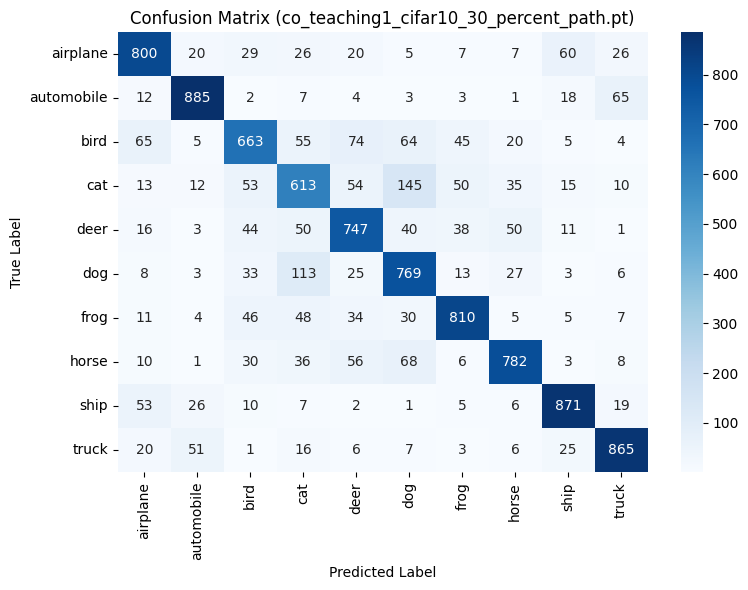


co_teaching1_cifar10_40_percent_path.pt - Most Misclassified Classes (Noise Level: Unknown%):
  - dog → cat (150 times)
  - cat → dog (131 times)
  - deer → bird (99 times)


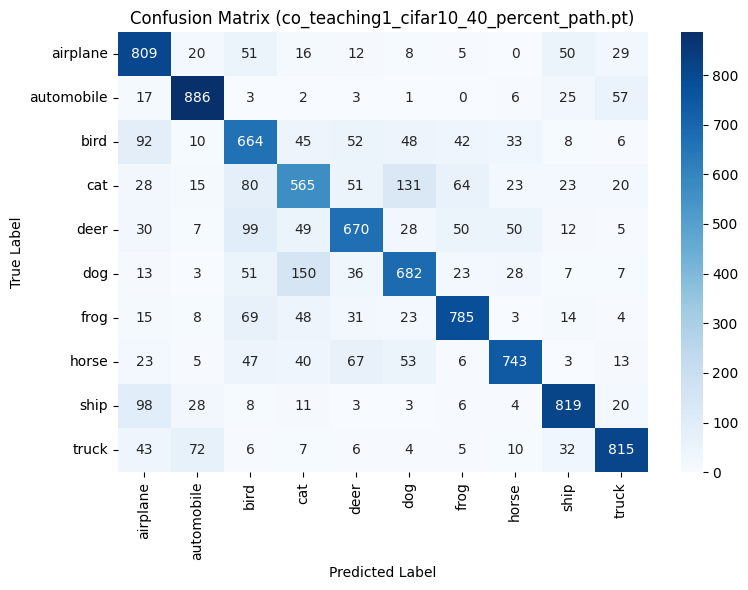


co_teaching1_cifar10_50_percent_path.pt - Most Misclassified Classes (Noise Level: Unknown%):
  - cat → dog (184 times)
  - dog → cat (134 times)
  - deer → horse (118 times)


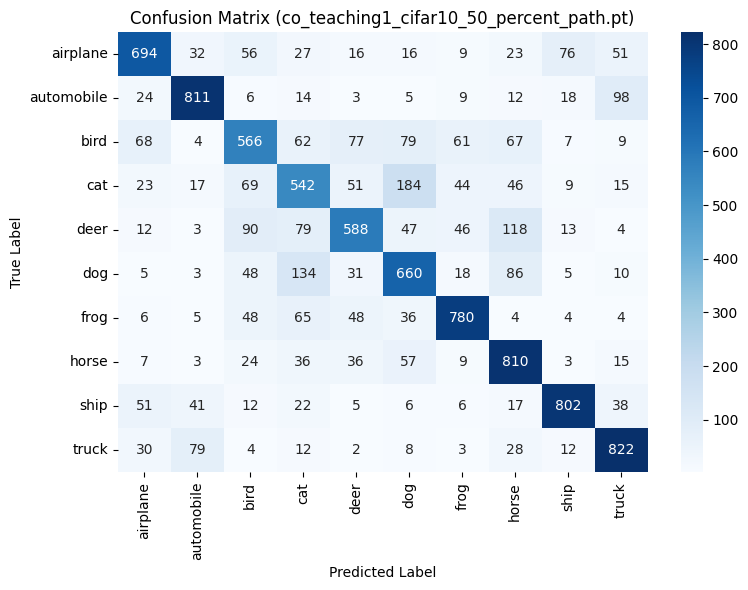


co_teaching1_cifar10_60_percent_path.pt - Most Misclassified Classes (Noise Level: Unknown%):
  - cat → dog (166 times)
  - dog → cat (146 times)
  - bird → deer (114 times)


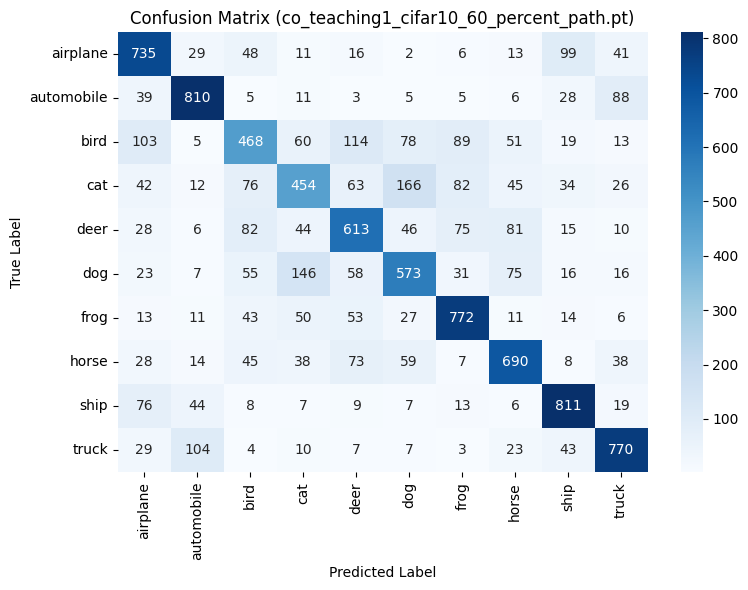

In [ ]:
test_loaders = [
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader,
    cifar10_test_loader
]


pt_paths = [co_teaching1_cifar10_10_percent_path,
            co_teaching1_cifar10_20_percent_path,
            co_teaching1_cifar10_30_percent_path,
            co_teaching1_cifar10_40_percent_path,
            co_teaching1_cifar10_50_percent_path,
            co_teaching1_cifar10_60_percent_path]

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']


plot_misclassified_classes_from_dataloaders(
    pt_paths=pt_paths,
    test_loaders=test_loaders,
    model_fn=CNN8Layer,
    class_names=class_names,
    top_n=3)


In [ ]:
import torch

torch.serialization.add_safe_globals([CNN8Layer, torch.nn.modules.container.ModuleList, torch.nn.modules.conv.Conv2d, torch.nn.modules.activation.ReLU, torch.nn.modules.pooling.MaxPool2d, torch.nn.modules.linear.Linear])

test_loaders = [
    test_loader_mnist,
    test_loader_mnist,
    test_loader_mnist,
    test_loader_mnist,
    test_loader_mnist,
    test_loader_mnist
]

pt_paths = [co_teaching1_mnist_10_percent_path,
            co_teaching1_mnist_20_percent_path,
            co_teaching1_mnist_30_percent_path,
            co_teaching1_mnist_40_percent_path,
            co_teaching1_mnist_50_percent_path,
            co_teaching1_mnist_60_percent_path]

class_names = ['0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9']

plot_misclassified_classes_from_dataloaders(
    pt_paths=pt_paths,
    test_loaders=test_loaders,
    model_fn=CNN8Layer,
    class_names=class_names,
    top_n=3)

UnpicklingError: Weights only load failed. This file can still be loaded, to do so you have two options, [1mdo those steps only if you trust the source of the checkpoint[0m. 
	(1) In PyTorch 2.6, we changed the default value of the `weights_only` argument in `torch.load` from `False` to `True`. Re-running `torch.load` with `weights_only` set to `False` will likely succeed, but it can result in arbitrary code execution. Do it only if you got the file from a trusted source.
	(2) Alternatively, to load with `weights_only=True` please check the recommended steps in the following error message.
	WeightsUnpickler error: Unsupported global: GLOBAL torch.nn.modules.batchnorm.BatchNorm2d was not an allowed global by default. Please use `torch.serialization.add_safe_globals([BatchNorm2d])` or the `torch.serialization.safe_globals([BatchNorm2d])` context manager to allowlist this global if you trust this class/function.

Check the documentation of torch.load to learn more about types accepted by default with weights_only https://pytorch.org/docs/stable/generated/torch.load.html.

## Co Teaching with "Normal 8 Layer CNN"


In [ ]:
class CNN8Layer(nn.Module):
    def __init__(self, cnn_type='cifar10', num_classes=10,
                 layer_nodes=[128, 96, 80, 64, 48, 32],
                 kernel_sizes=[3, 3, 3, 3, 3, 3],
                 pooling_type='max', dropout_rate=0.25):
        super(CNN8Layer, self).__init__()

        if cnn_type == 'mnist':
            input_channels = 1
            input_size = 28
        elif cnn_type == 'cifar10':
            input_channels = 3
            input_size = 32
        else:
            raise ValueError("add the dimensions of new datasets'")

        self.blocks = nn.ModuleList()
        in_channels = input_channels
        pooled_layers = 0

        for i, out_channels in enumerate(layer_nodes):
            block = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=kernel_sizes[i], padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU()
            )

            if i % 2 == 1:
                pool = nn.AvgPool2d(2) if pooling_type == 'avg' else nn.MaxPool2d(2)
                block.add_module("pool", pool)
                block.add_module("dropout", nn.Dropout(dropout_rate))
                pooled_layers += 1

            self.blocks.append(block)
            in_channels = out_channels

        final_spatial = input_size // (2 ** pooled_layers)
        self.fc = nn.Linear(in_channels * final_spatial * final_spatial, num_classes)

    def forward(self, x):
        for block in self.blocks:
            x = block(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)

    def forward(self, x):
        for conv, bn in zip(self.convs, self.bns):
            x = conv(x)
            x = bn(x)
            x = torch.relu(x)
        x = self.pool(x)
        x = self.dropout(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)


def get_forget_rate_schedule(tau, trans_period, warmup_epochs=9):
    def schedule(epoch):
        if epoch < warmup_epochs:
            return 0.0
        else:
            progress = min((epoch - warmup_epochs) / (trans_period - warmup_epochs), 1.0)
            return tau * progress
    return schedule


def small_loss_samples(losses, forget_rate):
    batch_size = losses.size(0)
    samples_kept = int((1 - forget_rate) * batch_size)
    _, indices = torch.topk(-losses, samples_kept)
    return indices


def evaluate_with_loss(model, dataloader, loss_fn, device):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = loss_fn(outputs, targets).mean()
            total_loss += loss.item()
            preds = outputs.argmax(dim=1)
            correct += (preds == targets).sum().item()
            total += targets.size(0)
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    return avg_loss, accuracy * 100


def train_co_teaching(model1, model2, optimizer1, optimizer2, train_loader,
                      loss_fn, forget_rate_schedule, num_epochs, device, test_loader,
                      model1_path, model2_path, history_path):


    history = {
        'epoch': [],
        'forget_rate': [],
        "train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": [],
        "test_precision": [],
        "test_recall": []
    }

    model1.to(device)
    model2.to(device)

    for epoch in range(num_epochs):
        model1.train()
        model2.train()
        forget_rate = forget_rate_schedule(epoch)
        print(f"\nEpoch {epoch+1}/{num_epochs} | Forget Rate: {forget_rate:.4f}")

        running_loss = 0.0
        correct_total = 0
        total_samples = 0

        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            logits1 = model1(inputs)
            logits2 = model2(inputs)

            loss1 = loss_fn(logits1, targets)
            loss2 = loss_fn(logits2, targets)

            idx1 = small_loss_samples(loss2, forget_rate)
            idx2 = small_loss_samples(loss1, forget_rate)

            clean_inputs1, clean_targets1 = inputs[idx1], targets[idx1]
            clean_inputs2, clean_targets2 = inputs[idx2], targets[idx2]

            final_loss1 = loss_fn(model1(clean_inputs1), clean_targets1).mean()
            final_loss2 = loss_fn(model2(clean_inputs2), clean_targets2).mean()

            optimizer1.zero_grad()
            final_loss1.backward()
            optimizer1.step()

            optimizer2.zero_grad()
            final_loss2.backward()
            optimizer2.step()

            with torch.no_grad():
                outputs = model1(inputs)
                preds = outputs.argmax(dim=1)
                correct_total += (preds == targets).sum().item()
                total_samples += targets.size(0)
                running_loss += final_loss1.item()

        train_loss = running_loss / len(train_loader)
        train_acc = correct_total / total_samples

        model1.eval()
        all_preds = []
        all_targets = []
        test_loss_total = 0.0

        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model1(inputs)
                loss = loss_fn(outputs, targets).mean()
                test_loss_total += loss.item()

                preds = outputs.argmax(dim=1).cpu().numpy()
                targets = targets.cpu().numpy()
                all_preds.extend(preds)
                all_targets.extend(targets)

        test_loss = test_loss_total / len(test_loader)
        test_acc = (np.array(all_preds) == np.array(all_targets)).mean() * 100
        test_precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
        test_recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)

        history['epoch'].append(epoch)
        history['forget_rate'].append(forget_rate)
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["test_loss"].append(test_loss)
        history["test_acc"].append(test_acc)
        history["test_precision"].append(test_precision)
        history["test_recall"].append(test_recall)

        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2%} | Test Acc: {test_acc:.2f}% | Test Precision: {test_precision:.4f} | Test Recall: {test_recall:.4f}")

        torch.save(model1.state_dict(), model1_path)
        torch.save(model2.state_dict(), model2_path)

        with open(history_path, "w") as f:
            json.dump(history, f)

    return model1, model2, history

########################CO TEACHING FOR NLF+RCE#################################################################################
def train_co_teaching_apl(model1, model2, optimizer1, optimizer2, train_loader, test_loader,
                          warmup_epochs, total_epochs, device, alpha=1.0, beta=1.0, gamma=2.0,
                          forget_schedule=None, model1_path=None, model2_path=None, history_path=None):
    history = {
        'epoch': [],
        'train_loss': [],
        'train_acc': [],
        'train_precision': [],
        'train_recall': [],
        'test_loss': [],
        'test_acc': [],
        'test_precision': [],
        'test_recall': []
    }

    model1.to(device)
    model2.to(device)

    for epoch in range(total_epochs):
        model1.train()
        model2.train()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        all_preds = []
        all_targets = []

        forget_rate = forget_schedule(epoch) if forget_schedule else 0.0
        print(f"\nEpoch {epoch + 1}/{total_epochs} | Forget Rate: {forget_rate:.4f}")

        for inputs, noisy_targets, true_targets in train_loader:
            inputs = inputs.to(device)
            noisy_targets = noisy_targets.to(device)
            true_targets = true_targets.to(device)

            logits1 = model1(inputs)
            logits2 = model2(inputs)

            if epoch < warmup_epochs:
                loss1 = F.cross_entropy(logits1, noisy_targets, reduction='none')
                loss2 = F.cross_entropy(logits2, noisy_targets, reduction='none')
            else:
                loss1 = nfl_rce_loss_fn(logits1, noisy_targets, alpha, beta, gamma)
                loss2 = nfl_rce_loss_fn(logits2, noisy_targets, alpha, beta, gamma)

            idx1 = small_loss_samples(loss2.detach(), forget_rate)
            idx2 = small_loss_samples(loss1.detach(), forget_rate)

            clean_inputs1, clean_targets1 = inputs[idx1], noisy_targets[idx1]
            clean_inputs2, clean_targets2 = inputs[idx2], noisy_targets[idx2]

            if epoch < warmup_epochs:
                final_loss1 = F.cross_entropy(model1(clean_inputs1), clean_targets1)
                final_loss2 = F.cross_entropy(model2(clean_inputs2), clean_targets2)
            else:
                final_loss1 = nfl_rce_loss_fn(model1(clean_inputs1), clean_targets1, alpha, beta, gamma).mean()
                final_loss2 = nfl_rce_loss_fn(model2(clean_inputs2), clean_targets2, alpha, beta, gamma).mean()

            optimizer1.zero_grad()
            final_loss1.backward()
            optimizer1.step()

            optimizer2.zero_grad()
            final_loss2.backward()
            optimizer2.step()

            with torch.no_grad():
                preds = model1(inputs).argmax(dim=1)
                total_correct += (preds == true_targets).sum().item()
                total_samples += true_targets.size(0)
                total_loss += final_loss1.item()
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(true_targets.cpu().numpy())

        train_loss = total_loss / len(train_loader)
        train_acc = total_correct / total_samples
        train_precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
        train_recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)

        test_loss, test_acc = evaluate_with_loss(model1, test_loader, F.cross_entropy, device)
        test_preds, test_labels = [], []
        model1.eval()
        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.to(device), y.to(device)
                preds = model1(x).argmax(dim=1)
                test_preds.extend(preds.cpu().numpy())
                test_labels.extend(y.cpu().numpy())
        test_precision = precision_score(test_labels, test_preds, average='macro', zero_division=0)
        test_recall = recall_score(test_labels, test_preds, average='macro', zero_division=0)

        history['epoch'].append(epoch)
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['train_precision'].append(train_precision)
        history['train_recall'].append(train_recall)
        history['test_loss'].append(test_loss)
        history['test_acc'].append(test_acc)
        history['test_precision'].append(test_precision)
        history['test_recall'].append(test_recall)

        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2%} | Test Acc: {test_acc:.2f}%")

        if model1_path: torch.save(model1.state_dict(), model1_path)
        if model2_path: torch.save(model2.state_dict(), model2_path)
        if history_path:
            with open(history_path, 'w') as f:
                json.dump(history, f)

    return model1, model2, history

## Importing and Corrupting CIFAR-10

In [ ]:
def cifar10_dataloaders_with_noise(noise_ratio=0.1, batch_size=128):
    (x_train, y_train), (x_test, y_test) = cifar10.load_data()
    y_train = y_train.flatten()
    y_test = y_test.flatten()
    num_classes = 10

    corrupted_y_train = introduce_label_noise(y_train, num_classes, noise_ratio)

    x_train_tensor = torch.tensor(x_train).permute(0, 3, 1, 2).float() / 255.0
    x_test_tensor = torch.tensor(x_test).permute(0, 3, 1, 2).float() / 255.0

    y_train_tensor = torch.tensor(corrupted_y_train).long()
    y_test_tensor = torch.tensor(y_test).long()

    train_loader = DataLoader(TensorDataset(x_train_tensor, y_train_tensor), batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(TensorDataset(x_test_tensor, y_test_tensor), batch_size=batch_size, shuffle=False)

    return train_loader, test_loader

cifar10_train_loader_10, cifar10_test_loader = cifar10_dataloaders_with_noise(noise_ratio=0.1)
cifar10_train_loader_20, cifar10_test_loader = cifar10_dataloaders_with_noise(noise_ratio=0.2)
cifar10_train_loader_30, cifar10_test_loader = cifar10_dataloaders_with_noise(noise_ratio=0.3)
cifar10_train_loader_40, cifar10_test_loader = cifar10_dataloaders_with_noise(noise_ratio=0.4)
cifar10_train_loader_50, cifar10_test_loader = cifar10_dataloaders_with_noise(noise_ratio=0.5)
cifar10_train_loader_60, cifar10_test_loader = cifar10_dataloaders_with_noise(noise_ratio=0.6)

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


## Setting Up Models and Forget Schedule

In [ ]:
model1 = CNN8Layer()
model2 = CNN8Layer()

optimizer1 = torch.optim.Adam(model1.parameters(), lr=0.0001)
optimizer2 = torch.optim.Adam(model2.parameters(), lr=0.0001)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
print(device)

cuda


#Co Teaching with CIFAR10

## CIFAR-10 Training Co Teaching - 10% - 60% Label Corruption

In [ ]:
forget_schedule = get_forget_rate_schedule(tau = 0.1, trans_period = 10)
train_co_teaching(model1, model2,
                  optimizer1, optimizer2,
                  cifar10_train_loader_10,
                  nn.CrossEntropyLoss(reduction='none'),
                  forget_schedule,
                  num_epochs=200,
                  device=device,
                  test_loader=cifar10_test_loader,
                  model1_path = co_teaching1_cifar10_10_percent_path,
                  model2_path = co_teaching2_cifar10_10_percent_path,
                  history_path = co_teaching_cifar10_10_percent_history_path)


Epoch 1/200 | Forget Rate: 0.0000
Train Loss: 1.7878 | Train Acc: 40.45% | Test Acc: 53.29% | Test Precision: 0.5465 | Test Recall: 0.5329

Epoch 2/200 | Forget Rate: 0.0000
Train Loss: 1.4233 | Train Acc: 55.71% | Test Acc: 61.23% | Test Precision: 0.6261 | Test Recall: 0.6123

Epoch 3/200 | Forget Rate: 0.0000
Train Loss: 1.2898 | Train Acc: 61.22% | Test Acc: 66.59% | Test Precision: 0.6839 | Test Recall: 0.6659

Epoch 4/200 | Forget Rate: 0.0000
Train Loss: 1.1975 | Train Acc: 65.38% | Test Acc: 70.95% | Test Precision: 0.7160 | Test Recall: 0.7095

Epoch 5/200 | Forget Rate: 0.0000
Train Loss: 1.1373 | Train Acc: 67.78% | Test Acc: 71.09% | Test Precision: 0.7297 | Test Recall: 0.7109

Epoch 6/200 | Forget Rate: 0.0000
Train Loss: 1.0880 | Train Acc: 69.84% | Test Acc: 73.42% | Test Precision: 0.7415 | Test Recall: 0.7342

Epoch 7/200 | Forget Rate: 0.0000
Train Loss: 1.0451 | Train Acc: 71.60% | Test Acc: 73.27% | Test Precision: 0.7465 | Test Recall: 0.7327

Epoch 8/200 | Forge

(CNN8Layer(
   (convs): ModuleList(
     (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (1): Conv2d(128, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (2): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (3): Conv2d(96, 80, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (4): Conv2d(80, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (5): Conv2d(64, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (6): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (7): Conv2d(48, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   )
   (bns): ModuleList(
     (0): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (1-2): 2 x BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (3): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, 

In [ ]:
forget_schedule = get_forget_rate_schedule(tau = 0.2, trans_period = 10)
train_co_teaching(model1, model2,
                     optimizer1, optimizer2,
                     cifar10_train_loader_20,
                     nn.CrossEntropyLoss(reduction = 'none'),
                     forget_schedule,
                     num_epochs = 200,
                     device = device,
                     test_loader = cifar10_test_loader,
                     model1_path = co_teaching1_cifar10_20_percent_path,
                     model2_path = co_teaching2_cifar10_20_percent_path,
                     history_path = co_teaching_cifar10_20_percent_history_path)

forget_schedule = get_forget_rate_schedule(tau = 0.3, trans_period = 10)
train_co_teaching(model1, model2,
                  optimizer1, optimizer2,
                  cifar10_train_loader_30,
                  nn.CrossEntropyLoss(reduction='none'),
                  forget_schedule,
                  num_epochs=200,
                  device=device,
                  test_loader=cifar10_test_loader,
                  model1_path=co_teaching1_cifar10_30_percent_path,
                  model2_path=co_teaching2_cifar10_30_percent_path,
                  history_path=co_teaching_cifar10_30_percent_history_path)


Epoch 1/200 | Forget Rate: 0.0000
Train Loss: 1.9644 | Train Acc: 34.98% | Test Acc: 48.92% | Test Precision: 0.5233 | Test Recall: 0.4892

Epoch 2/200 | Forget Rate: 0.0000
Train Loss: 1.6741 | Train Acc: 47.75% | Test Acc: 58.11% | Test Precision: 0.5830 | Test Recall: 0.5811

Epoch 3/200 | Forget Rate: 0.0000
Train Loss: 1.5760 | Train Acc: 52.88% | Test Acc: 63.17% | Test Precision: 0.6459 | Test Recall: 0.6317

Epoch 4/200 | Forget Rate: 0.0000
Train Loss: 1.5130 | Train Acc: 55.81% | Test Acc: 65.06% | Test Precision: 0.6514 | Test Recall: 0.6506

Epoch 5/200 | Forget Rate: 0.0000
Train Loss: 1.4649 | Train Acc: 58.35% | Test Acc: 67.62% | Test Precision: 0.6985 | Test Recall: 0.6762

Epoch 6/200 | Forget Rate: 0.0000
Train Loss: 1.4232 | Train Acc: 60.24% | Test Acc: 69.79% | Test Precision: 0.7108 | Test Recall: 0.6979

Epoch 7/200 | Forget Rate: 0.0000
Train Loss: 1.3870 | Train Acc: 61.52% | Test Acc: 70.79% | Test Precision: 0.7108 | Test Recall: 0.7079

Epoch 8/200 | Forge

(CNN8Layer(
   (convs): ModuleList(
     (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (1): Conv2d(128, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (2): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (3): Conv2d(96, 80, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (4): Conv2d(80, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (5): Conv2d(64, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (6): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (7): Conv2d(48, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   )
   (bns): ModuleList(
     (0): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (1-2): 2 x BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (3): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, 

In [ ]:
forget_schedule = get_forget_rate_schedule(tau = 0.4, trans_period = 10)
train_co_teaching(model1, model2,
                     optimizer1, optimizer2,
                     cifar10_train_loader_40,
                     nn.CrossEntropyLoss(reduction = 'none'),
                     forget_schedule,
                     num_epochs = 200,
                     device = device,
                     test_loader = cifar10_test_loader,
                     model1_path = co_teaching1_cifar10_40_percent_path,
                     model2_path = co_teaching2_cifar10_40_percent_path,
                     history_path = co_teaching_cifar10_40_percent_history_path)

forget_schedule = get_forget_rate_schedule(tau = 0.5, trans_period = 15)
train_co_teaching(model1, model2,
                  optimizer1, optimizer2,
                  cifar10_train_loader_50,
                  nn.CrossEntropyLoss(reduction='none'),
                  forget_schedule,
                  num_epochs=200,
                  device=device,
                  test_loader=cifar10_test_loader,
                  model1_path=co_teaching1_cifar10_50_percent_path,
                  model2_path=co_teaching2_cifar10_50_percent_path,
                  history_path=co_teaching_cifar10_50_percent_history_path)



Epoch 1/200 | Forget Rate: 0.0000
Train Loss: 2.1894 | Train Acc: 25.91% | Test Acc: 44.44% | Test Precision: 0.4787 | Test Recall: 0.4444

Epoch 2/200 | Forget Rate: 0.0000
Train Loss: 2.0064 | Train Acc: 34.57% | Test Acc: 51.40% | Test Precision: 0.5212 | Test Recall: 0.5140

Epoch 3/200 | Forget Rate: 0.0000
Train Loss: 1.9518 | Train Acc: 37.97% | Test Acc: 56.06% | Test Precision: 0.5770 | Test Recall: 0.5606

Epoch 4/200 | Forget Rate: 0.0000
Train Loss: 1.9149 | Train Acc: 39.94% | Test Acc: 58.69% | Test Precision: 0.5872 | Test Recall: 0.5869

Epoch 5/200 | Forget Rate: 0.0000
Train Loss: 1.8821 | Train Acc: 42.13% | Test Acc: 58.34% | Test Precision: 0.5977 | Test Recall: 0.5834

Epoch 6/200 | Forget Rate: 0.0000
Train Loss: 1.8534 | Train Acc: 43.74% | Test Acc: 62.57% | Test Precision: 0.6367 | Test Recall: 0.6257

Epoch 7/200 | Forget Rate: 0.0000
Train Loss: 1.8250 | Train Acc: 44.92% | Test Acc: 62.05% | Test Precision: 0.6429 | Test Recall: 0.6205

Epoch 8/200 | Forge

In [ ]:
forget_schedule = get_forget_rate_schedule(tau = 0.6, trans_period = 15)
train_co_teaching(model1, model2,
                  optimizer1, optimizer2,
                  cifar10_train_loader_60,
                  nn.CrossEntropyLoss(reduction='none'),
                  forget_schedule,
                  num_epochs=200,
                  device=device,
                  test_loader=cifar10_test_loader,
                  model1_path=co_teaching1_cifar10_60_percent_path,
                  model2_path=co_teaching2_cifar10_60_percent_path,
                  history_path=co_teaching_cifar10_60_percent_history_path)


Epoch 1/200 | Forget Rate: 0.0000
Train Loss: 2.3290 | Train Acc: 17.99% | Test Acc: 34.76% | Test Precision: 0.4376 | Test Recall: 0.3476

Epoch 2/200 | Forget Rate: 0.0000
Train Loss: 2.2035 | Train Acc: 23.17% | Test Acc: 39.87% | Test Precision: 0.4227 | Test Recall: 0.3987

Epoch 3/200 | Forget Rate: 0.0000
Train Loss: 2.1816 | Train Acc: 25.19% | Test Acc: 46.85% | Test Precision: 0.5080 | Test Recall: 0.4685

Epoch 4/200 | Forget Rate: 0.0000
Train Loss: 2.1611 | Train Acc: 26.82% | Test Acc: 49.85% | Test Precision: 0.5172 | Test Recall: 0.4985

Epoch 5/200 | Forget Rate: 0.0000
Train Loss: 2.1456 | Train Acc: 27.95% | Test Acc: 51.19% | Test Precision: 0.5424 | Test Recall: 0.5119

Epoch 6/200 | Forget Rate: 0.0000
Train Loss: 2.1338 | Train Acc: 28.77% | Test Acc: 53.36% | Test Precision: 0.5644 | Test Recall: 0.5336

Epoch 7/200 | Forget Rate: 0.0000
Train Loss: 2.1176 | Train Acc: 29.67% | Test Acc: 54.45% | Test Precision: 0.5506 | Test Recall: 0.5445

Epoch 8/200 | Forge

(CNN8Layer(
   (convs): ModuleList(
     (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (1): Conv2d(128, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (2): Conv2d(96, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (3): Conv2d(96, 80, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (4): Conv2d(80, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (5): Conv2d(64, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (6): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (7): Conv2d(48, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
   )
   (bns): ModuleList(
     (0): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (1-2): 2 x BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (3): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, 

##CIFAR-10 Training Co Teaching with NFL+RCE 10% - 60% Label Corruption


In [ ]:
def train_co_teaching_apl(model1, model2, optimizer1, optimizer2, train_loader, test_loader,
                          warmup_epochs, total_epochs, device, alpha=1.0, beta=1.0, gamma=2.0,
                          forget_schedule=None, model1_path=None, model2_path=None, history_path=None):
    history = {
        'epoch': [],
        'train_loss': [],
        'train_acc': [],
        'train_precision': [],
        'train_recall': [],
        'test_loss': [],
        'test_acc': [],
        'test_precision': [],
        'test_recall': []
    }

    model1.to(device)
    model2.to(device)

    for epoch in range(total_epochs):
        model1.train()
        model2.train()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        all_preds = []
        all_targets = []

        forget_rate = forget_schedule(epoch) if forget_schedule else 0.0
        print(f"\nEpoch {epoch + 1}/{total_epochs} | Forget Rate: {forget_rate:.4f}")

        for inputs, noisy_targets in train_loader:
            inputs = inputs.to(device)
            noisy_targets = noisy_targets.to(device)

            logits1 = model1(inputs)
            logits2 = model2(inputs)

            if epoch < warmup_epochs:
                loss1 = F.cross_entropy(logits1, noisy_targets, reduction='none')
                loss2 = F.cross_entropy(logits2, noisy_targets, reduction='none')
            else:
                loss1 = nfl_rce_loss_fn(logits1, noisy_targets, alpha, beta, gamma)
                loss2 = nfl_rce_loss_fn(logits2, noisy_targets, alpha, beta, gamma)

            idx1 = small_loss_samples(loss2.detach(), forget_rate)
            idx2 = small_loss_samples(loss1.detach(), forget_rate)

            clean_inputs1, clean_targets1 = inputs[idx1], noisy_targets[idx1]
            clean_inputs2, clean_targets2 = inputs[idx2], noisy_targets[idx2]

            if epoch < warmup_epochs:
                final_loss1 = F.cross_entropy(model1(clean_inputs1), clean_targets1)
                final_loss2 = F.cross_entropy(model2(clean_inputs2), clean_targets2)
            else:
                final_loss1 = nfl_rce_loss_fn(model1(clean_inputs1), clean_targets1, alpha, beta, gamma).mean()
                final_loss2 = nfl_rce_loss_fn(model2(clean_inputs2), clean_targets2, alpha, beta, gamma).mean()

            optimizer1.zero_grad()
            final_loss1.backward()
            optimizer1.step()

            optimizer2.zero_grad()
            final_loss2.backward()
            optimizer2.step()

            with torch.no_grad():
                preds = model1(inputs).argmax(dim=1)
                total_correct += (preds == noisy_targets).sum().item()
                total_samples += noisy_targets.size(0)
                total_loss += final_loss1.item()
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(noisy_targets.cpu().numpy())

        train_acc = total_correct / total_samples
        train_loss = total_loss / len(train_loader)
        train_precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
        train_recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)

        history['epoch'].append(epoch)
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['train_precision'].append(train_precision)
        history['train_recall'].append(train_recall)

        test_loss, test_acc, test_precision, test_recall = evaluate_apl(
            model1, test_loader, device, alpha, beta, gamma,
            epoch < warmup_epochs
        )

        history['test_loss'].append(test_loss)
        history['test_acc'].append(test_acc)
        history['test_precision'].append(test_precision)
        history['test_recall'].append(test_recall)

        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2%} | Train Precision: {train_precision:.4f} | Train Recall: {train_recall:.4f}")
        print(f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.2f}% | Test Precision: {test_precision:.4f} | Test Recall: {test_recall:.4f}")

        if model1_path and model2_path:
            torch.save(model1.state_dict(), model1_path)
            torch.save(model2.state_dict(), model2_path)

        if history_path:
            with open(history_path, "w") as f:
                json.dump(history, f)

    return model1, model2, history


def evaluate_apl(model, dataloader, device, alpha, beta, gamma, use_cross_entropy):
    model.eval()
    total_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)

            if use_cross_entropy:
                loss = F.cross_entropy(outputs, targets, reduction='mean')
            else:
                loss = nfl_rce_loss_fn(outputs, targets, alpha, beta, gamma).mean()

            total_loss += loss.item()
            preds = outputs.argmax(dim=1)
            correct += (preds == targets).sum().item()
            total += targets.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total * 100
    precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)

    return avg_loss, accuracy, precision, recall

In [ ]:
model1 = CNN8Layer(cnn_type="cifar10")
model2 = CNN8Layer(cnn_type="cifar10")

optimizer1 = torch.optim.Adam(model1.parameters(), lr=0.0001)
optimizer2 = torch.optim.Adam(model2.parameters(), lr=0.0001)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
forget_schedule = get_forget_rate_schedule(tau = 0.1, trans_period = 10,)
train_co_teaching_apl(model1, model2,
                      optimizer1, optimizer2,
                      train_loader = cifar10_train_loader_10,
                      test_loader = cifar10_test_loader,
                      warmup_epochs=15, total_epochs =200,
                      device = device, alpha = 1, beta = 1,
                      forget_schedule = forget_schedule,
                      model1_path = co_teaching1_cifar10_10_percent_nfl_rce_path,
                      model2_path = co_teaching2_cifar10_10_percent_nfl_rce_path,
                      history_path = co_teaching_cifar10_10_percent_nfl_rce_history_path)

forget_schedule = get_forget_rate_schedule(tau = 0.2, trans_period = 10,)
train_co_teaching_apl(model1, model2,
                      optimizer1, optimizer2,
                      train_loader = cifar10_train_loader_20,
                      test_loader = cifar10_test_loader,
                      warmup_epochs=15, total_epochs =200,
                      device = device, alpha = 1, beta = 1,
                      forget_schedule = forget_schedule,
                      model1_path = co_teaching1_cifar10_20_percent_nfl_rce_path,
                      model2_path = co_teaching2_cifar10_20_percent_nfl_rce_path,
                      history_path = co_teaching_cifar10_20_percent_nfl_rce_history_path)

forget_schedule = get_forget_rate_schedule(tau = 0.3, trans_period = 10,)
train_co_teaching_apl(model1, model2,
                      optimizer1, optimizer2,
                      train_loader = cifar10_train_loader_30,
                      test_loader= cifar10_test_loader,
                      warmup_epochs=15, total_epochs =200,
                      device = device, alpha = 1, beta = 1,
                      forget_schedule = forget_schedule,
                      model1_path = co_teaching1_cifar10_30_percent_nfl_rce_path,
                      model2_path = co_teaching2_cifar10_30_percent_nfl_rce_path,
                      history_path = co_teaching_cifar10_30_percent_nfl_rce_history_path)

forget_schedule = get_forget_rate_schedule(tau = 0.4, trans_period = 10,)
train_co_teaching_apl(model1, model2,
                      optimizer1, optimizer2,
                      train_loader = cifar10_train_loader_40,
                      test_loader = cifar10_test_loader,
                      warmup_epochs=15, total_epochs =200,
                      device = device, alpha = 1, beta = 1,
                      forget_schedule = forget_schedule,
                      model1_path = co_teaching1_cifar10_40_percent_nfl_rce_path,
                      model2_path = co_teaching2_cifar10_40_percent_nfl_rce_path,
                      history_path = co_teaching_cifar10_40_percent_nfl_rce_history_path)



Epoch 1/200 | Forget Rate: 0.0000
Train Loss: 1.1589 | Train Acc: 65.73% | Train Precision: 0.6559 | Train Recall: 0.6575
Test Loss: 0.8162 | Test Acc: 73.67% | Test Precision: 0.7398 | Test Recall: 0.7367

Epoch 2/200 | Forget Rate: 0.0000
Train Loss: 1.1356 | Train Acc: 66.74% | Train Precision: 0.6660 | Train Recall: 0.6675
Test Loss: 0.7964 | Test Acc: 74.26% | Test Precision: 0.7475 | Test Recall: 0.7426

Epoch 3/200 | Forget Rate: 0.0000
Train Loss: 1.1125 | Train Acc: 67.85% | Train Precision: 0.6776 | Train Recall: 0.6786
Test Loss: 0.7883 | Test Acc: 74.11% | Test Precision: 0.7494 | Test Recall: 0.7411

Epoch 4/200 | Forget Rate: 0.0000
Train Loss: 1.0939 | Train Acc: 68.38% | Train Precision: 0.6831 | Train Recall: 0.6840
Test Loss: 0.7557 | Test Acc: 75.62% | Test Precision: 0.7581 | Test Recall: 0.7562

Epoch 5/200 | Forget Rate: 0.0000
Train Loss: 1.0685 | Train Acc: 69.43% | Train Precision: 0.6938 | Train Recall: 0.6945
Test Loss: 0.7490 | Test Acc: 75.74% | Test Preci

(CNN8Layer(
   (blocks): ModuleList(
     (0): Sequential(
       (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
     )
     (1): Sequential(
       (0): Conv2d(128, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       (1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
       (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
       (dropout): Dropout(p=0.25, inplace=False)
     )
     (2): Sequential(
       (0): Conv2d(96, 80, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       (1): BatchNorm2d(80, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       (2): ReLU()
     )
     (3): Sequential(
       (0): Conv2d(80, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tr

In [ ]:

forget_schedule = get_forget_rate_schedule(tau = 0.5, trans_period = 15,)
train_co_teaching_apl(model1, model2,
                      optimizer1, optimizer2,
                      train_loader = cifar10_train_loader_50,
                      test_loader = cifar10_test_loader,
                      warmup_epochs=15, total_epochs =200,
                      device = device, alpha = 1, beta = 1,
                      forget_schedule = forget_schedule,
                      model1_path = co_teaching1_cifar10_50_percent_nfl_rce_path,
                      model2_path = co_teaching2_cifar10_50_percent_nfl_rce_path,
                      history_path = co_teaching_cifar10_50_percent_nfl_rce_history_path)

forget_schedule = get_forget_rate_schedule(tau = 0.6, trans_period = 15,)
train_co_teaching_apl(model1, model2,
                      optimizer1, optimizer2,
                      train_loader = cifar10_train_loader_60,
                      test_loader = cifar10_test_loader,
                      warmup_epochs=15, total_epochs =200,
                      device = device, alpha = 1, beta = 1,
                      forget_schedule = forget_schedule,
                      model1_path = co_teaching1_cifar10_60_percent_nfl_rce_path,
                      model2_path = co_teaching2_cifar10_60_percent_nfl_rce_path,
                      history_path = co_teaching_cifar10_60_percent_nfl_rce_history_path)


Epoch 1/200 | Forget Rate: 0.0000
Train Loss: 3.8033 | Train Acc: 43.54% | Train Precision: 0.4373 | Train Recall: 0.4353
Test Loss: 1.1157 | Test Acc: 74.91% | Test Precision: 0.7538 | Test Recall: 0.7491

Epoch 2/200 | Forget Rate: 0.0000
Train Loss: 1.8547 | Train Acc: 49.59% | Train Precision: 0.4967 | Train Recall: 0.4959
Test Loss: 1.0220 | Test Acc: 80.27% | Test Precision: 0.8057 | Test Recall: 0.8027

Epoch 3/200 | Forget Rate: 0.0000
Train Loss: 1.8060 | Train Acc: 52.41% | Train Precision: 0.5250 | Train Recall: 0.5241
Test Loss: 1.0173 | Test Acc: 81.92% | Test Precision: 0.8215 | Test Recall: 0.8192

Epoch 4/200 | Forget Rate: 0.0000
Train Loss: 1.7824 | Train Acc: 53.63% | Train Precision: 0.5368 | Train Recall: 0.5363
Test Loss: 0.9817 | Test Acc: 82.76% | Test Precision: 0.8303 | Test Recall: 0.8276

Epoch 5/200 | Forget Rate: 0.0000
Train Loss: 1.7674 | Train Acc: 54.37% | Train Precision: 0.5441 | Train Recall: 0.5436
Test Loss: 0.9711 | Test Acc: 83.53% | Test Preci

# NR - CNN using T-Revision

## Save Paths

In [ ]:
nr_cnn_cifar10_10_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent.pth")
nr_cnn_cifar10_20_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent.pth")
nr_cnn_cifar10_30_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent.pth")
nr_cnn_cifar10_40_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent.pth")
nr_cnn_cifar10_50_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent.pth")
nr_cnn_cifar10_60_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent.pth")

nr_cnn_cifar10_10_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent_history.json")
nr_cnn_cifar10_20_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent_history.json")
nr_cnn_cifar10_30_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent_history.json")
nr_cnn_cifar10_40_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent_history.json")
nr_cnn_cifar10_50_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent_history.json")
nr_cnn_cifar10_60_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent_history.json")

nr_cnn_cifar10_10_percent_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent_T_matrix.npy")
nr_cnn_cifar10_20_percent_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent_T_matrix.npy")
nr_cnn_cifar10_30_percent_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent_T_matrix.npy")
nr_cnn_cifar10_40_percent_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent_T_matrix.npy")
nr_cnn_cifar10_50_percent_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent_T_matrix.npy")
nr_cnn_cifar10_60_percent_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent_T_matrix.npy")
#############################################################################################################################################
nr_resnet_cifar10_10_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_10_percent.pth")
nr_resnet_cifar10_20_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_20_percent.pth")
nr_resnet_cifar10_30_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_30_percent.pth")
nr_resnet_cifar10_40_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_40_percent.pth")
nr_resnet_cifar10_50_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_50_percent.pth")
nr_resnet_cifar10_60_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_60_percent.pth")

nr_resnet_cifar10_10_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_10_percent_history.json")
nr_resnet_cifar10_20_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_20_percent_history.json")
nr_resnet_cifar10_30_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_30_percent_history.json")
nr_resnet_cifar10_40_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_40_percent_history.json")
nr_resnet_cifar10_50_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_50_percent_history.json")
nr_resnet_cifar10_60_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_60_percent_history.json")

nr_resnet_cifar10_10_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_10_percent_T_matrix.npy")
nr_resnet_cifar10_20_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_20_percent_T_matrix.npy")
nr_resnet_cifar10_30_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_30_percent_T_matrix.npy")
nr_resnet_cifar10_40_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_40_percent_T_matrix.npy")
nr_resnet_cifar10_50_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_50_percent_T_matrix.npy")
nr_resnet_cifar10_60_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "nr_resnet_cifar10_60_percent_T_matrix.npy")
#############################################################################################################################################
nr_cnn_cifar10_10_percent_nfl_rce_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent_nfl_rce.pth")
nr_cnn_cifar10_20_percent_nfl_rce_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent_nfl_rce.pth")
nr_cnn_cifar10_30_percent_nfl_rce_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent_nfl_rce.pth")
nr_cnn_cifar10_40_percent_nfl_rce_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent_nfl_rce.pth")
nr_cnn_cifar10_50_percent_nfl_rce_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent_nfl_rce.pth")
nr_cnn_cifar10_60_percent_nfl_rce_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent_nfl_rce.pth")

nr_cnn_cifar10_10_percent_nfl_rce_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent_nfl_rce_history.json")
nr_cnn_cifar10_20_percent_nfl_rce_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent_nfl_rce_history.json")
nr_cnn_cifar10_30_percent_nfl_rce_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent_nfl_rce_history.json")
nr_cnn_cifar10_40_percent_nfl_rce_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent_nfl_rce_history.json")
nr_cnn_cifar10_50_percent_nfl_rce_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent_nfl_rce_history.json")
nr_cnn_cifar10_60_percent_nfl_rce_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent_nfl_rce_history.json")

nr_cnn_cifar10_10_percent_nfl_rce_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent_nfl_rce_T_matrix.npy")
nr_cnn_cifar10_20_percent_nfl_rce_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent_nfl_rce_T_matrix.npy")
nr_cnn_cifar10_30_percent_nfl_rce_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent_nfl_rce_T_matrix.npy")
nr_cnn_cifar10_40_percent_nfl_rce_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent_nfl_rce_T_matrix.npy")
nr_cnn_cifar10_50_percent_nfl_rce_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent_nfl_rce_T_matrix.npy")
nr_cnn_cifar10_60_percent_nfl_rce_T_matrix_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent_nfl_rce_T_matrix.npy")
##################################################################################################################################################
t_estimation_resnet_cifar10_10_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_10_percent.pth")
t_estimation_resnet_cifar10_20_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_20_percent.pth")
t_estimation_resnet_cifar10_30_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_30_percent.pth")
t_estimation_resnet_cifar10_40_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_40_percent.pth")
t_estimation_resnet_cifar10_50_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_50_percent.pth")
t_estimation_resnet_cifar10_60_percent_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_60_percent.pth")

t_estimation_resnet_cifar10_10_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_10_percent_history.json")
t_estimation_resnet_cifar10_20_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_20_percent_history.json")
t_estimation_resnet_cifar10_30_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_30_percent_history.json")
t_estimation_resnet_cifar10_40_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_40_percent_history.json")
t_estimation_resnet_cifar10_50_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_50_percent_history.json")
t_estimation_resnet_cifar10_60_percent_history_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_60_percent_history.json")

t_estimation_resnet_cifar10_10_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_10_percent_T_matrix.npy")
t_estimation_resnet_cifar10_20_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_20_percent_T_matrix.npy")
t_estimation_resnet_cifar10_30_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_30_percent_T_matrix.npy")
t_estimation_resnet_cifar10_40_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_40_percent_T_matrix.npy")
t_estimation_resnet_cifar10_50_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_50_percent_T_matrix.npy")
t_estimation_resnet_cifar10_60_percent_T_matrix_path = os.path.join(nr_resnet_cifar10_save_dir, "t_estimation_resnt_cifar10_60_percent_T_matrix.npy")




## Model and Training Functions

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

class ResNet50(nn.Module):
    def __init__(self, num_classes=100):
        super(ResNet50, self).__init__()
        self.model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        in_features = self.model.fc.in_features
        self.model.fc = nn.Dropout(0.5)
        self.model.fc = nn.BatchNorm2d(in_features)
        self.model.fc = nn.Linear(in_features, num_classes)

    def forward(self, x):
        return self.model(x)

class CNN(nn.Module):
    def __init__(self, num_classes=10):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(0.3)
        self.fc1 = nn.Linear(128 * 4 * 4, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

import torch
import torch.nn as nn
import torch.nn.functional as F
import json
import numpy as np
from sklearn.metrics import precision_score, recall_score
from torch.optim.lr_scheduler import CosineAnnealingLR

class TransitionMatrix(nn.Module):
    def __init__(self, num_classes, T_init, device="cuda"):
        super().__init__()
        self.T_base = nn.Parameter(T_init.clone().detach().to(device), requires_grad=False)
        self.delta_T = nn.Parameter(torch.zeros_like(self.T_base))

    def forward(self, temperature=5.0):
        T = self.T_base + self.delta_T
        return F.softmax(T / temperature, dim=1)

def get_dynamic_conf_threshold(epoch, total_epochs, min_thresh=0.5, max_thresh=0.9):
    progress = epoch / total_epochs
    return min_thresh + (max_thresh - min_thresh) * progress

def noisy_loss_fn(logits, y_noisy, T_matrix, epoch, total_epochs, temperature=5.0, confidence_weighting=True):
    probs = F.softmax(logits, dim=1)
    T = T_matrix(temperature)
    corrected_probs = torch.matmul(probs, T.T)
    log_preds = torch.log(corrected_probs + 1e-8)
    loss_per_sample = F.nll_loss(log_preds, y_noisy, reduction='none')

    if confidence_weighting:
        confidence = torch.gather(probs, dim=1, index=y_noisy.unsqueeze(1)).squeeze()
        threshold = get_dynamic_conf_threshold(epoch, total_epochs)
        mask = confidence > threshold
        masked_loss = loss_per_sample[mask]
        if masked_loss.numel() > 0:
            return masked_loss.mean()
        else:
            return torch.tensor(0.0, requires_grad=True).to(logits.device)
    return loss_per_sample.mean()

def evaluate(model, dataloader, T_matrix, device, temperature=5.0):
    model.eval()
    total = 0
    correct = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for x_batch, y_true in dataloader:
            x_batch = x_batch.to(device)
            y_true = y_true.to(device)

            logits = model(x_batch)
            probs = F.softmax(logits, dim=1)
            T = T_matrix(temperature)
            corrected_probs = torch.matmul(probs, T.T)
            preds = torch.argmax(corrected_probs, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_true.cpu().numpy())

            correct += (preds == y_true).sum().item()
            total += y_true.size(0)

    acc = correct / total
    precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)
    return acc, precision, recall

def train(model, T_matrix, train_loader, val_loader, optimizer, device,
          num_epochs=10,
          model_save_path=None,
          history_save_path=None,
          transition_matrix_save_path=None,
          delta_T_save_path=None,
          warmup_epochs=35,
          temperature=3.0,
          reg_lambda=0.1,
          use_cosine_annealing=True):

    scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs) if use_cosine_annealing else None

    T_history = []
    history = {
        'train_loss': [], 'test_loss': [],
        'train_acc': [], 'test_acc': [],
        'test_precision': [], 'test_recall': []
    }

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0
        correct = 0
        total = 0

        for x_batch, y_noisy in train_loader:
            x_batch = x_batch.to(device)
            y_noisy = y_noisy.to(device)

            logits = model(x_batch)

            if epoch < warmup_epochs:
                loss = F.cross_entropy(logits, y_noisy)
            else:
                core_loss = noisy_loss_fn(logits, y_noisy, T_matrix, epoch, num_epochs, temperature)
                reg_loss = reg_lambda * torch.norm(T_matrix.delta_T, p=2)
                loss = core_loss + reg_loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if scheduler: scheduler.step()

            running_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            correct += (preds == y_noisy).sum().item()
            total += y_noisy.size(0)

        T_now = T_matrix(temperature).detach().cpu().numpy()
        T_history.append(T_now)

        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_acc, val_precision, val_recall = evaluate(model, val_loader, T_matrix, device, temperature)

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for x_batch, y_val in val_loader:
                x_batch = x_batch.to(device)
                y_val = y_val.to(device)

                logits = model(x_batch)
                if epoch < warmup_epochs:
                    loss = F.cross_entropy(logits, y_val)
                else:
                    core_loss = noisy_loss_fn(logits, y_val, T_matrix, epoch, num_epochs, temperature)
                    reg_loss = reg_lambda * torch.norm(T_matrix.delta_T, p=2)
                    loss = core_loss + reg_loss
                val_loss += loss.item()
        val_loss /= len(val_loader)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(val_loss)
        history['test_acc'].append(val_acc)
        history['test_precision'].append(val_precision)
        history['test_recall'].append(val_recall)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
              f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | "
              f"Precision: {val_precision:.4f} | Recall: {val_recall:.4f}")

    if model_save_path:
        torch.save(model.state_dict(), model_save_path)
    if history_save_path:
        with open(history_save_path, 'w') as f:
            json.dump(history, f, indent=4)
    if transition_matrix_save_path:
        np.save(transition_matrix_save_path, T_matrix(temperature).detach().cpu().numpy())
    if delta_T_save_path:
        np.save(delta_T_save_path, T_matrix.delta_T.detach().cpu().numpy())

    return history, T_history


def save_delta_T(T_matrix, path):
    delta_T = T_matrix.delta_T.detach().cpu().numpy()
    np.save(path, delta_T)
    print(f" ΔT saved to: {path}.npy")

cifar10_classes = [
    'airplane', 'automobile', 'bird', 'cat', 'deer',
    'dog', 'frog', 'horse', 'ship', 'truck'
]

def plot_T_evolution(T_history, class_idx=0, class_names=cifar10_classes):
    T_tensor = torch.tensor(T_history)
    num_classes = T_tensor.shape[2]
    epochs = len(T_tensor)

    plt.figure(figsize=(10, 6))

    for j in range(num_classes):
        label = f"T[{class_idx}][{j}]"
        if class_names:
            label = f"{class_names[class_idx]} → {class_names[j]}"
        plt.plot(range(epochs), T_tensor[:, class_idx, j], label=label)

    title = f"Transition Probabilities from Class {class_idx}"
    if class_names:
        title = f"Transition Probabilities from '{class_names[class_idx]}'"

    plt.title(title)
    plt.xlabel("Epoch")
    plt.ylabel("Probability")
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1.0))
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [ ]:
def estimate_transition_matrix(model, dataloader, num_classes=10, top_k=20, device='cuda'):
    model.eval()
    all_probs, all_labels = [], []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probs = F.softmax(outputs, dim=1)
            all_probs.append(probs.cpu())
            all_labels.append(labels.cpu())

    all_probs = torch.cat(all_probs)
    all_labels = torch.cat(all_labels)
    T_est = torch.zeros((num_classes, num_classes))

    for class_idx in range(num_classes):
        idxs = (all_labels == class_idx).nonzero(as_tuple=True)[0]
        if len(idxs) == 0:
            continue
        class_probs = all_probs[idxs]
        topk = min(top_k, len(class_probs))
        selected_probs = class_probs[torch.topk(class_probs[:, class_idx], k=topk).indices]
        T_est[class_idx] = selected_probs.mean(dim=0)

    return T_est

class FixedTransitionMatrix(nn.Module):
    def __init__(self, estimated_T, device="cuda"):
        super().__init__()
        self.T = estimated_T.to(device)

    def forward(self, temperature=1.0):
        return self.T


def T_estimation_train(model, train_loader, val_loader, optimizer, device,
          num_epochs=10,
          model_save_path=None,
          history_save_path=None,
          transition_matrix_save_path=None,
          delta_T_save_path=None,
          warmup_epochs=5,
          temperature=3.0,
          reg_lambda=0.1):

    scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs)

    T_history = []
    history = {
        'train_loss': [], 'test_loss': [],
        'train_acc': [], 'test_acc': [],
        'test_precision': [], 'test_recall': []
    }

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0
        correct = 0
        total = 0

        for x_batch, y_noisy in train_loader:
            x_batch = x_batch.to(device)
            y_noisy = y_noisy.to(device)

            logits = model(x_batch)

            if epoch < warmup_epochs:
                loss = F.cross_entropy(logits, y_noisy)
            else:
                core_loss = noisy_loss_fn(logits, y_noisy, T_matrix, epoch, num_epochs, temperature)
                reg_loss = reg_lambda * torch.norm(T_matrix.delta_T, p=2)
                loss = core_loss + reg_loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if scheduler: scheduler.step()

            running_loss += loss.item()
            preds = torch.argmax(logits, dim=1)
            correct += (preds == y_noisy).sum().item()
            total += y_noisy.size(0)

        if epoch == warmup_epochs:
            estimated_T = estimate_transition_matrix(model, train_loader, num_classes=10, top_k=100, device=device)
            T_init = torch.tensor(estimated_T, dtype=torch.float32)
            T_matrix = TransitionMatrix(num_classes=10, T_init=T_init, device=device)

        if epoch >= warmup_epochs:
            T_now = T_matrix(temperature).detach().cpu().numpy()
            T_history.append(T_now)


        train_loss = running_loss / len(train_loader)
        train_acc = correct / total
        val_acc, val_precision, val_recall = evaluate(model, val_loader, T_matrix, device, temperature)

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for x_batch, y_val in val_loader:
                x_batch = x_batch.to(device)
                y_val = y_val.to(device)

                logits = model(x_batch)
                if epoch < warmup_epochs:
                    loss = F.cross_entropy(logits, y_val)
                else:
                    core_loss = noisy_loss_fn(logits, y_val, T_matrix, epoch, num_epochs, temperature)
                    reg_loss = reg_lambda * torch.norm(T_matrix.delta_T, p=2)
                    loss = core_loss + reg_loss
                val_loss += loss.item()
        val_loss /= len(val_loader)

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(val_loss)
        history['test_acc'].append(val_acc)
        history['test_precision'].append(val_precision)
        history['test_recall'].append(val_recall)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | "
              f"Train Acc: {train_acc:.4f} | Val Acc: {val_acc:.4f} | "
              f"Precision: {val_precision:.4f} | Recall: {val_recall:.4f}")

    if model_save_path:
        torch.save(model.state_dict(), model_save_path)
    if history_save_path:
        with open(history_save_path, 'w') as f:
            json.dump(history, f, indent=4)
    if transition_matrix_save_path:
        np.save(transition_matrix_save_path, T_matrix(temperature).detach().cpu().numpy())
    if delta_T_save_path:
        np.save(delta_T_save_path, T_matrix.delta_T.detach().cpu().numpy())

    return history, T_history


## Setting Up Training

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNN().to(device)


resnet50_model = ResNet50().to(device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 170MB/s]


In [ ]:
train_loaders = {
    10: cifar10_train_loader_10,
    20: cifar10_train_loader_20,
    30: cifar10_train_loader_30,
    40: cifar10_train_loader_40,
    50: cifar10_train_loader_50,
    60: cifar10_train_loader_60,
}

model_paths = {
    10: nr_cnn_cifar10_10_percent_path,
    20: nr_cnn_cifar10_20_percent_path,
    30: nr_cnn_cifar10_30_percent_path,
    40: nr_cnn_cifar10_40_percent_path,
    50: nr_cnn_cifar10_50_percent_path,
    60: nr_cnn_cifar10_60_percent_path,
}

resnet50_model_paths = {
    10: nr_resnet_cifar10_10_percent_path,
    20: nr_resnet_cifar10_20_percent_path,
    30: nr_resnet_cifar10_30_percent_path,
    40: nr_resnet_cifar10_40_percent_path,
    50: nr_resnet_cifar10_50_percent_path,
    60: nr_resnet_cifar10_60_percent_path,
}


t_estimation_resnet50_model_paths = {
    10: t_estimation_resnet_cifar10_10_percent_path,
    20: t_estimation_resnet_cifar10_20_percent_path,
    30: t_estimation_resnet_cifar10_30_percent_path,
    40: t_estimation_resnet_cifar10_40_percent_path,
    50: t_estimation_resnet_cifar10_50_percent_path,
    60: t_estimation_resnet_cifar10_60_percent_path,
}


nfl_rce_model_paths = {
    10: nr_cnn_cifar10_10_percent_nfl_rce_path,
    20: nr_cnn_cifar10_20_percent_nfl_rce_path,
    30: nr_cnn_cifar10_30_percent_nfl_rce_path,
    40: nr_cnn_cifar10_40_percent_nfl_rce_path,
    50: nr_cnn_cifar10_50_percent_nfl_rce_path,
    60: nr_cnn_cifar10_60_percent_nfl_rce_path,
}

history_paths = {
    10: nr_cnn_cifar10_10_percent_history_path,
    20: nr_cnn_cifar10_20_percent_history_path,
    30: nr_cnn_cifar10_30_percent_history_path,
    40: nr_cnn_cifar10_40_percent_history_path,
    50: nr_cnn_cifar10_50_percent_history_path,
    60: nr_cnn_cifar10_60_percent_history_path,
}

resnet50_history_paths = {
    10: nr_resnet_cifar10_10_percent_history_path,
    20: nr_resnet_cifar10_20_percent_history_path,
    30: nr_resnet_cifar10_30_percent_history_path,
    40: nr_resnet_cifar10_40_percent_history_path,
    50: nr_resnet_cifar10_50_percent_history_path,
    60: nr_resnet_cifar10_60_percent_history_path,
}




t_estimation_resnet50_history_paths = {
    10: t_estimation_resnet_cifar10_10_percent_history_path,
    20: t_estimation_resnet_cifar10_20_percent_history_path,
    30: t_estimation_resnet_cifar10_30_percent_history_path,
    40: t_estimation_resnet_cifar10_40_percent_history_path,
    50: t_estimation_resnet_cifar10_50_percent_history_path,
    60: t_estimation_resnet_cifar10_60_percent_history_path,
}


history_nfl_rce_paths = {
    10: nr_cnn_cifar10_10_percent_nfl_rce_history_path,
    20: nr_cnn_cifar10_20_percent_nfl_rce_history_path,
    30: nr_cnn_cifar10_30_percent_nfl_rce_history_path,
    40: nr_cnn_cifar10_40_percent_nfl_rce_history_path,
    50: nr_cnn_cifar10_50_percent_nfl_rce_history_path,
    60: nr_cnn_cifar10_60_percent_nfl_rce_history_path,
}

T_paths = {
    10: nr_cnn_cifar10_10_percent_T_matrix_path,
    20: nr_cnn_cifar10_20_percent_T_matrix_path,
    30: nr_cnn_cifar10_30_percent_T_matrix_path,
    40: nr_cnn_cifar10_40_percent_T_matrix_path,
    50: nr_cnn_cifar10_50_percent_T_matrix_path,
    60: nr_cnn_cifar10_60_percent_T_matrix_path,
}

resnet50_T_paths = {
    10: nr_resnet_cifar10_10_percent_T_matrix_path,
    20: nr_resnet_cifar10_20_percent_T_matrix_path,
    30: nr_resnet_cifar10_30_percent_T_matrix_path,
    40: nr_resnet_cifar10_40_percent_T_matrix_path,
    50: nr_resnet_cifar10_50_percent_T_matrix_path,
    60: nr_resnet_cifar10_60_percent_T_matrix_path,
}

t_estimation_resnet50_T_paths = {
    10: t_estimation_resnet_cifar10_10_percent_T_matrix_path,
    20: t_estimation_resnet_cifar10_20_percent_T_matrix_path,
    30: t_estimation_resnet_cifar10_30_percent_T_matrix_path,
    40: t_estimation_resnet_cifar10_40_percent_T_matrix_path,
    50: t_estimation_resnet_cifar10_50_percent_T_matrix_path,
    60: t_estimation_resnet_cifar10_60_percent_T_matrix_path,
}

nfl_rce_T_paths = {
    10: nr_cnn_cifar10_10_percent_nfl_rce_T_matrix_path,
    20: nr_cnn_cifar10_20_percent_nfl_rce_T_matrix_path,
    30: nr_cnn_cifar10_30_percent_nfl_rce_T_matrix_path,
    40: nr_cnn_cifar10_40_percent_nfl_rce_T_matrix_path,
    50: nr_cnn_cifar10_50_percent_nfl_rce_T_matrix_path,
    60: nr_cnn_cifar10_60_percent_nfl_rce_T_matrix_path,
}

delta_T_save_paths = {
    10: "delta_T_revision_cifar10_10percent.npy",
    20: "delta_T_revision_cifar10_20percent.npy",
    30: "delta_T_revision_cifar10_30percent.npy",
    40: "delta_T_revision_cifar10_40percent.npy",
    50: "delta_T_revision_cifar10_50percent.npy",
    60: "delta_T_revision_cifar10_60percent.npy"
}


nfl_rce_delta_T_save_paths = {
    10: "delta_T_revision_cifar10_10percent_nfl_rce.npy",
    20: "delta_T_revision_cifar10_20percent_nfl_rce.npy",
    30: "delta_T_revision_cifar10_30percent_nfl_rce.npy",
    40: "delta_T_revision_cifar10_40percent_nfl_rce.npy",
    50: "delta_T_revision_cifar10_50percent_nfl_rce.npy",
    60: "delta_T_revision_cifar10_60percent_nfl_rce.npy"
}

resnet50_delta_T_save_paths = {
    10: "delta_T_revision_cifar10_10percent_resnet50.npy",
    20: "delta_T_revision_cifar10_20percent_resnet50.npy",
    30: "delta_T_revision_cifar10_30percent_resnet50.npy",
    40: "delta_T_revision_cifar10_40percent_resnet50.npy",
    50: "delta_T_revision_cifar10_50percent_resnet50.npy",
    60: "delta_T_revision_cifar10_60percent_resnet50.npy"
}




def run_training_for_noise_level(train_loader, model_path, history_path, T_path, delta_T_path, val_loader, device, model, num_classes = 10, epochs = 200):
    if model == "resnet50":
        model = ResNet50(num_classes=num_classes).to(device)
    else:
        model = CNN(num_classes=num_classes).to(device)
    T_matrix = TransitionMatrix(num_classes=10, T_init=torch.eye(10))
    optimizer = torch.optim.Adam(list(model.parameters()) + list(T_matrix.parameters()), lr=1e-3)

    history, T_history = T_estimation_train(
        model=model,
        T_matrix=T_matrix,
        train_loader=train_loader,
        val_loader=val_loader,
        optimizer=optimizer,
        device=device,
        num_epochs=epochs,
        model_save_path=model_path,
        history_save_path=history_path,
        transition_matrix_save_path=T_path,
        delta_T_save_path=delta_T_path
    )



    return history, T_history



def run_t_estimation_training_for_noise_level(train_loader, model_path, history_path, T_path, delta_T_path, val_loader, device, model, num_classes = 10, epochs = 200):
  if model == "resnet50":
    model = ResNet50(num_classes=num_classes).to(device)
  else:
    model = CNN(num_classes=num_classes).to(device)

  T_matrix = TransitionMatrix(num_classes=10, T_init=torch.eye(10))
  optimizer = torch.optim.Adam(list(model.parameters()) + list(T_matrix.parameters()), lr=1e-3)

  history, T_history = T_estimation_train(
      model=model,
      train_loader=train_loader,
      val_loader=val_loader,
      optimizer=optimizer,
      device=device,
      num_epochs=epochs,
      model_save_path=model_path,
      history_save_path=history_path,
      transition_matrix_save_path=T_path)


  return history, T_history

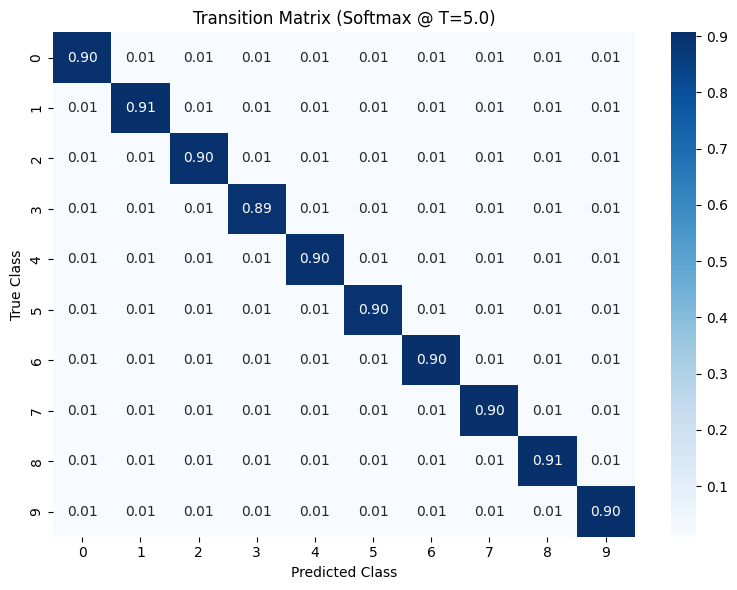

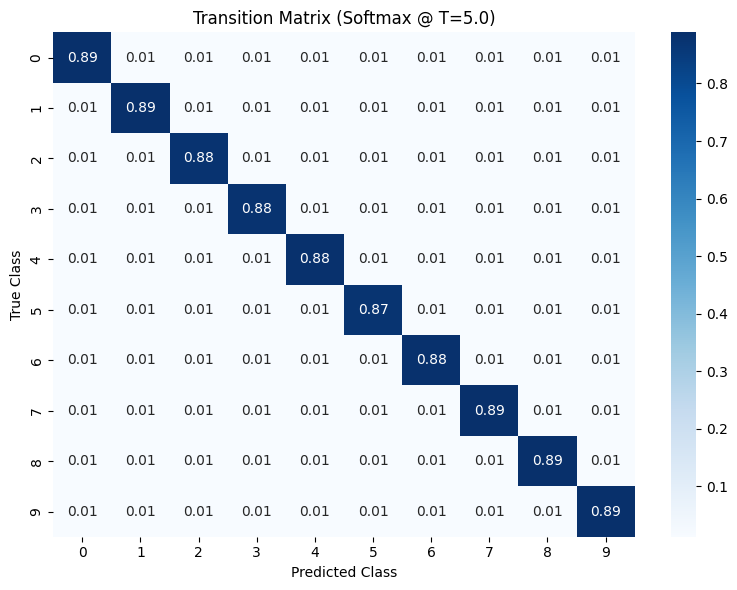

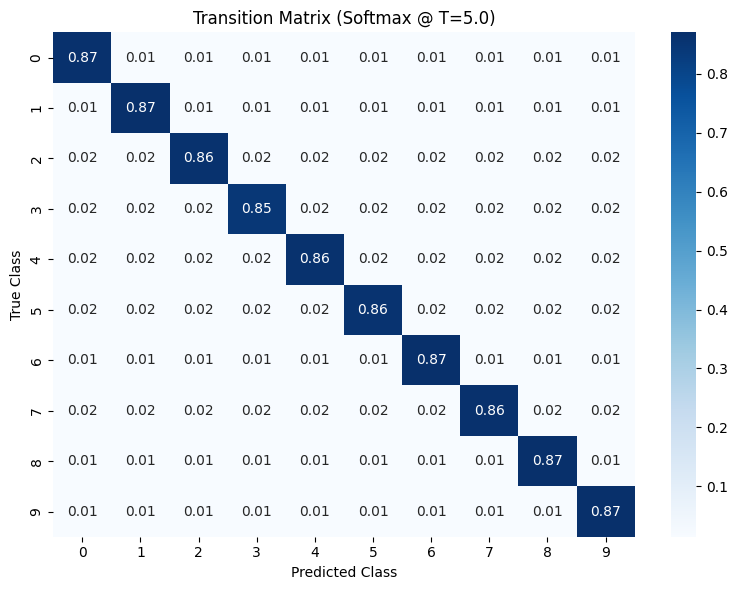

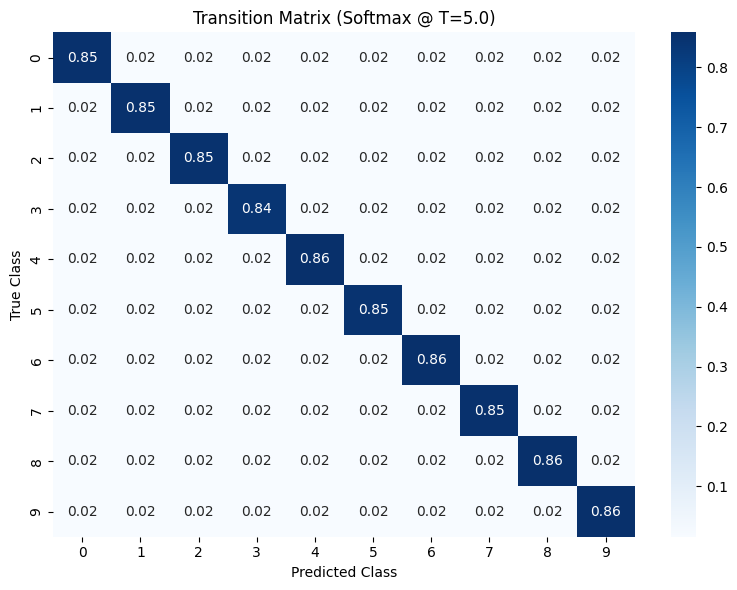

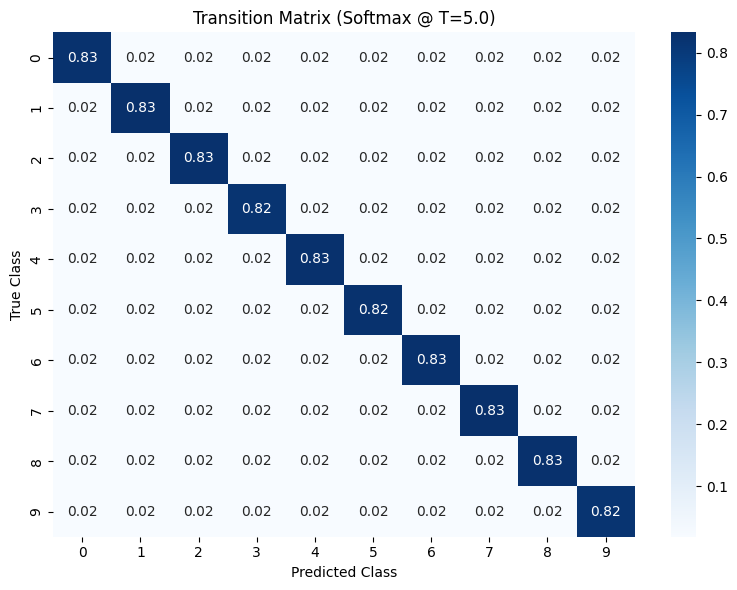

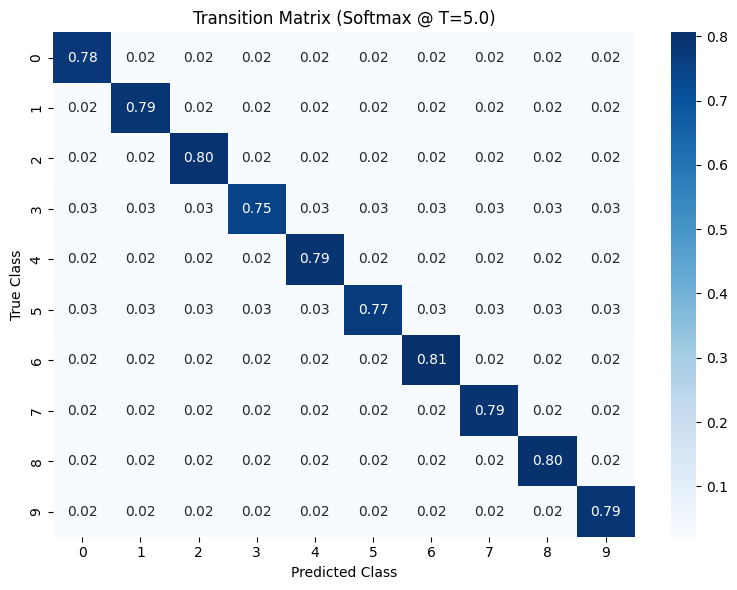

'\n\n'

In [ ]:
nfl_rce_delta_T_save_paths = [
    "delta_T_revision_cifar10_10percent.npy",
    "delta_T_revision_cifar10_20percent.npy",
    "delta_T_revision_cifar10_30percent.npy",
    "delta_T_revision_cifar10_40percent.npy",
    "delta_T_revision_cifar10_50percent.npy",
    "delta_T_revision_cifar10_60percent.npy"
]

matrix_data = np.load("delta_T_revision_cifar10_10percent.npy")

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn.functional as F

def plot_transition_matrix_heatmap(T_tensor, temperature=5.0, class_names=None):

    T_tensor = T_tensor.to(torch.float64).cpu()
    T_softmax = F.softmax(T_tensor / temperature, dim=1).numpy()

    if class_names is None:
        class_names = [str(i) for i in range(T_tensor.shape[0])]

    plt.figure(figsize=(8, 6))
    sns.heatmap(T_softmax, annot=True, fmt=".2f", cmap="Blues", cbar=True,
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Transition Matrix (Softmax @ T={temperature})")
    plt.xlabel("Predicted Class")
    plt.ylabel("True Class")
    plt.tight_layout()
    plt.show()

for i in range(len(nfl_rce_delta_T_save_paths)):
    matrix_data = np.load(nfl_rce_delta_T_save_paths[i])
    plot_transition_matrix_heatmap(torch.tensor(matrix_data), temperature=5.0)

'''

'''

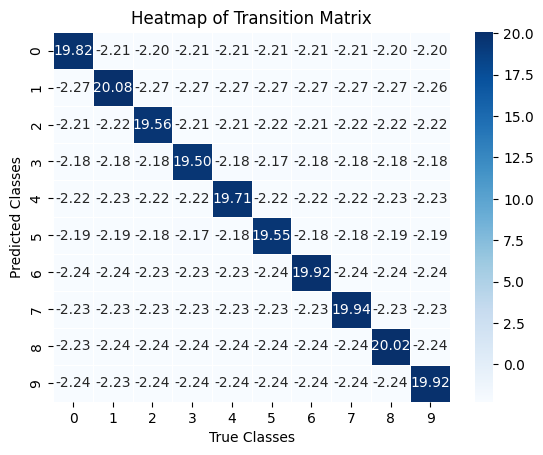

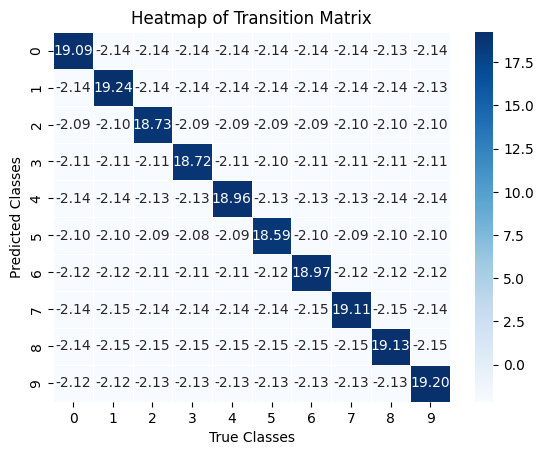

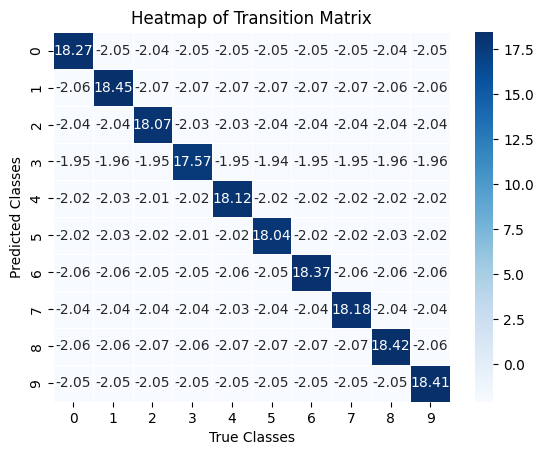

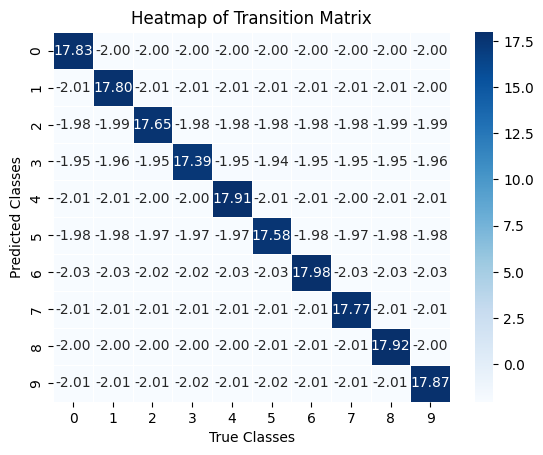

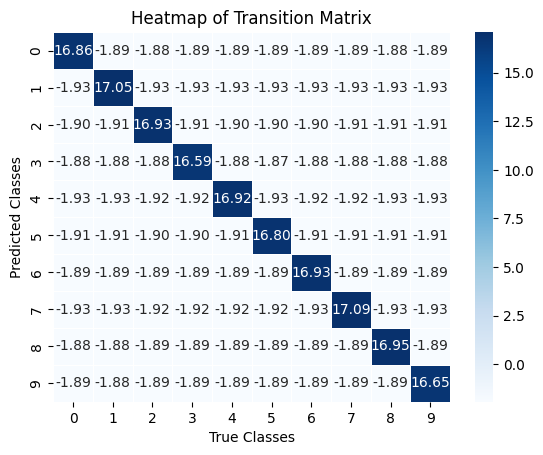

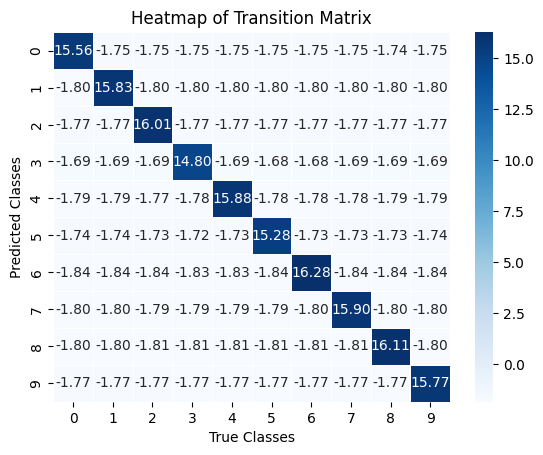

In [ ]:
for i in range(len(nfl_rce_delta_T_save_paths)):
    matrix_data = np.load(nfl_rce_delta_T_save_paths[i])
    sns.heatmap(matrix_data, annot=True, cmap='Blues', fmt=".2f", linewidths=.5)
    plt.title('Heatmap of Transition Matrix')
    plt.xlabel('True Classes')
    plt.ylabel('Predicted Classes')
    plt.show()

## Training NR - CNN on CIFAR-10


Starting training for 10% noise
----------------------------------------
Epoch 1/200 | Train Loss: 1.8732 | Val Loss: 1.5250 | Train Acc: 0.3297 | Val Acc: 0.4553 | Precision: 0.4641 | Recall: 0.4553
Epoch 2/200 | Train Loss: 1.5986 | Val Loss: 1.3420 | Train Acc: 0.4525 | Val Acc: 0.5273 | Precision: 0.5313 | Recall: 0.5273
Epoch 3/200 | Train Loss: 1.4900 | Val Loss: 1.2690 | Train Acc: 0.5056 | Val Acc: 0.5671 | Precision: 0.5692 | Recall: 0.5671
Epoch 4/200 | Train Loss: 1.4120 | Val Loss: 1.1615 | Train Acc: 0.5403 | Val Acc: 0.6001 | Precision: 0.6088 | Recall: 0.6001
Epoch 5/200 | Train Loss: 1.3447 | Val Loss: 1.0495 | Train Acc: 0.5739 | Val Acc: 0.6409 | Precision: 0.6436 | Recall: 0.6409
Epoch 6/200 | Train Loss: 1.2875 | Val Loss: 1.0618 | Train Acc: 0.5973 | Val Acc: 0.6534 | Precision: 0.6703 | Recall: 0.6534
Epoch 7/200 | Train Loss: 1.2400 | Val Loss: 0.9565 | Train Acc: 0.6164 | Val Acc: 0.6760 | Precision: 0.6833 | Recall: 0.6760
Epoch 8/200 | Train Loss: 1.2046 | Va

<ipython-input-7-844d6175a118>:210: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /pytorch/torch/csrc/utils/tensor_new.cpp:254.)
  T_tensor = torch.tensor(T_history)


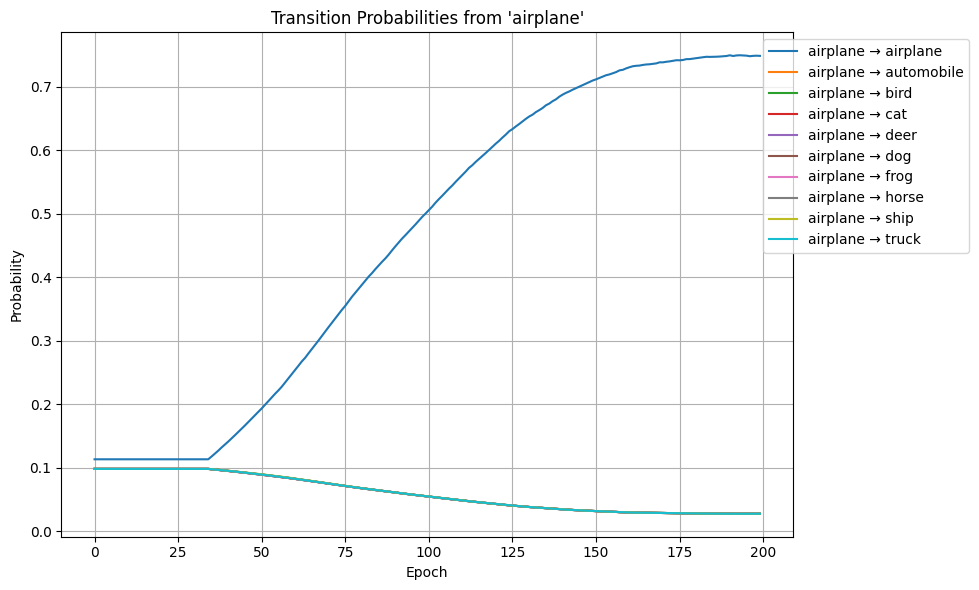

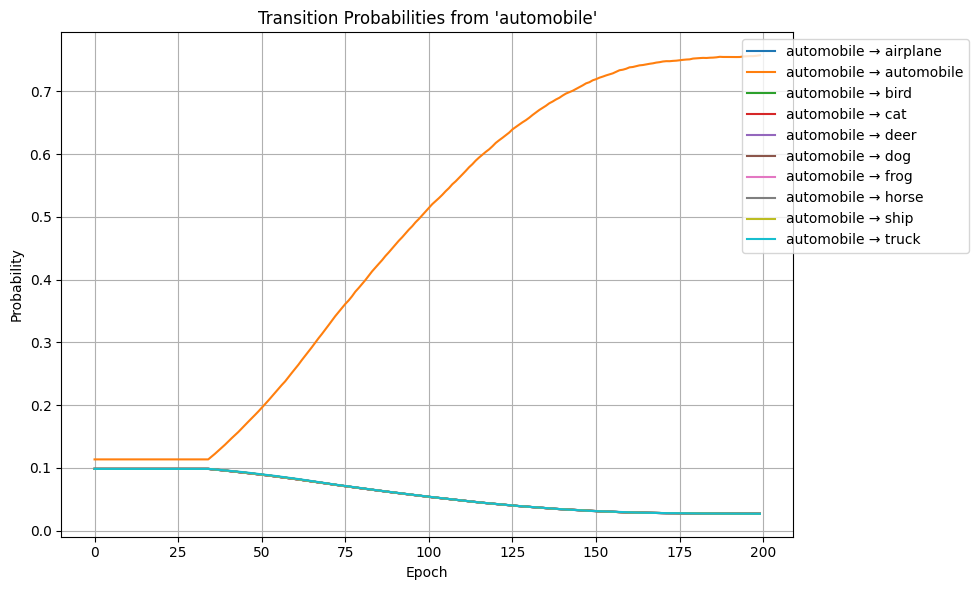

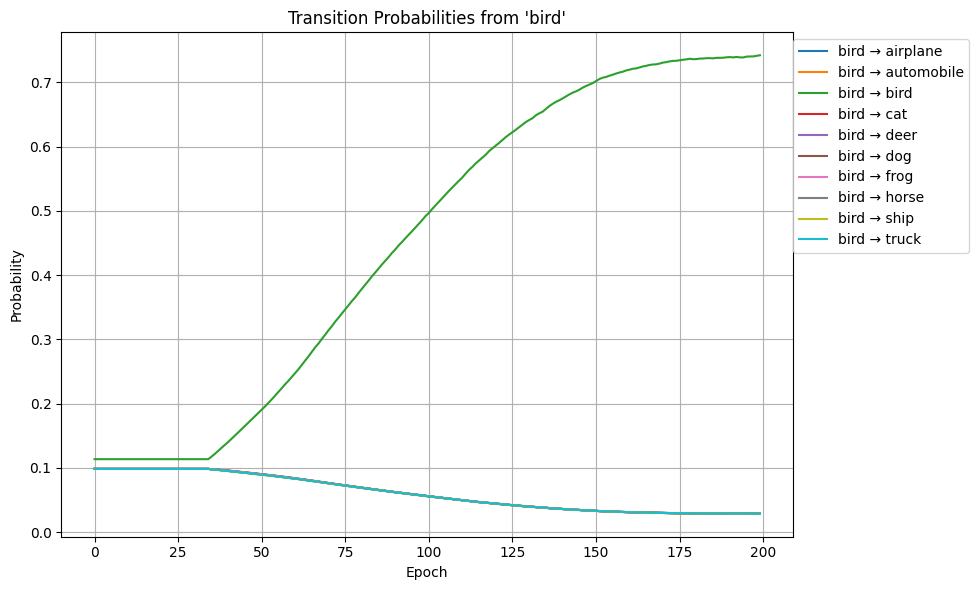

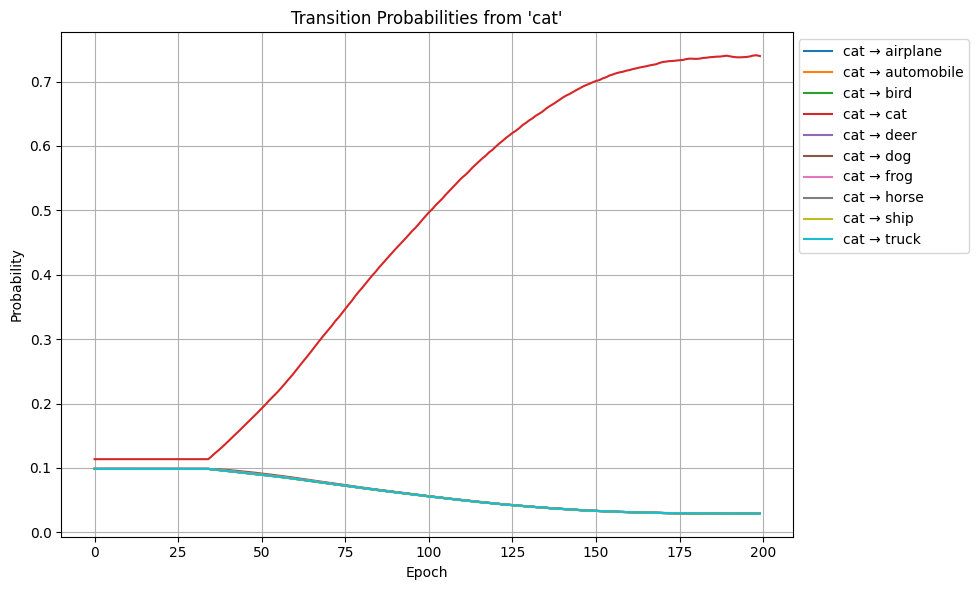

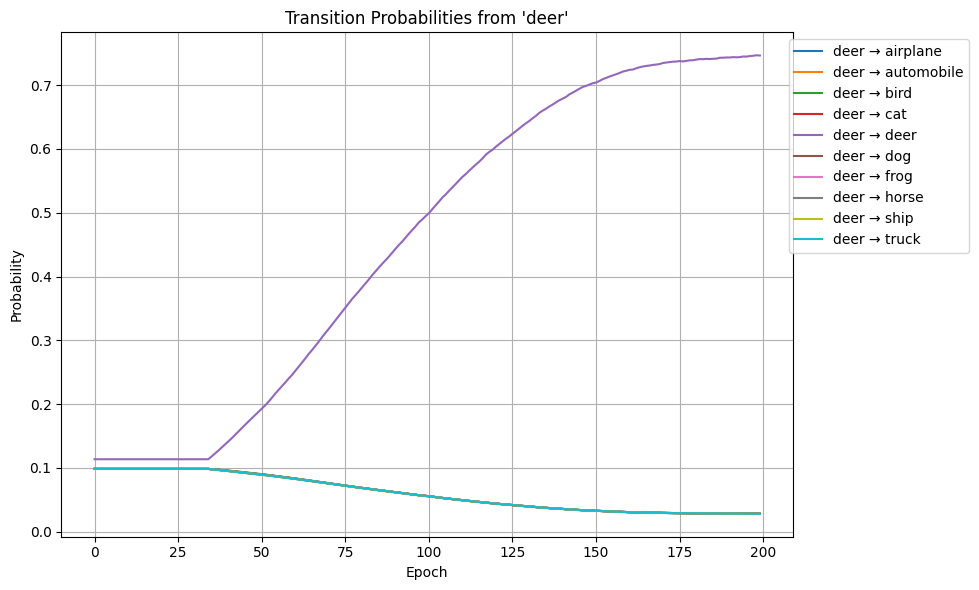

...

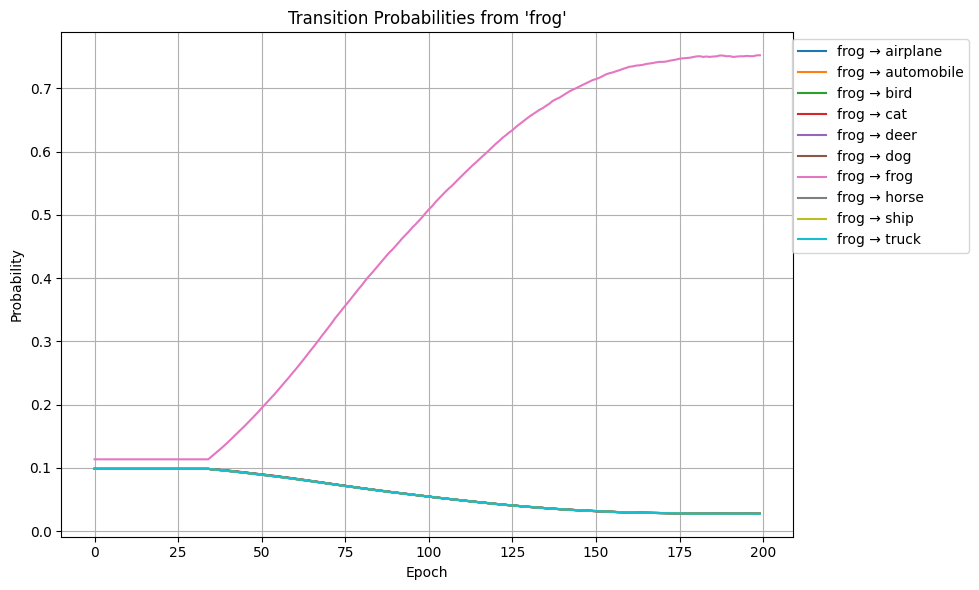

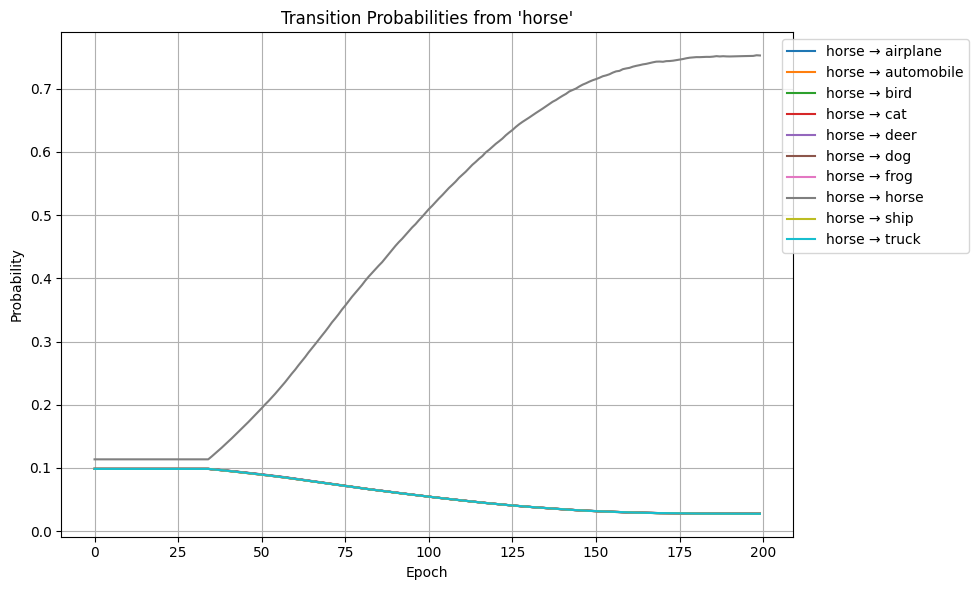

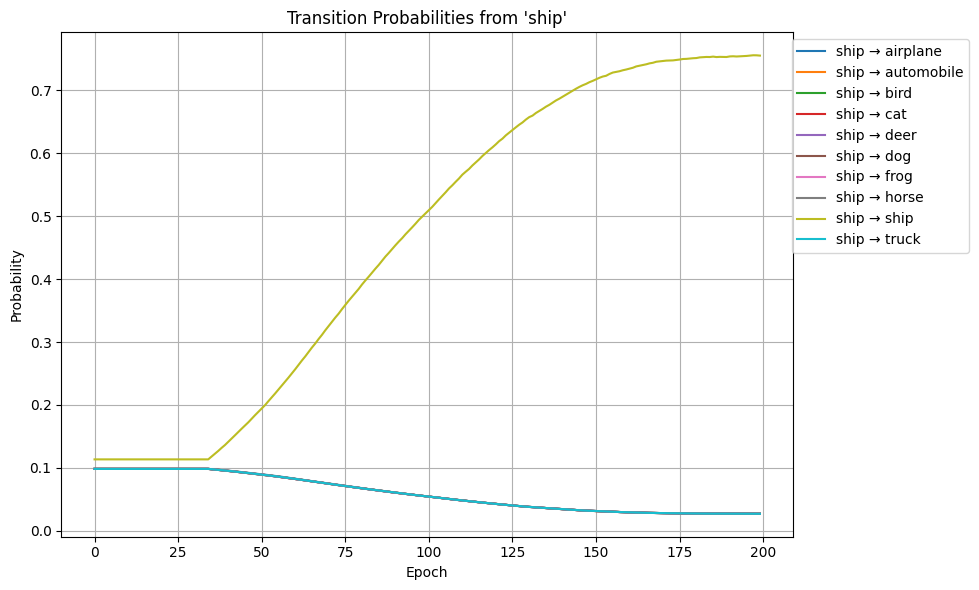

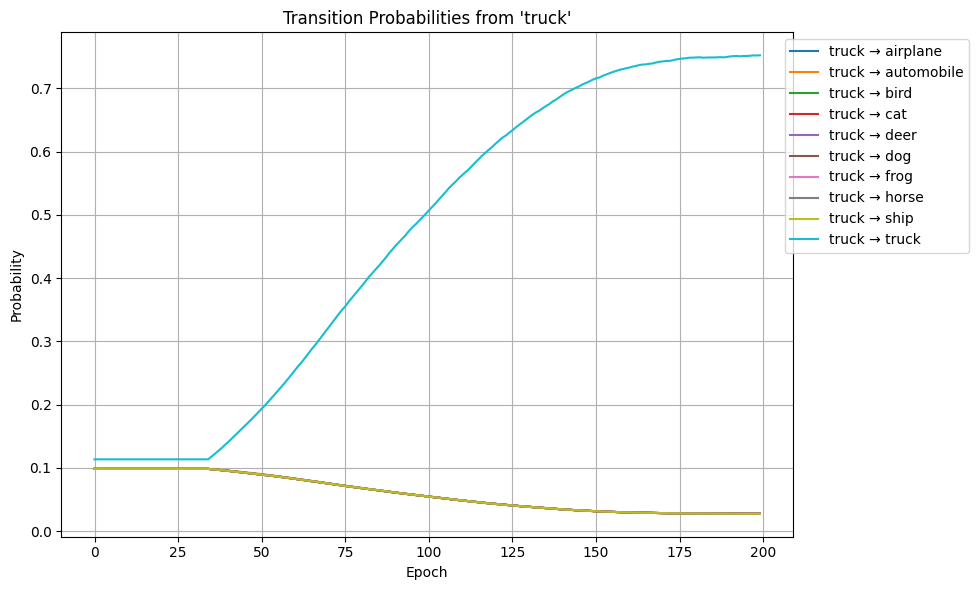

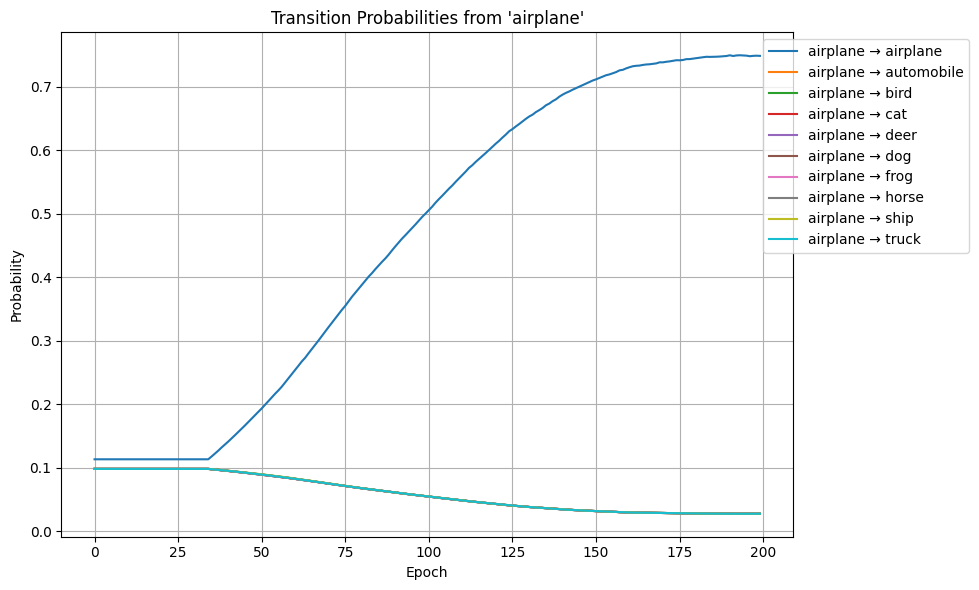


Starting training for 20% noise
----------------------------------------
Epoch 1/200 | Train Loss: 1.9901 | Val Loss: 1.6412 | Train Acc: 0.2915 | Val Acc: 0.4088 | Precision: 0.4322 | Recall: 0.4088
Epoch 2/200 | Train Loss: 1.7872 | Val Loss: 1.4838 | Train Acc: 0.3980 | Val Acc: 0.4947 | Precision: 0.5048 | Recall: 0.4947
Epoch 3/200 | Train Loss: 1.7047 | Val Loss: 1.3708 | Train Acc: 0.4434 | Val Acc: 0.5473 | Precision: 0.5485 | Recall: 0.5473
Epoch 4/200 | Train Loss: 1.6383 | Val Loss: 1.3242 | Train Acc: 0.4776 | Val Acc: 0.5674 | Precision: 0.5902 | Recall: 0.5674
Epoch 5/200 | Train Loss: 1.5858 | Val Loss: 1.2057 | Train Acc: 0.5071 | Val Acc: 0.6234 | Precision: 0.6207 | Recall: 0.6234
Epoch 6/200 | Train Loss: 1.5371 | Val Loss: 1.1102 | Train Acc: 0.5292 | Val Acc: 0.6321 | Precision: 0.6434 | Recall: 0.6321
Epoch 7/200 | Train Loss: 1.4999 | Val Loss: 1.0762 | Train Acc: 0.5463 | Val Acc: 0.6654 | Precision: 0.6645 | Recall: 0.6654
Epoch 8/200 | Train Loss: 1.4615 | Va

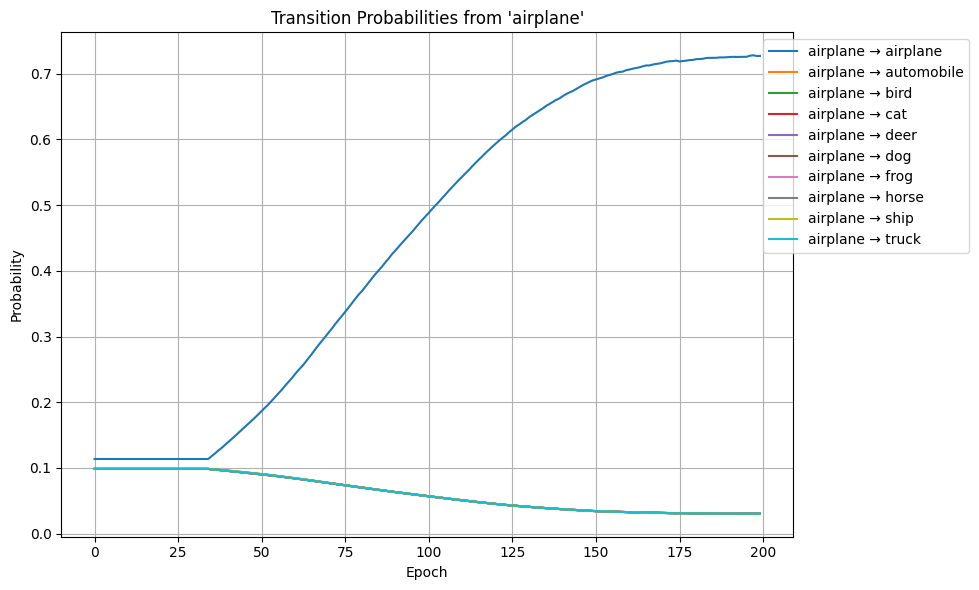

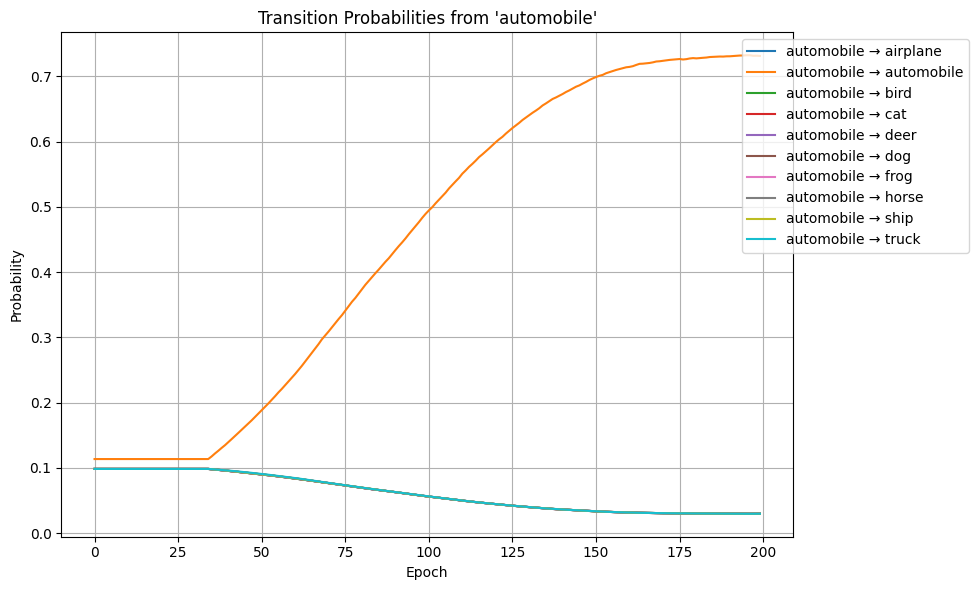

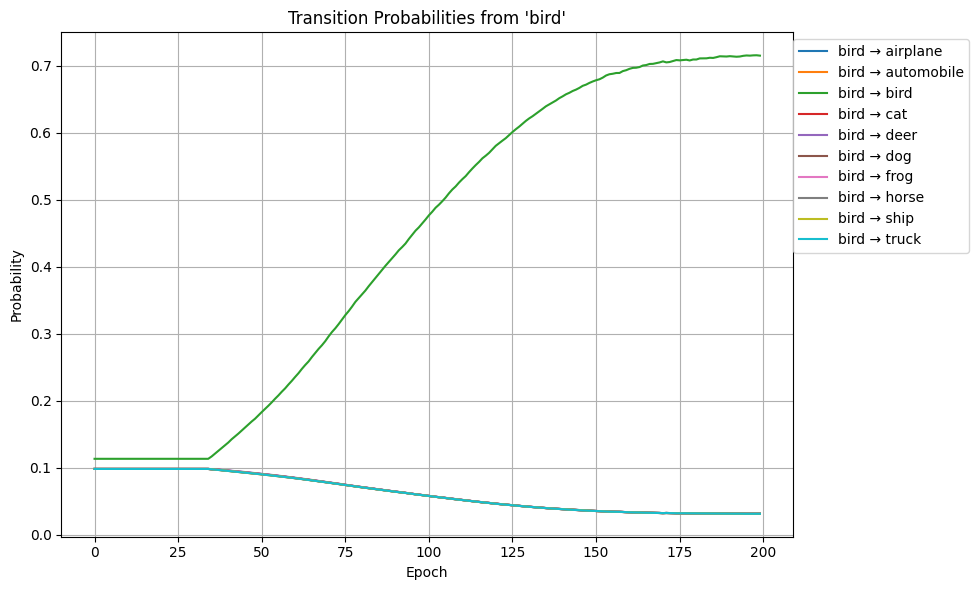

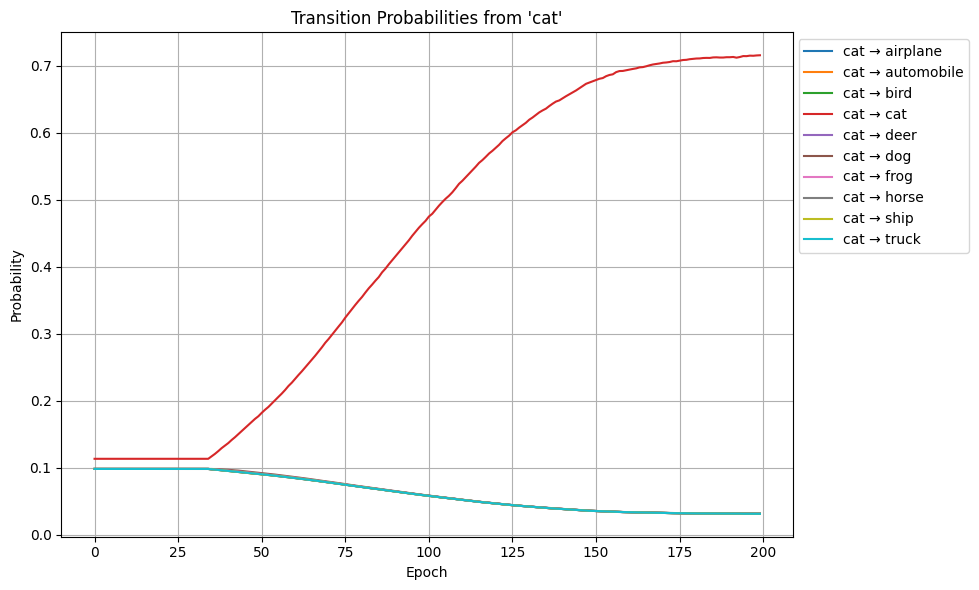

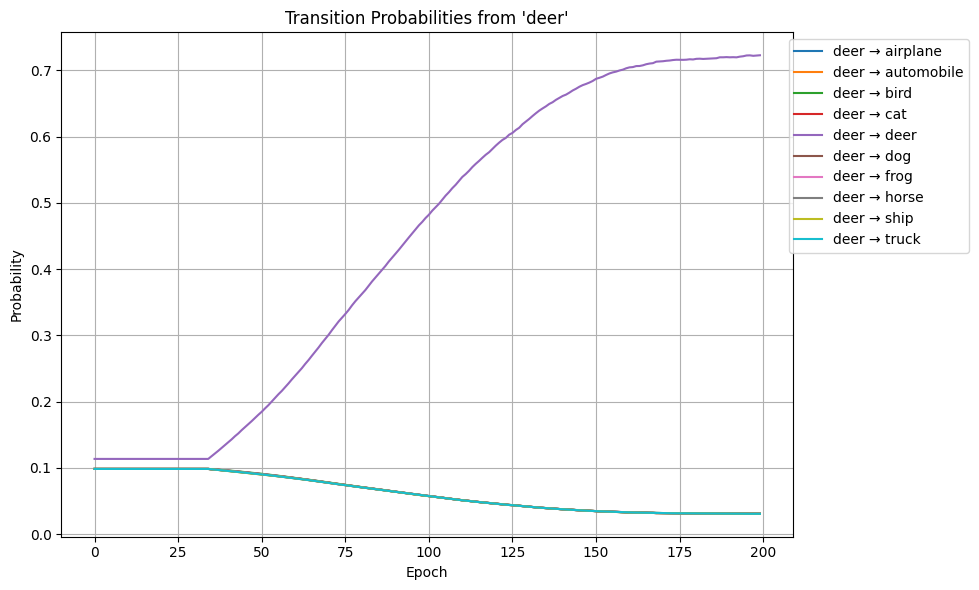

...

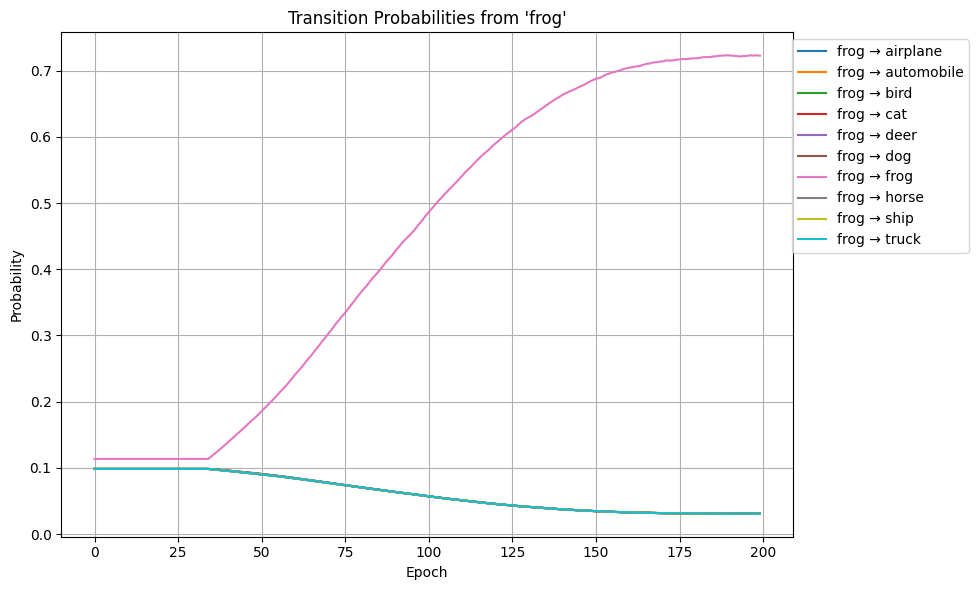

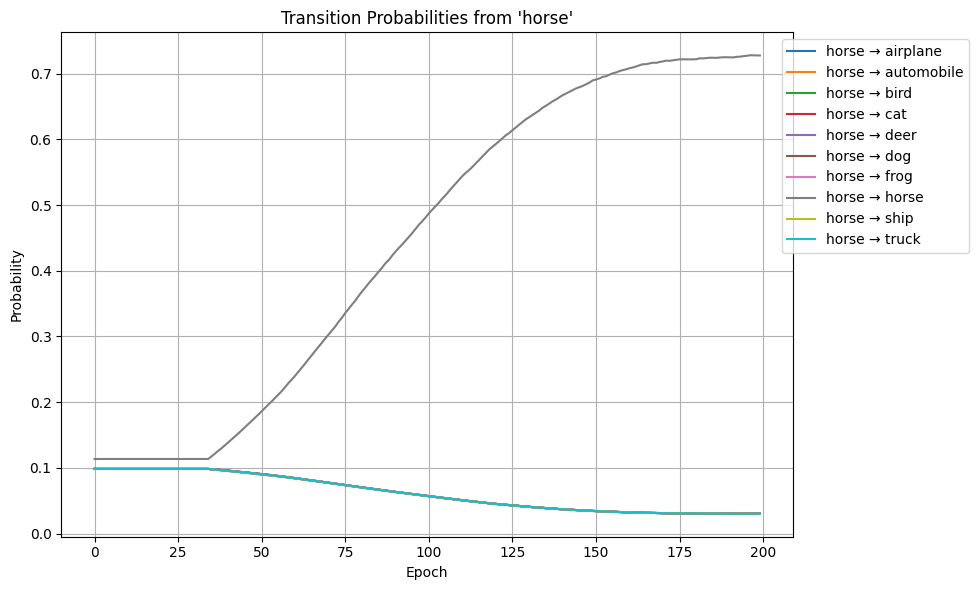

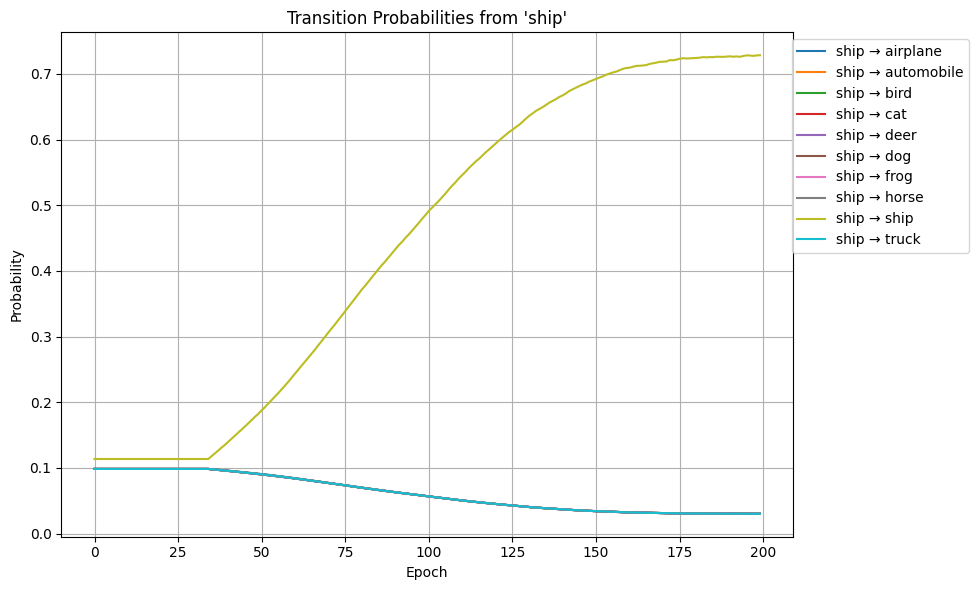

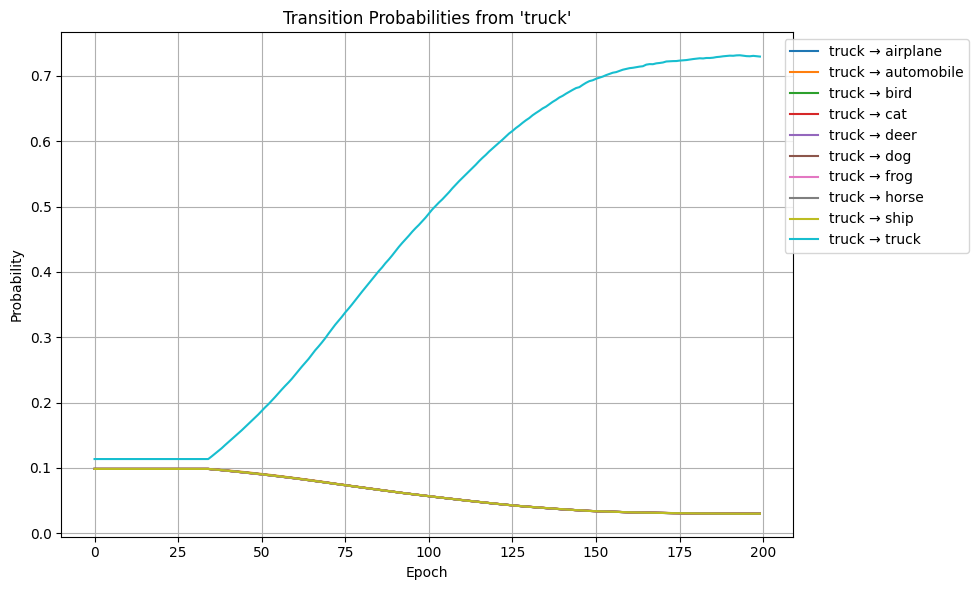

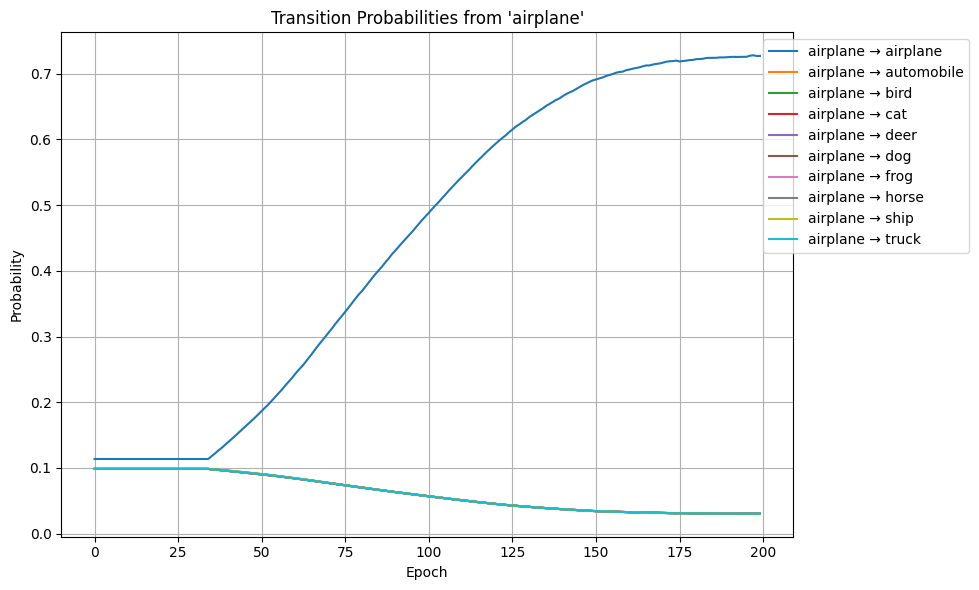


Starting training for 30% noise
----------------------------------------
Epoch 1/200 | Train Loss: 2.0684 | Val Loss: 1.6300 | Train Acc: 0.2709 | Val Acc: 0.4328 | Precision: 0.4515 | Recall: 0.4328
Epoch 2/200 | Train Loss: 1.9221 | Val Loss: 1.5550 | Train Acc: 0.3569 | Val Acc: 0.4968 | Precision: 0.5147 | Recall: 0.4968
Epoch 3/200 | Train Loss: 1.8560 | Val Loss: 1.5172 | Train Acc: 0.3942 | Val Acc: 0.5054 | Precision: 0.5237 | Recall: 0.5054
Epoch 4/200 | Train Loss: 1.8083 | Val Loss: 1.3563 | Train Acc: 0.4217 | Val Acc: 0.5813 | Precision: 0.5738 | Recall: 0.5813
Epoch 5/200 | Train Loss: 1.7601 | Val Loss: 1.2481 | Train Acc: 0.4497 | Val Acc: 0.6014 | Precision: 0.6131 | Recall: 0.6014
Epoch 6/200 | Train Loss: 1.7265 | Val Loss: 1.2209 | Train Acc: 0.4654 | Val Acc: 0.6422 | Precision: 0.6424 | Recall: 0.6422
Epoch 7/200 | Train Loss: 1.6951 | Val Loss: 1.2145 | Train Acc: 0.4862 | Val Acc: 0.6482 | Precision: 0.6494 | Recall: 0.6482
Epoch 8/200 | Train Loss: 1.6703 | Va

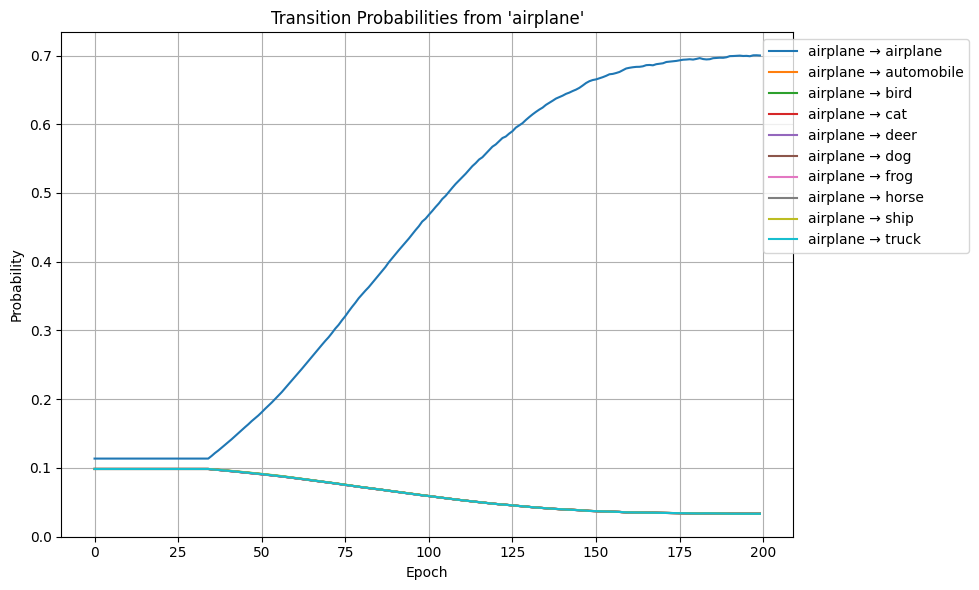

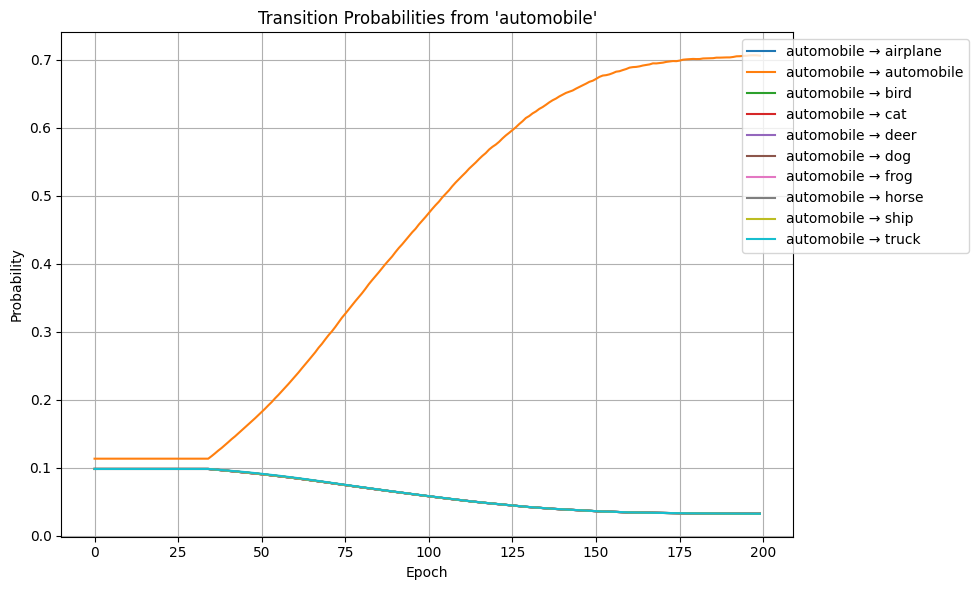

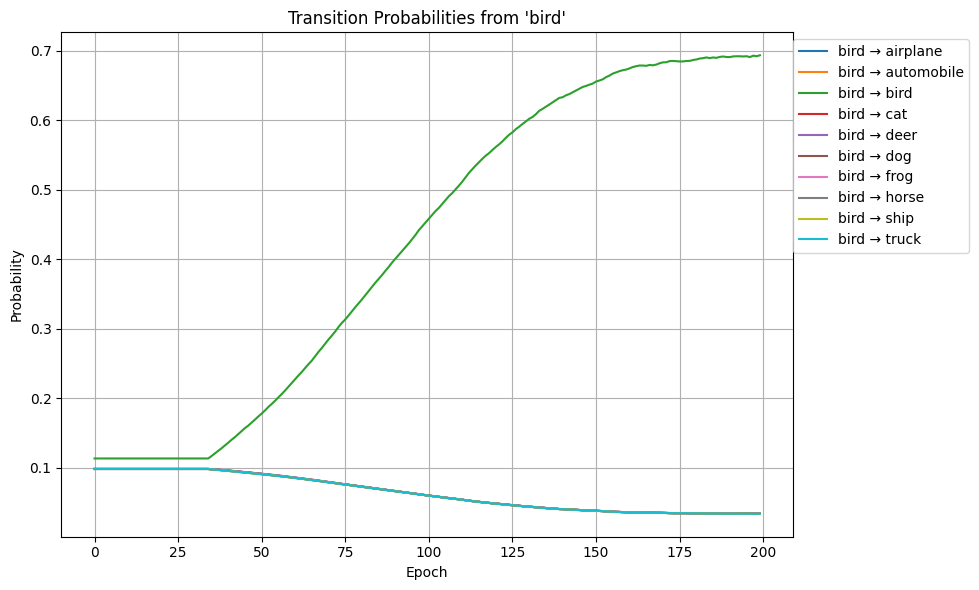

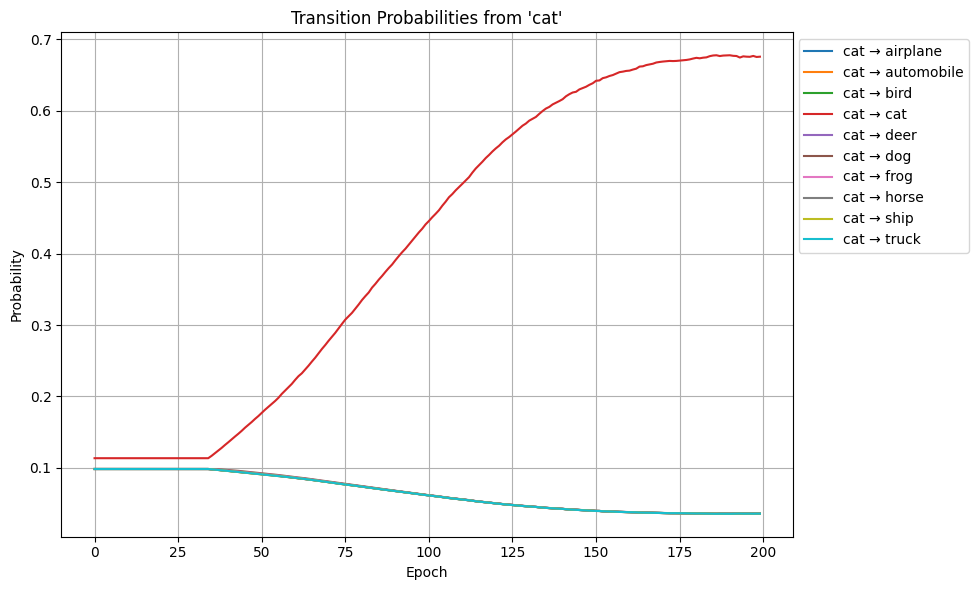

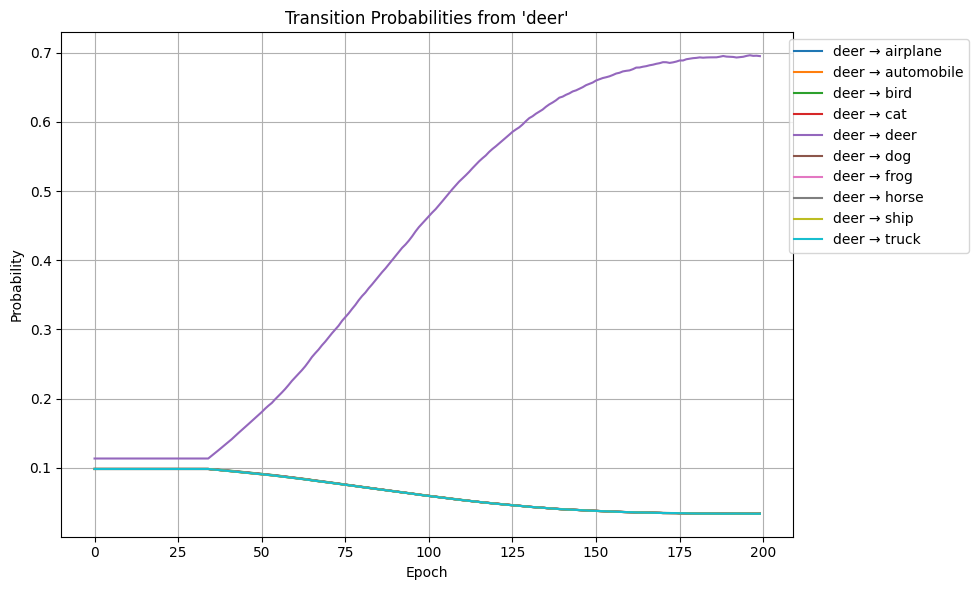

...

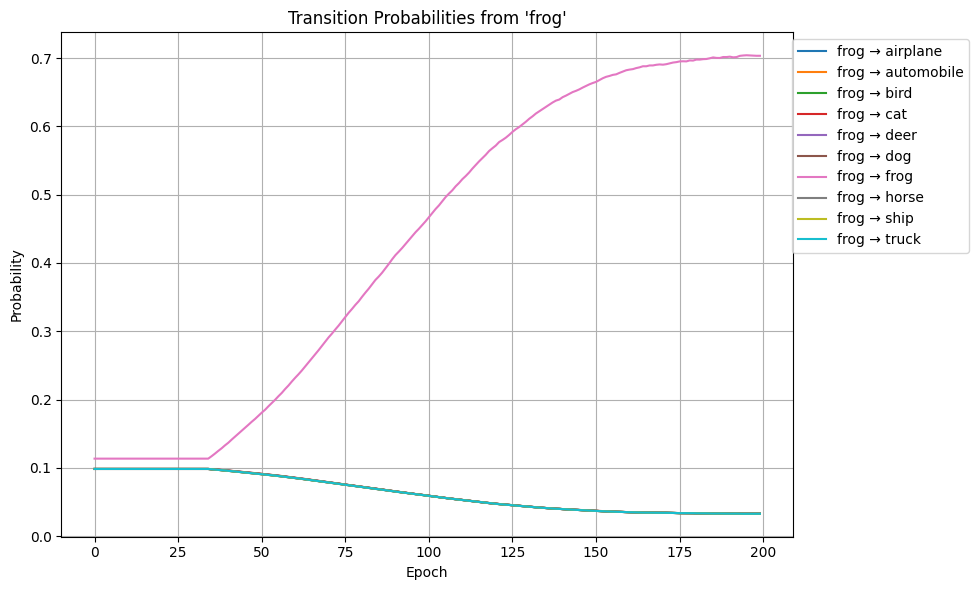

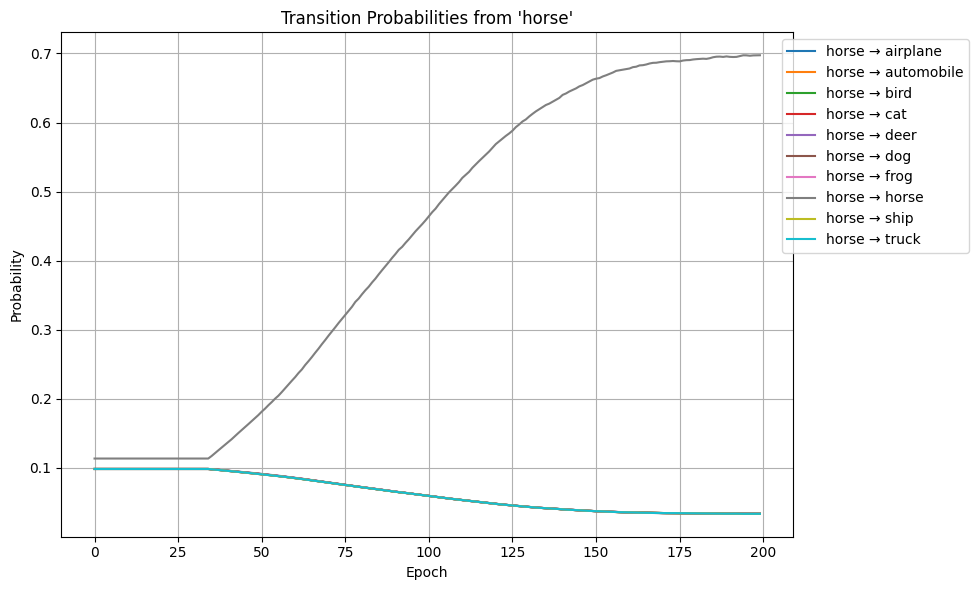

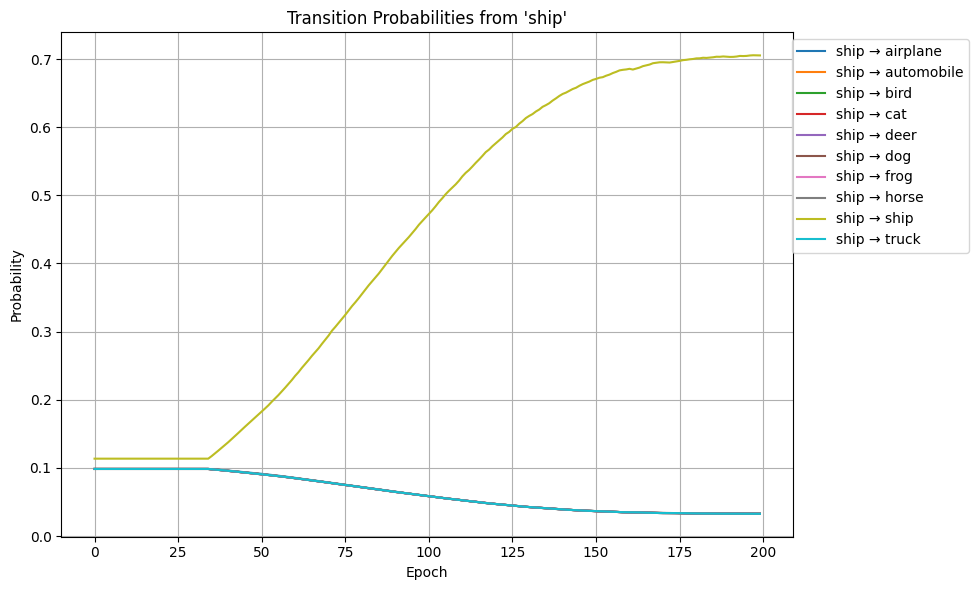

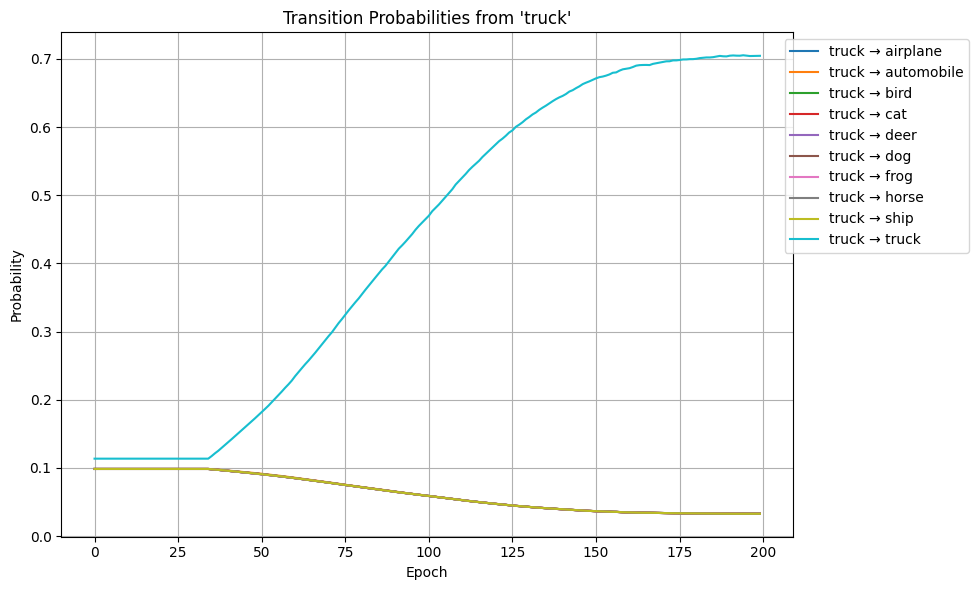

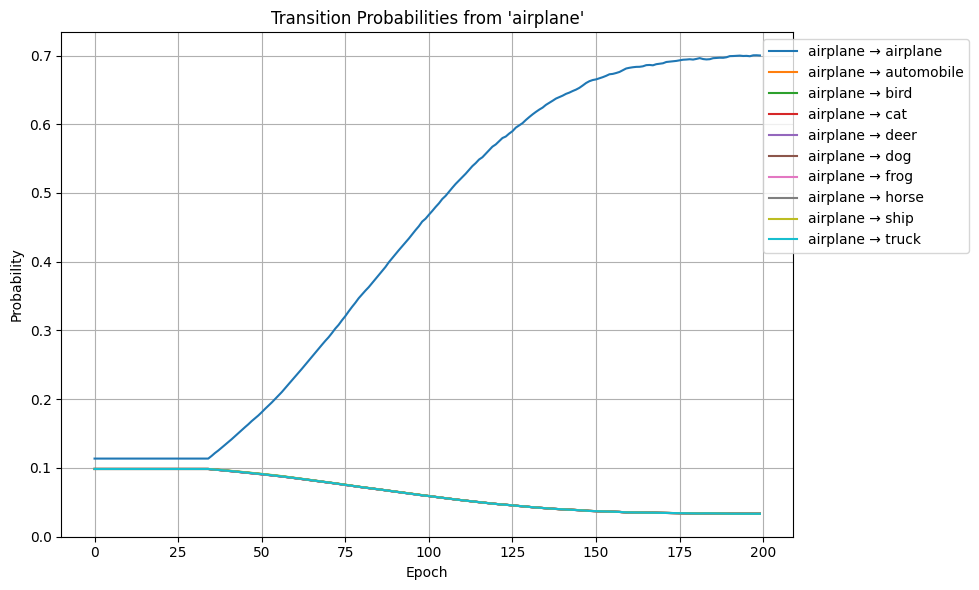


Starting training for 40% noise
----------------------------------------
Epoch 1/200 | Train Loss: 2.1343 | Val Loss: 1.7744 | Train Acc: 0.2446 | Val Acc: 0.4291 | Precision: 0.4338 | Recall: 0.4291
Epoch 2/200 | Train Loss: 2.0260 | Val Loss: 1.6516 | Train Acc: 0.3141 | Val Acc: 0.4751 | Precision: 0.4827 | Recall: 0.4751
Epoch 3/200 | Train Loss: 1.9779 | Val Loss: 1.5818 | Train Acc: 0.3476 | Val Acc: 0.5131 | Precision: 0.5363 | Recall: 0.5131
Epoch 4/200 | Train Loss: 1.9501 | Val Loss: 1.4403 | Train Acc: 0.3641 | Val Acc: 0.5637 | Precision: 0.5799 | Recall: 0.5637
Epoch 5/200 | Train Loss: 1.9176 | Val Loss: 1.4736 | Train Acc: 0.3844 | Val Acc: 0.5665 | Precision: 0.5803 | Recall: 0.5665
Epoch 6/200 | Train Loss: 1.8854 | Val Loss: 1.4524 | Train Acc: 0.4022 | Val Acc: 0.5985 | Precision: 0.6125 | Recall: 0.5985
Epoch 7/200 | Train Loss: 1.8583 | Val Loss: 1.3260 | Train Acc: 0.4194 | Val Acc: 0.6309 | Precision: 0.6366 | Recall: 0.6309
Epoch 8/200 | Train Loss: 1.8308 | Va

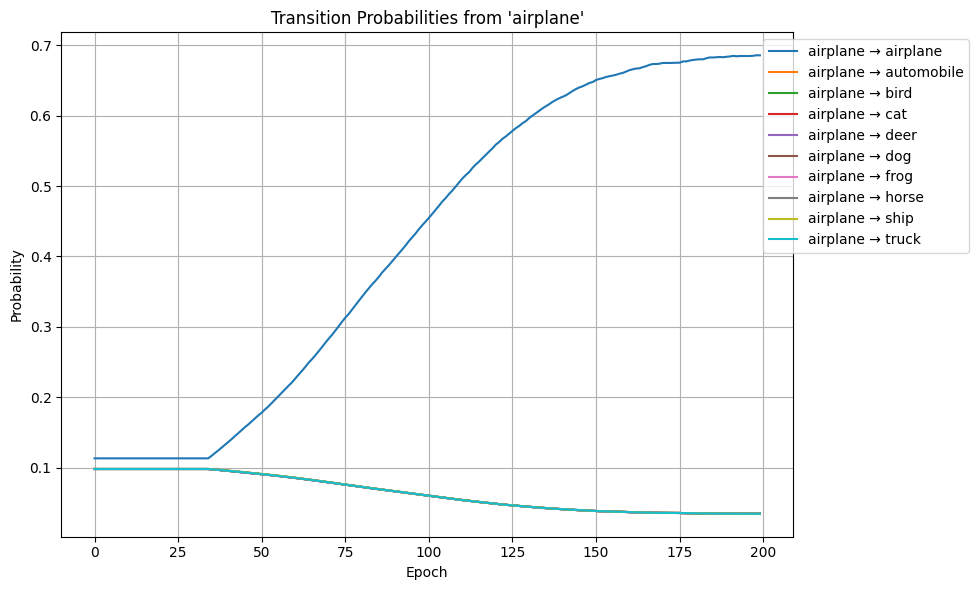

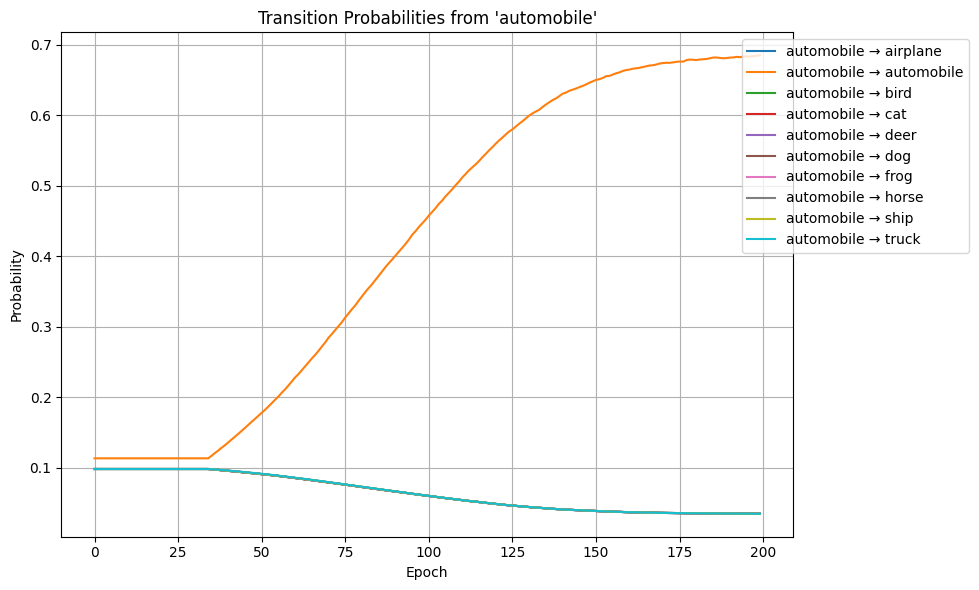

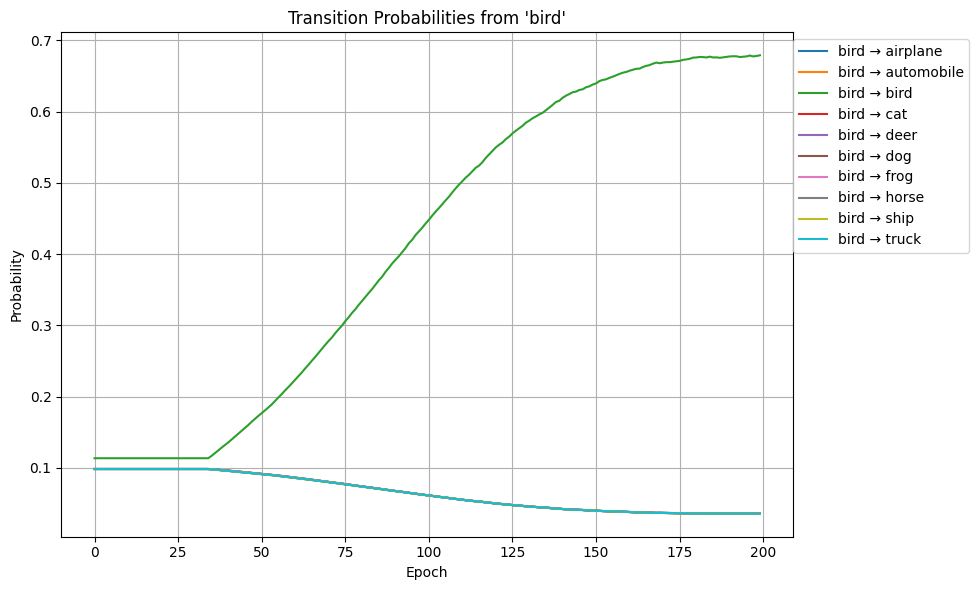

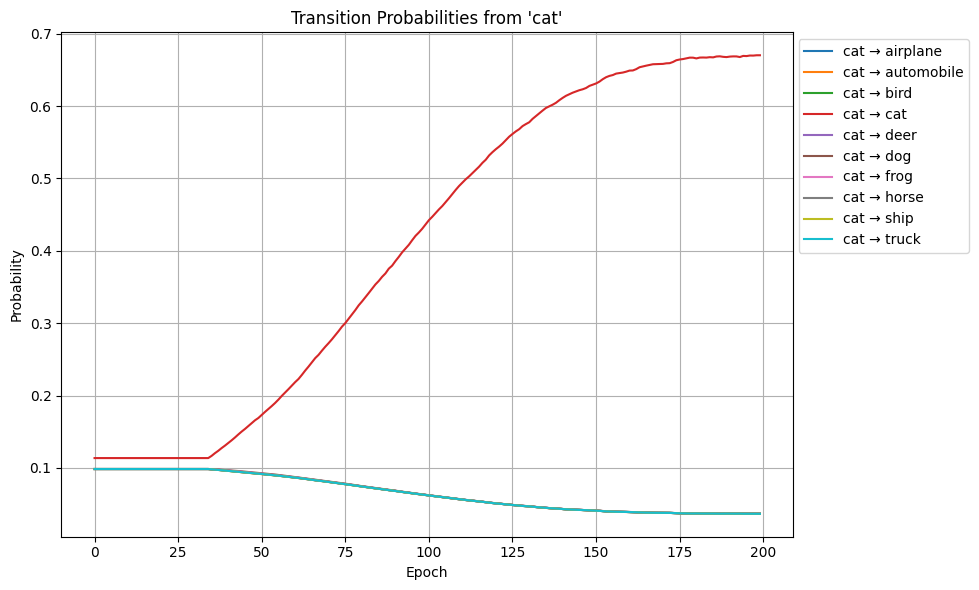

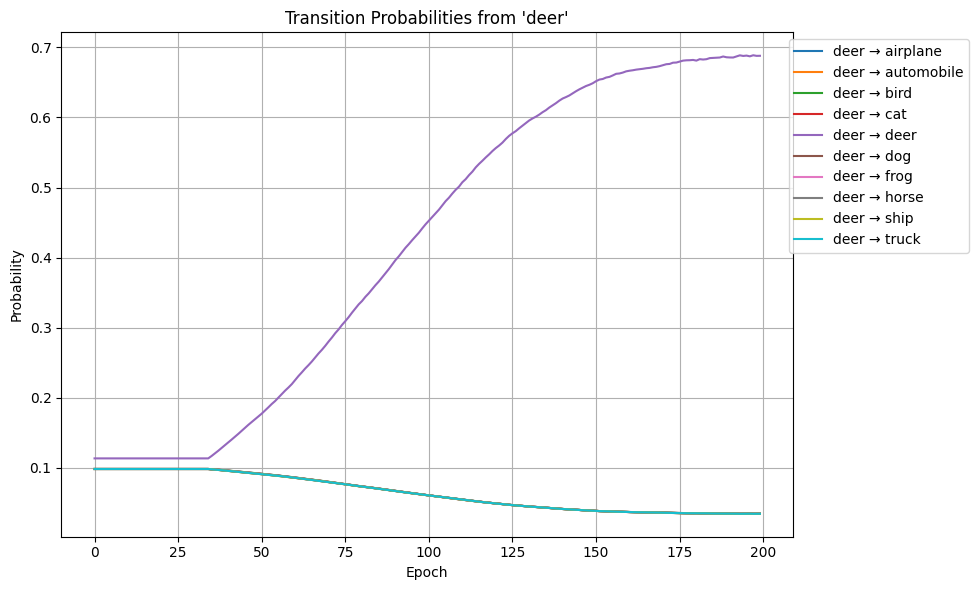

...

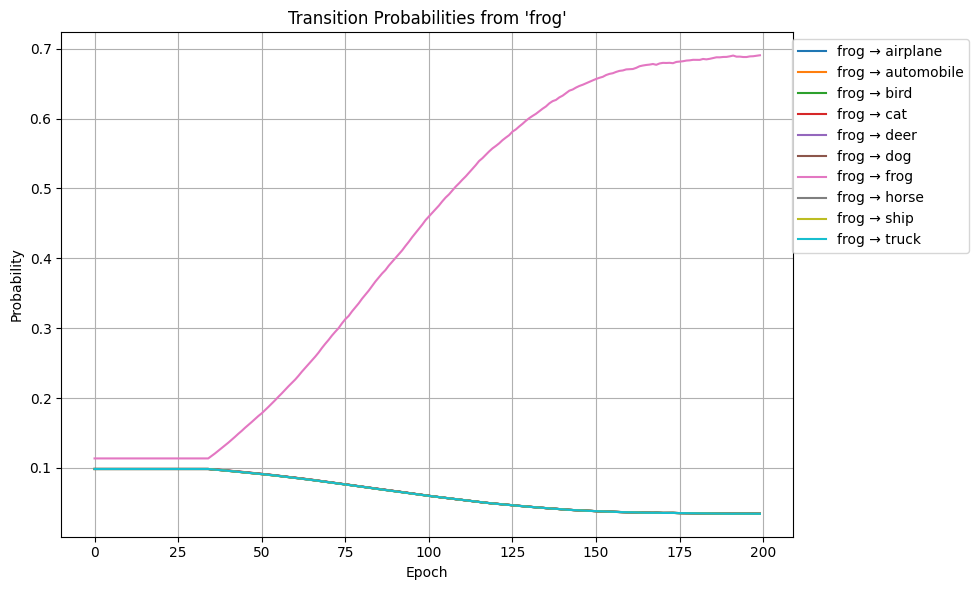

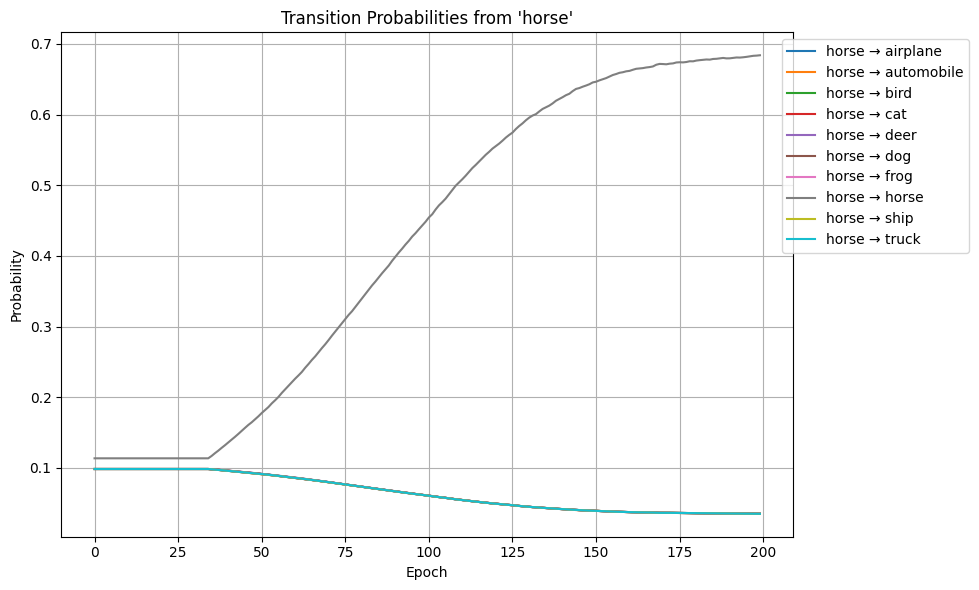

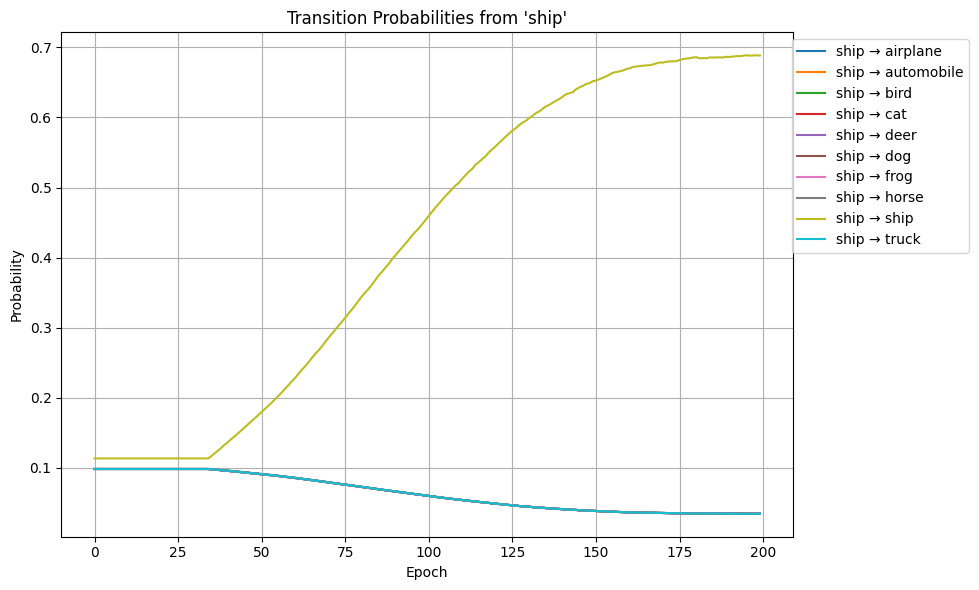

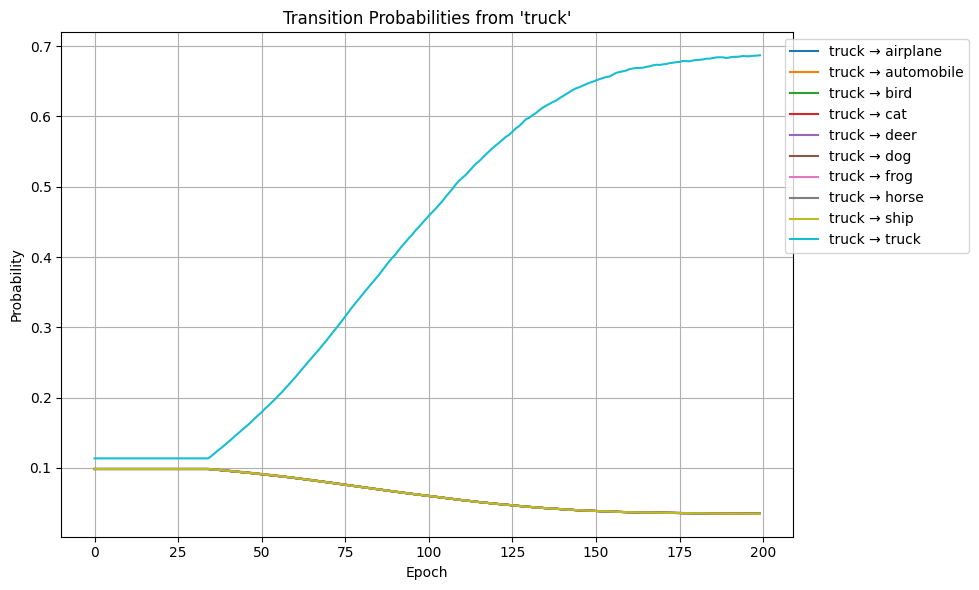

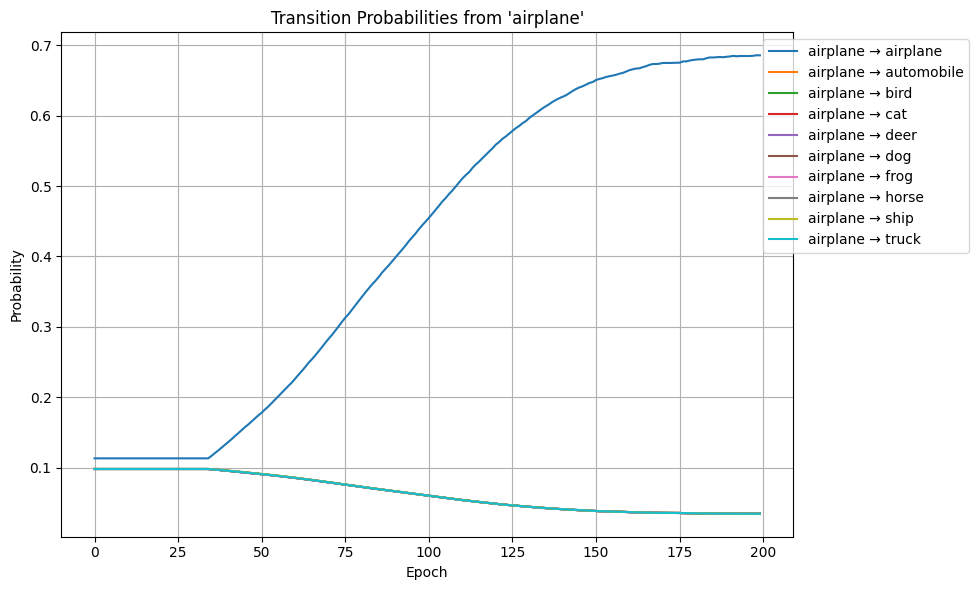


Starting training for 50% noise
----------------------------------------
Epoch 1/200 | Train Loss: 2.2071 | Val Loss: 1.8975 | Train Acc: 0.2001 | Val Acc: 0.4021 | Precision: 0.4107 | Recall: 0.4021
Epoch 2/200 | Train Loss: 2.1252 | Val Loss: 1.8127 | Train Acc: 0.2640 | Val Acc: 0.4635 | Precision: 0.4866 | Recall: 0.4635
Epoch 3/200 | Train Loss: 2.0951 | Val Loss: 1.7229 | Train Acc: 0.2887 | Val Acc: 0.4792 | Precision: 0.4841 | Recall: 0.4792
Epoch 4/200 | Train Loss: 2.0662 | Val Loss: 1.6655 | Train Acc: 0.3082 | Val Acc: 0.5277 | Precision: 0.5408 | Recall: 0.5277
Epoch 5/200 | Train Loss: 2.0443 | Val Loss: 1.5571 | Train Acc: 0.3223 | Val Acc: 0.5373 | Precision: 0.5473 | Recall: 0.5373
Epoch 6/200 | Train Loss: 2.0243 | Val Loss: 1.5420 | Train Acc: 0.3355 | Val Acc: 0.5803 | Precision: 0.5773 | Recall: 0.5803
Epoch 7/200 | Train Loss: 2.0040 | Val Loss: 1.5566 | Train Acc: 0.3502 | Val Acc: 0.5782 | Precision: 0.5993 | Recall: 0.5782
Epoch 8/200 | Train Loss: 1.9881 | Va

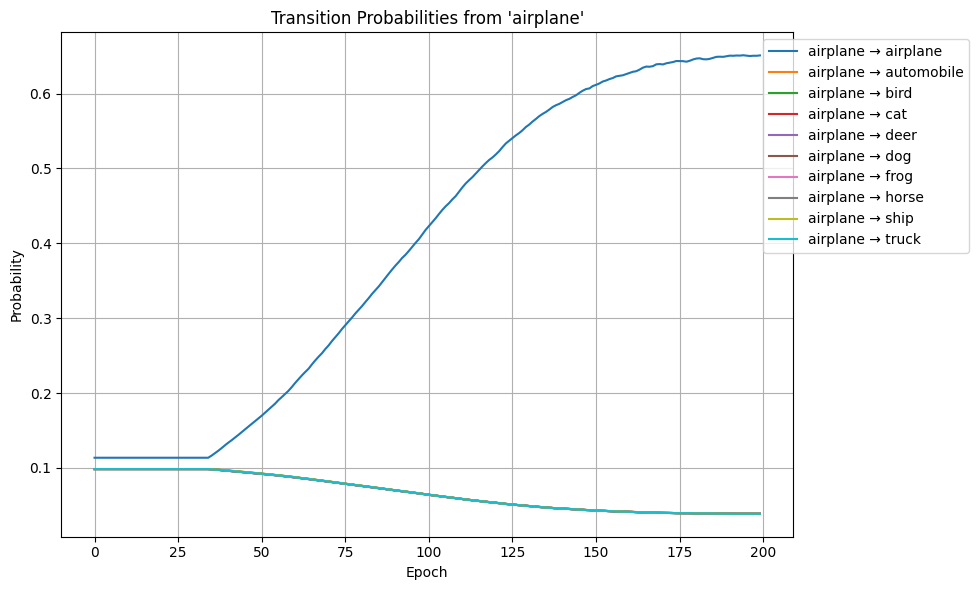

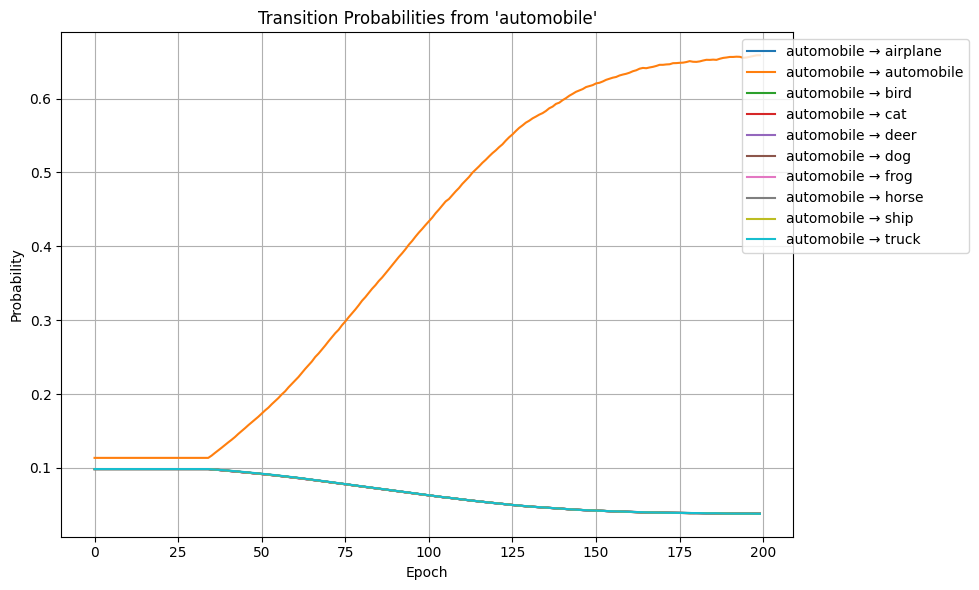

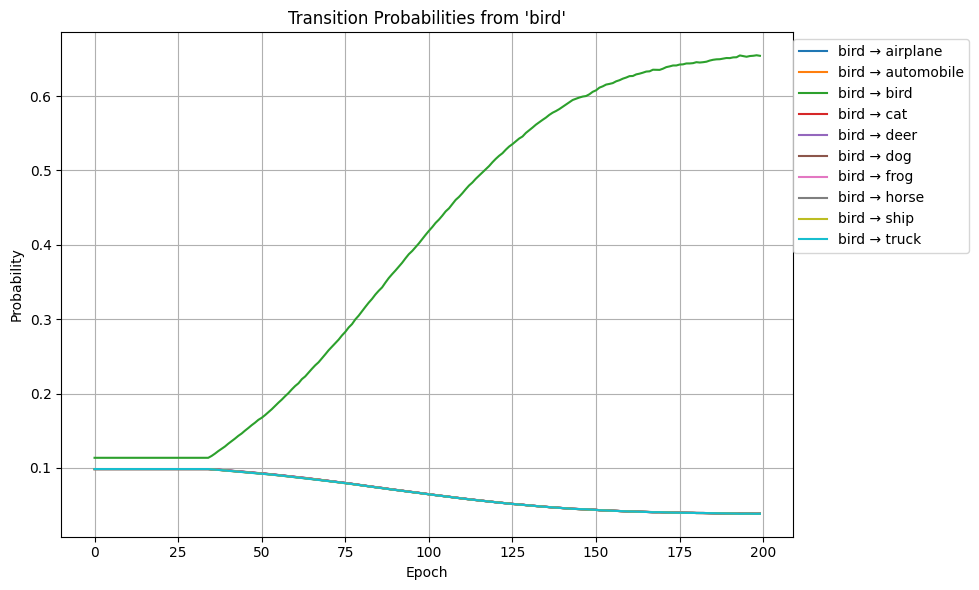

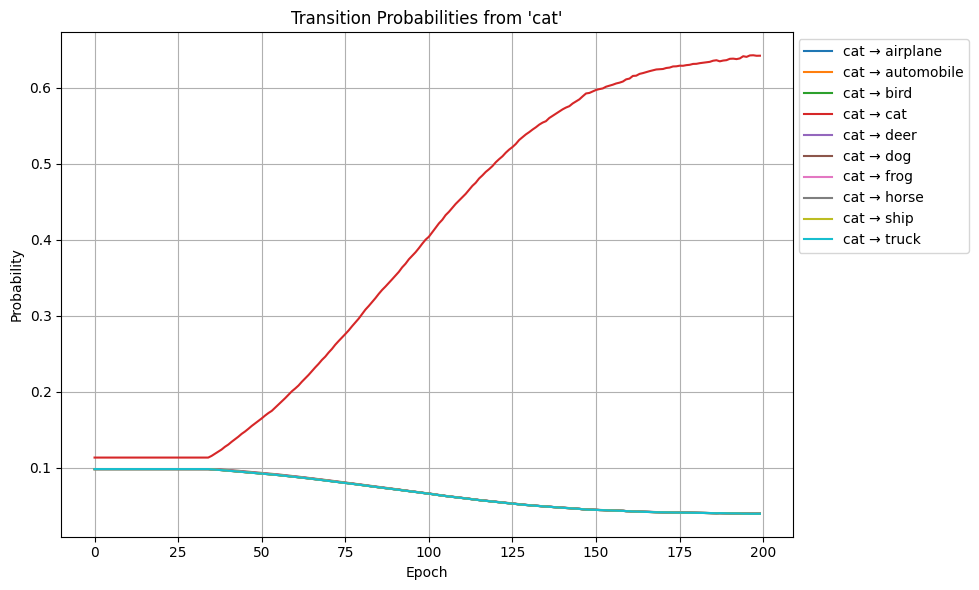

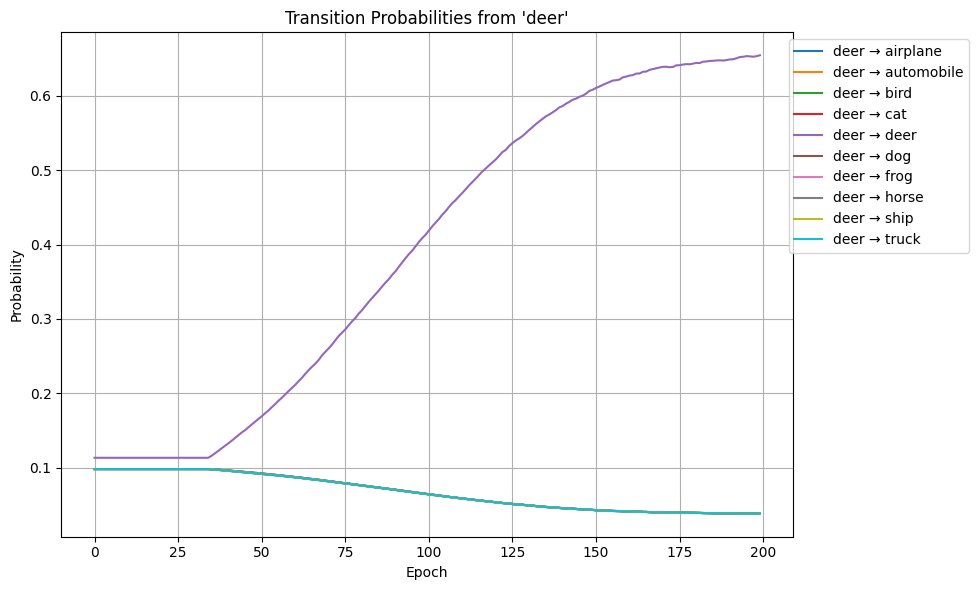

...

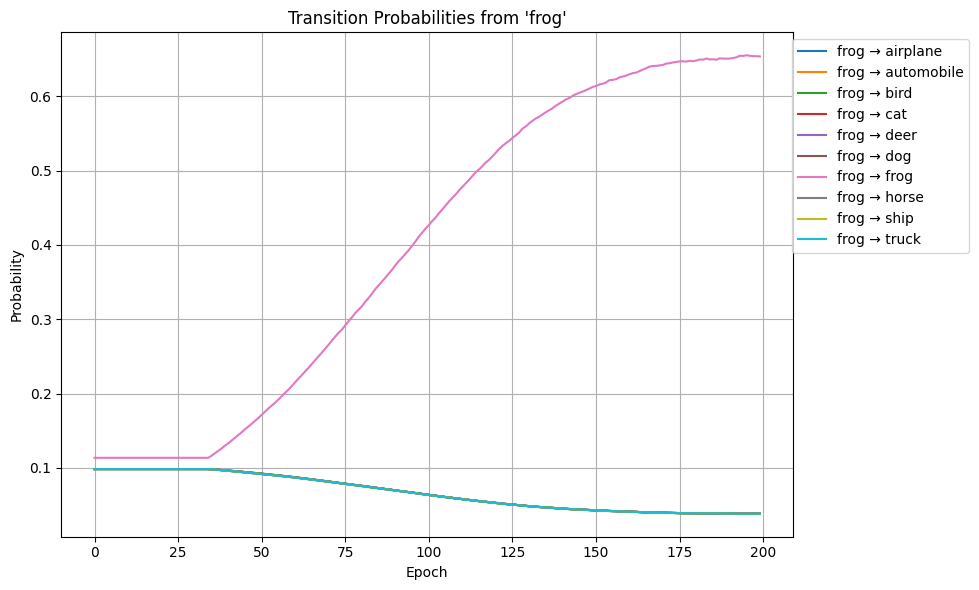

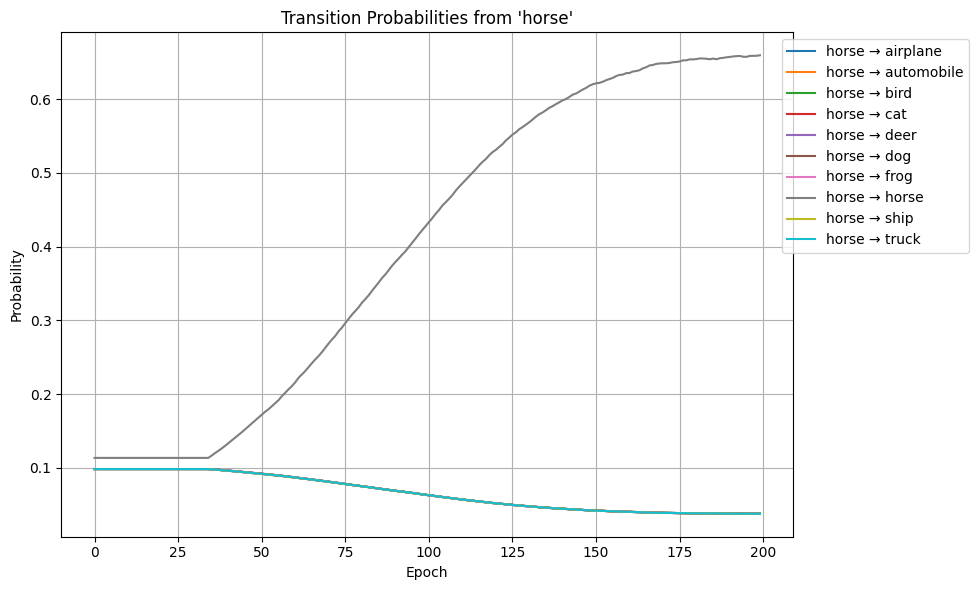

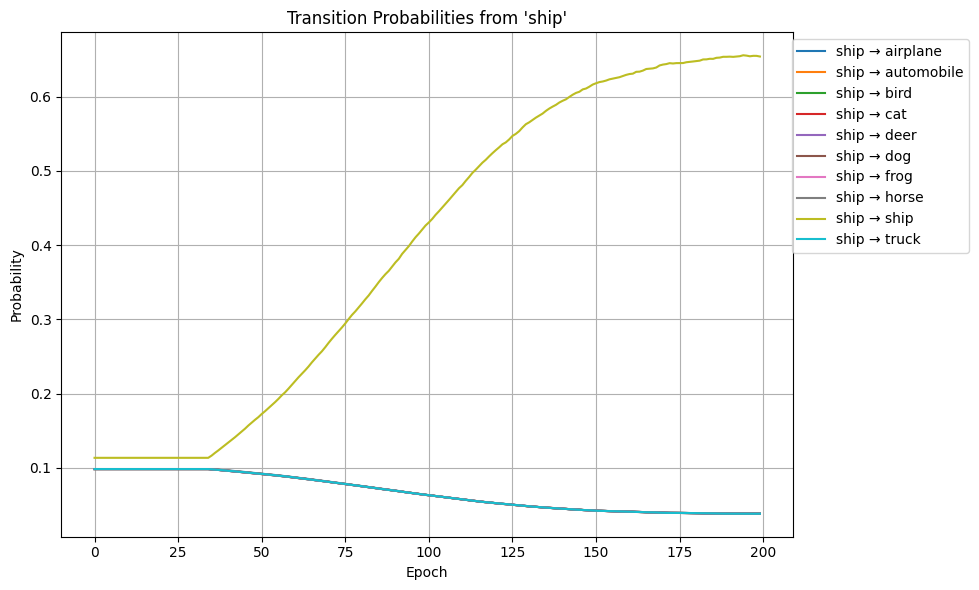

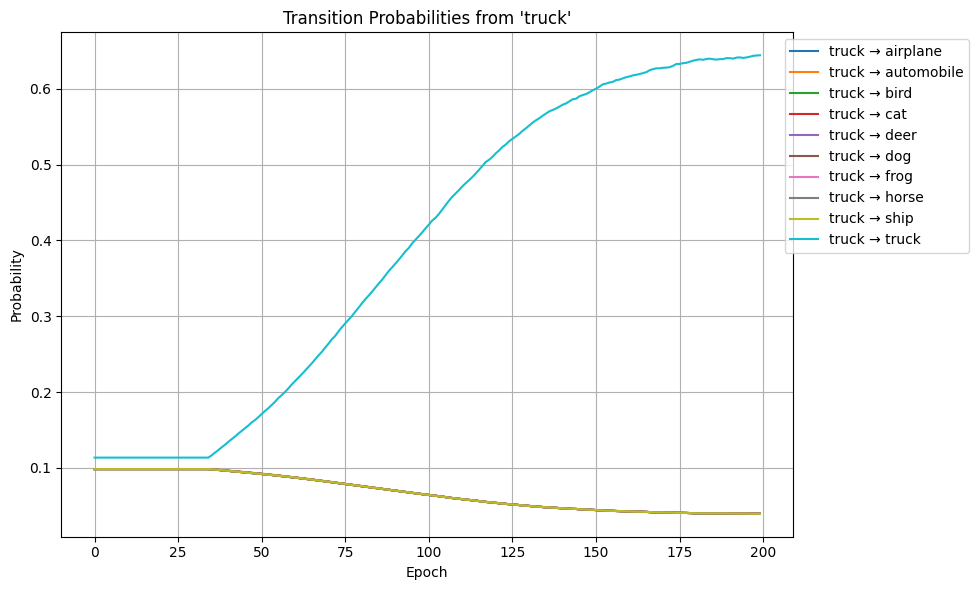

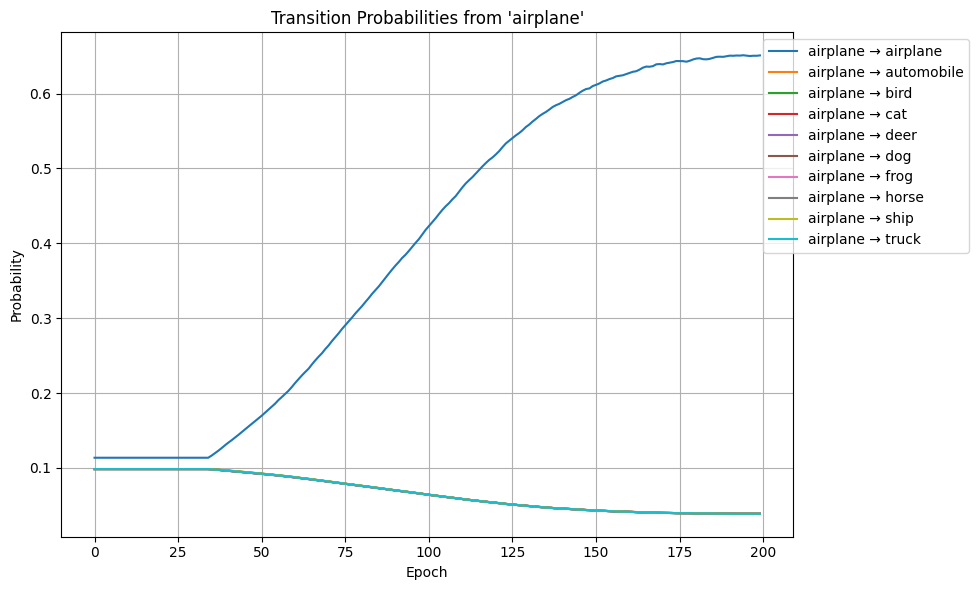


Starting training for 60% noise
----------------------------------------
Epoch 1/200 | Train Loss: 2.2611 | Val Loss: 2.0427 | Train Acc: 0.1640 | Val Acc: 0.3213 | Precision: 0.3360 | Recall: 0.3213
Epoch 2/200 | Train Loss: 2.2061 | Val Loss: 1.8977 | Train Acc: 0.2160 | Val Acc: 0.4071 | Precision: 0.4163 | Recall: 0.4071
Epoch 3/200 | Train Loss: 2.1856 | Val Loss: 1.8501 | Train Acc: 0.2349 | Val Acc: 0.4588 | Precision: 0.4748 | Recall: 0.4588
Epoch 4/200 | Train Loss: 2.1672 | Val Loss: 1.8204 | Train Acc: 0.2515 | Val Acc: 0.4920 | Precision: 0.4971 | Recall: 0.4920
Epoch 5/200 | Train Loss: 2.1542 | Val Loss: 1.7753 | Train Acc: 0.2599 | Val Acc: 0.5202 | Precision: 0.5216 | Recall: 0.5202
Epoch 6/200 | Train Loss: 2.1401 | Val Loss: 1.7536 | Train Acc: 0.2709 | Val Acc: 0.5080 | Precision: 0.5421 | Recall: 0.5080
Epoch 7/200 | Train Loss: 2.1286 | Val Loss: 1.7128 | Train Acc: 0.2802 | Val Acc: 0.5453 | Precision: 0.5442 | Recall: 0.5453
Epoch 8/200 | Train Loss: 2.1166 | Va

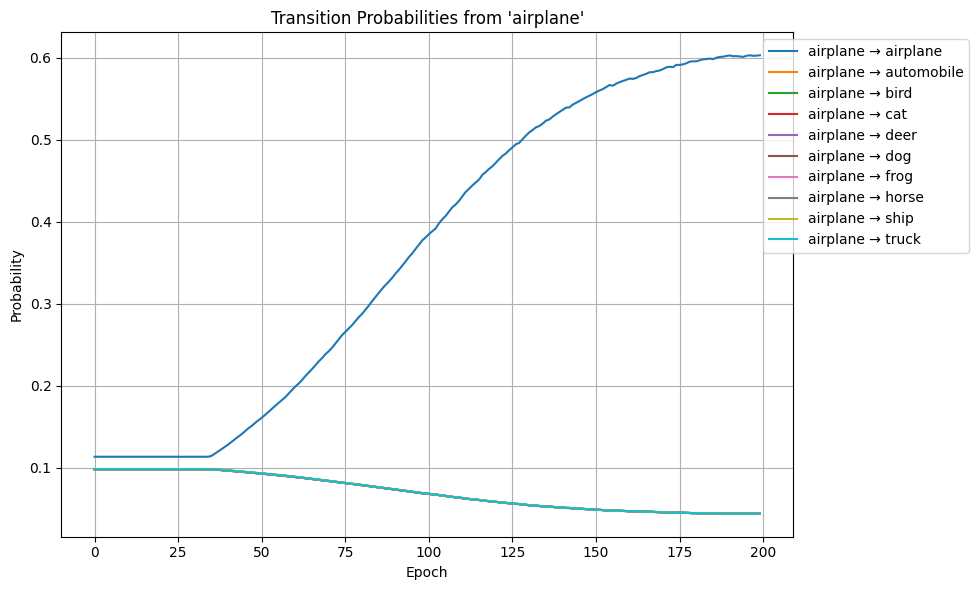

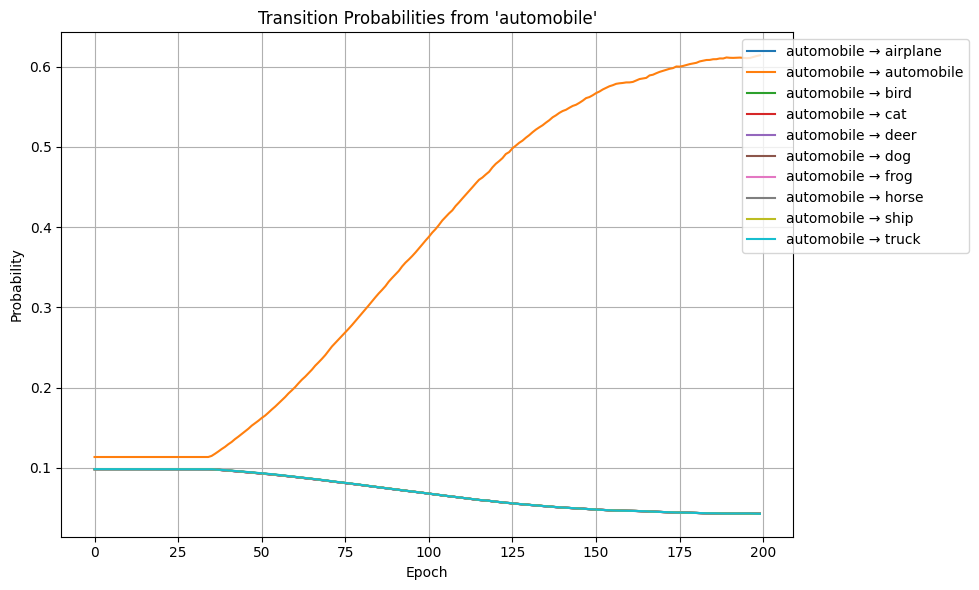

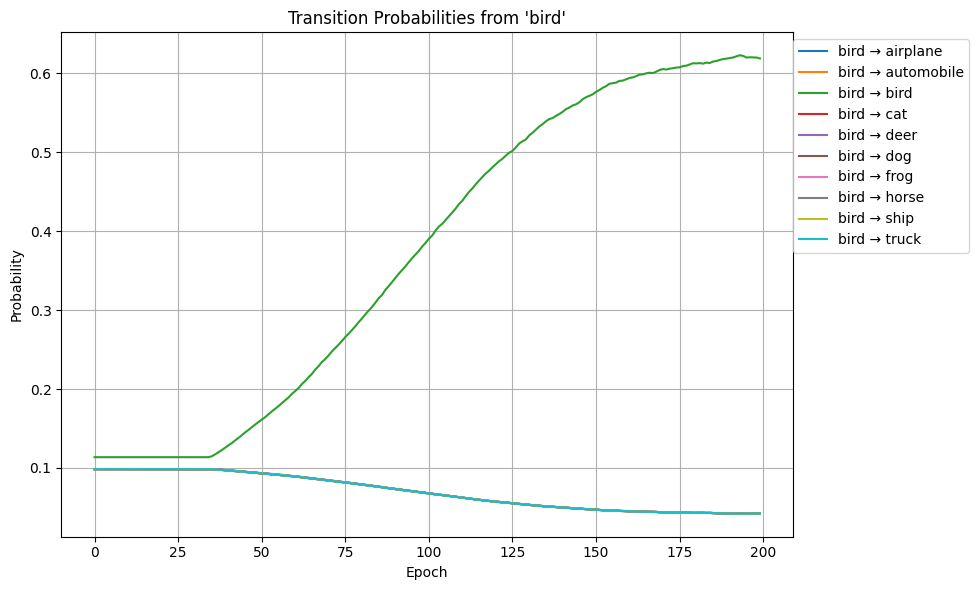

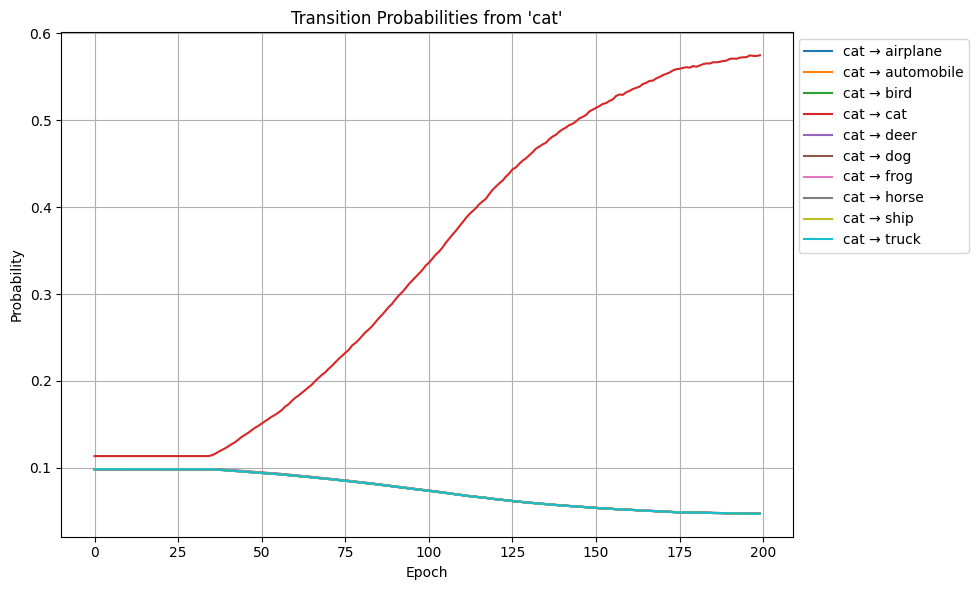

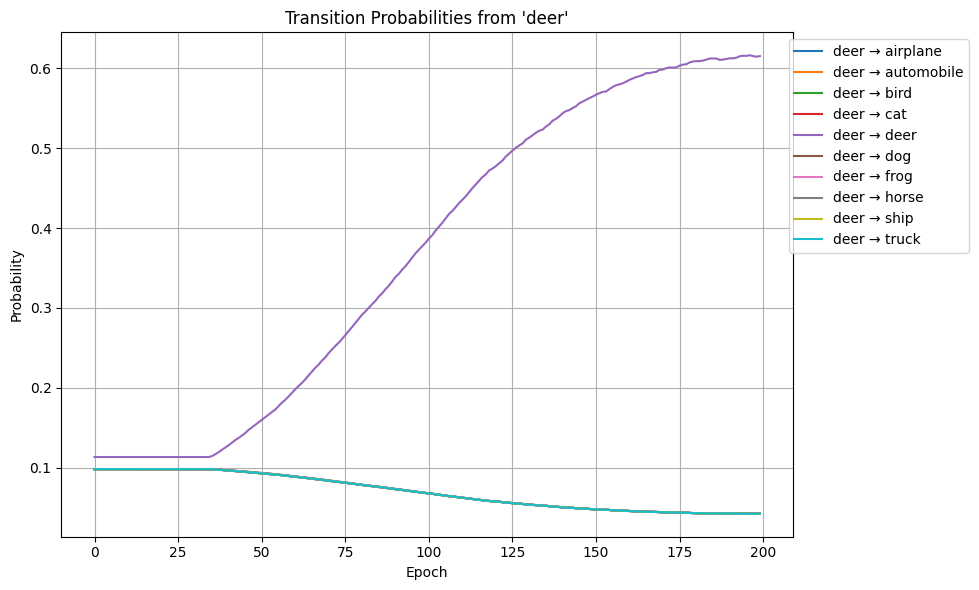

...

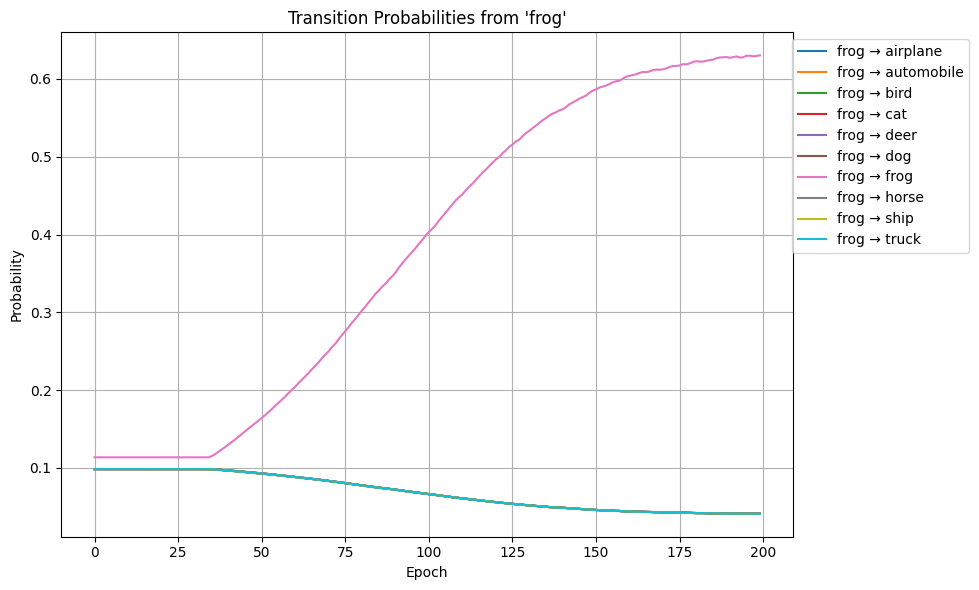

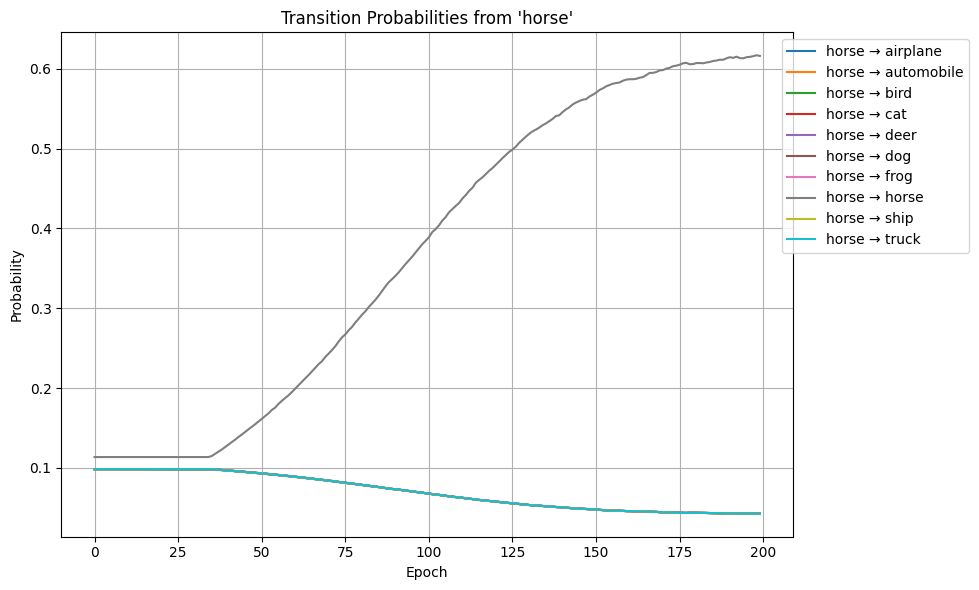

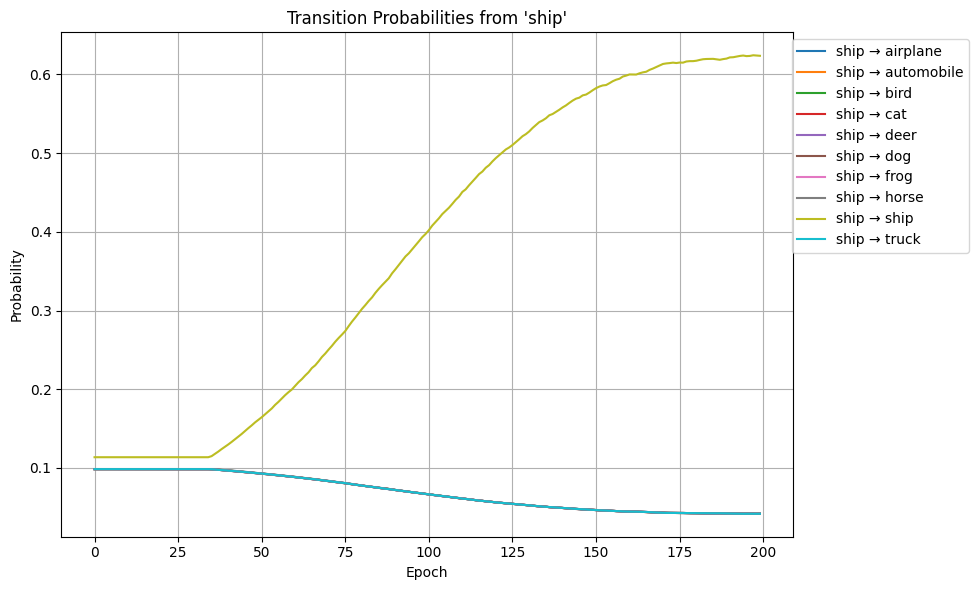

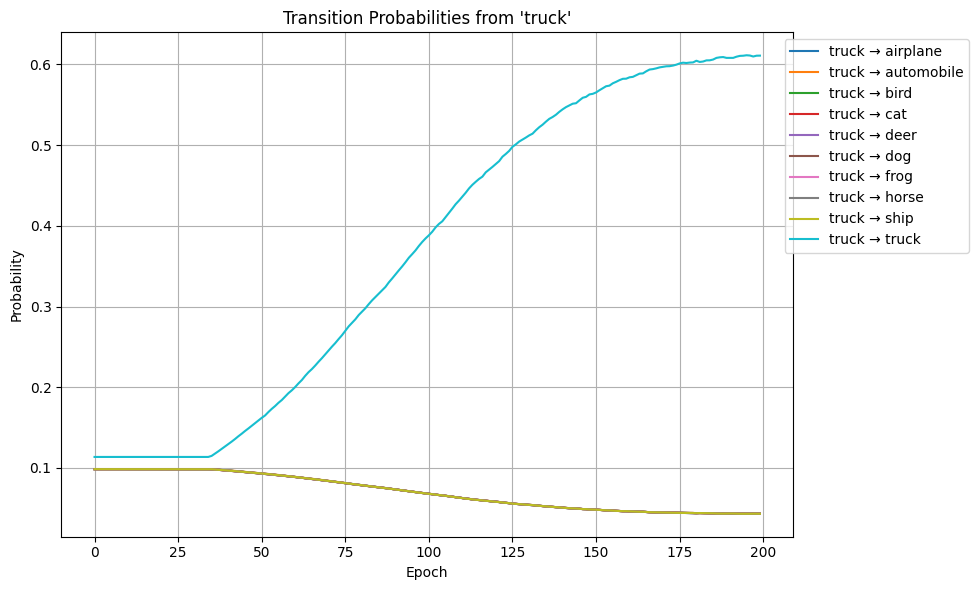

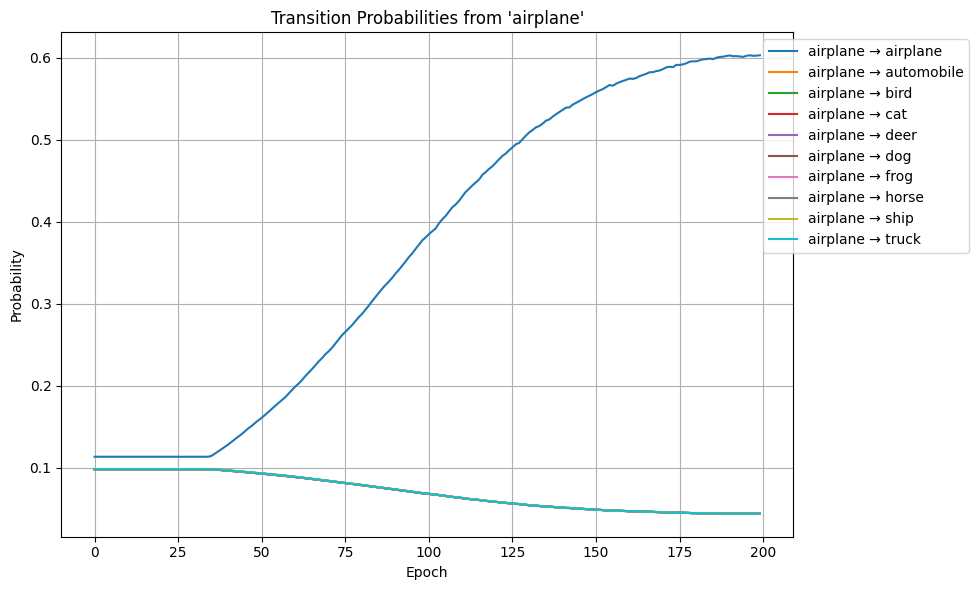

In [ ]:
for noise_level in [10, 20, 30, 40, 50, 60]:
    print(f"\nStarting training for {noise_level}% noise\n{'-'*40}")

    history, T_history = run_training_for_noise_level(
        train_loader=train_loaders[noise_level],
        model_path=model_paths[noise_level],
        history_path=history_paths[noise_level],
        T_path=T_paths[noise_level],
        delta_T_path=delta_T_save_paths[noise_level],
        val_loader=cifar10_test_loader,
        device=device
    )

    plot_T_evolution(T_history, class_idx=0)


Starting training for 10% noise
----------------------------------------
Epoch 1/20 | Train Loss: 1.2421 | Val Loss: 0.6501 | Train Acc: 0.6278 | Val Acc: 0.8105 | Precision: 0.8115 | Recall: 0.8105
Epoch 2/20 | Train Loss: 0.8699 | Val Loss: 0.5907 | Train Acc: 0.7700 | Val Acc: 0.8305 | Precision: 0.8324 | Recall: 0.8305
Epoch 3/20 | Train Loss: 0.7381 | Val Loss: 0.5852 | Train Acc: 0.8140 | Val Acc: 0.8209 | Precision: 0.8240 | Recall: 0.8209
Epoch 4/20 | Train Loss: 0.6466 | Val Loss: 0.6081 | Train Acc: 0.8391 | Val Acc: 0.8136 | Precision: 0.8192 | Recall: 0.8136
Epoch 5/20 | Train Loss: 0.5760 | Val Loss: 0.5355 | Train Acc: 0.8557 | Val Acc: 0.8425 | Precision: 0.8416 | Recall: 0.8425
Epoch 6/20 | Train Loss: 0.5058 | Val Loss: 0.5727 | Train Acc: 0.8737 | Val Acc: 0.8374 | Precision: 0.8393 | Recall: 0.8374
Epoch 7/20 | Train Loss: 0.4536 | Val Loss: 0.5972 | Train Acc: 0.8837 | Val Acc: 0.8298 | Precision: 0.8286 | Recall: 0.8298
Epoch 8/20 | Train Loss: 0.3737 | Val Loss: 

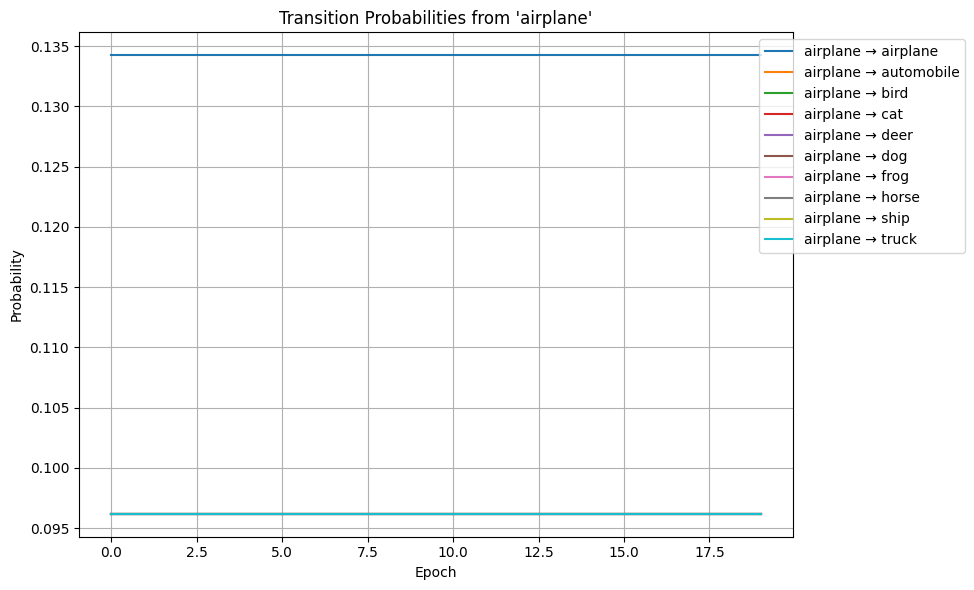


Starting training for 20% noise
----------------------------------------
Epoch 1/20 | Train Loss: 1.5176 | Val Loss: 0.7560 | Train Acc: 0.5532 | Val Acc: 0.7919 | Precision: 0.7911 | Recall: 0.7919
Epoch 2/20 | Train Loss: 1.2009 | Val Loss: 0.7048 | Train Acc: 0.6818 | Val Acc: 0.8190 | Precision: 0.8194 | Recall: 0.8190
Epoch 3/20 | Train Loss: 1.0707 | Val Loss: 0.7047 | Train Acc: 0.7264 | Val Acc: 0.8018 | Precision: 0.8044 | Recall: 0.8018
Epoch 4/20 | Train Loss: 0.9750 | Val Loss: 0.7132 | Train Acc: 0.7521 | Val Acc: 0.8026 | Precision: 0.8054 | Recall: 0.8026
Epoch 5/20 | Train Loss: 0.8881 | Val Loss: 0.6867 | Train Acc: 0.7761 | Val Acc: 0.8150 | Precision: 0.8190 | Recall: 0.8150
Epoch 6/20 | Train Loss: 0.8079 | Val Loss: 0.7092 | Train Acc: 0.7919 | Val Acc: 0.8096 | Precision: 0.8096 | Recall: 0.8096
Epoch 7/20 | Train Loss: 0.7176 | Val Loss: 0.7619 | Train Acc: 0.8132 | Val Acc: 0.8013 | Precision: 0.8007 | Recall: 0.8013
Epoch 8/20 | Train Loss: 0.6167 | Val Loss: 

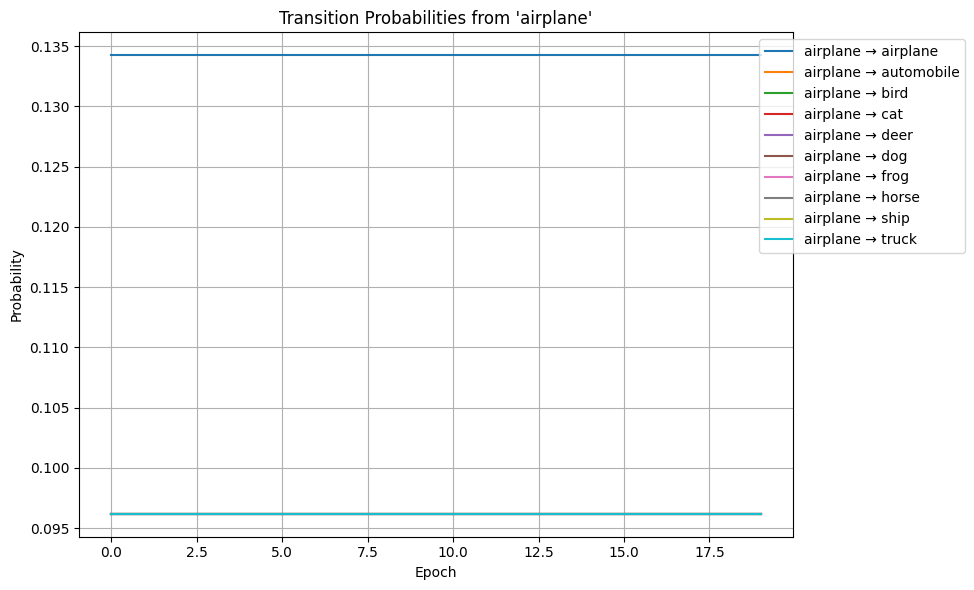


Starting training for 30% noise
----------------------------------------
Epoch 1/20 | Train Loss: 1.7279 | Val Loss: 0.9185 | Train Acc: 0.4838 | Val Acc: 0.7787 | Precision: 0.7784 | Recall: 0.7787
Epoch 2/20 | Train Loss: 1.4577 | Val Loss: 0.8329 | Train Acc: 0.6026 | Val Acc: 0.7974 | Precision: 0.8002 | Recall: 0.7974
Epoch 3/20 | Train Loss: 1.3528 | Val Loss: 0.8223 | Train Acc: 0.6397 | Val Acc: 0.7974 | Precision: 0.8013 | Recall: 0.7974
Epoch 4/20 | Train Loss: 1.2683 | Val Loss: 0.9068 | Train Acc: 0.6644 | Val Acc: 0.7822 | Precision: 0.7849 | Recall: 0.7822
Epoch 5/20 | Train Loss: 1.1855 | Val Loss: 0.9309 | Train Acc: 0.6840 | Val Acc: 0.8061 | Precision: 0.8064 | Recall: 0.8061
Epoch 6/20 | Train Loss: 1.0953 | Val Loss: 0.8751 | Train Acc: 0.7044 | Val Acc: 0.7869 | Precision: 0.7902 | Recall: 0.7869
Epoch 7/20 | Train Loss: 0.9896 | Val Loss: 0.9065 | Train Acc: 0.7275 | Val Acc: 0.7660 | Precision: 0.7701 | Recall: 0.7660
Epoch 8/20 | Train Loss: 0.8644 | Val Loss: 

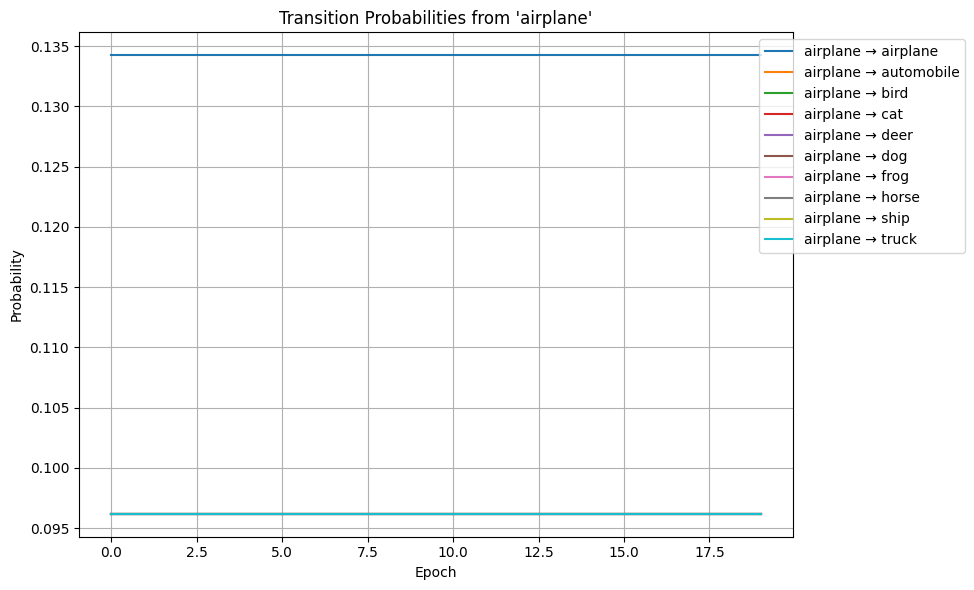


Starting training for 40% noise
----------------------------------------
Epoch 1/20 | Train Loss: 1.9062 | Val Loss: 1.0609 | Train Acc: 0.4140 | Val Acc: 0.7661 | Precision: 0.7674 | Recall: 0.7661
Epoch 2/20 | Train Loss: 1.6961 | Val Loss: 1.0773 | Train Acc: 0.5162 | Val Acc: 0.7600 | Precision: 0.7613 | Recall: 0.7600
Epoch 3/20 | Train Loss: 1.5986 | Val Loss: 0.9704 | Train Acc: 0.5540 | Val Acc: 0.7724 | Precision: 0.7779 | Recall: 0.7724
Epoch 4/20 | Train Loss: 1.5121 | Val Loss: 1.0373 | Train Acc: 0.5794 | Val Acc: 0.7708 | Precision: 0.7749 | Recall: 0.7708
Epoch 5/20 | Train Loss: 1.4216 | Val Loss: 1.0660 | Train Acc: 0.6023 | Val Acc: 0.7354 | Precision: 0.7432 | Recall: 0.7354
Epoch 6/20 | Train Loss: 1.3331 | Val Loss: 0.9974 | Train Acc: 0.6216 | Val Acc: 0.7586 | Precision: 0.7603 | Recall: 0.7586
Epoch 7/20 | Train Loss: 1.2194 | Val Loss: 1.1259 | Train Acc: 0.6506 | Val Acc: 0.7251 | Precision: 0.7310 | Recall: 0.7251
Epoch 8/20 | Train Loss: 1.0673 | Val Loss: 

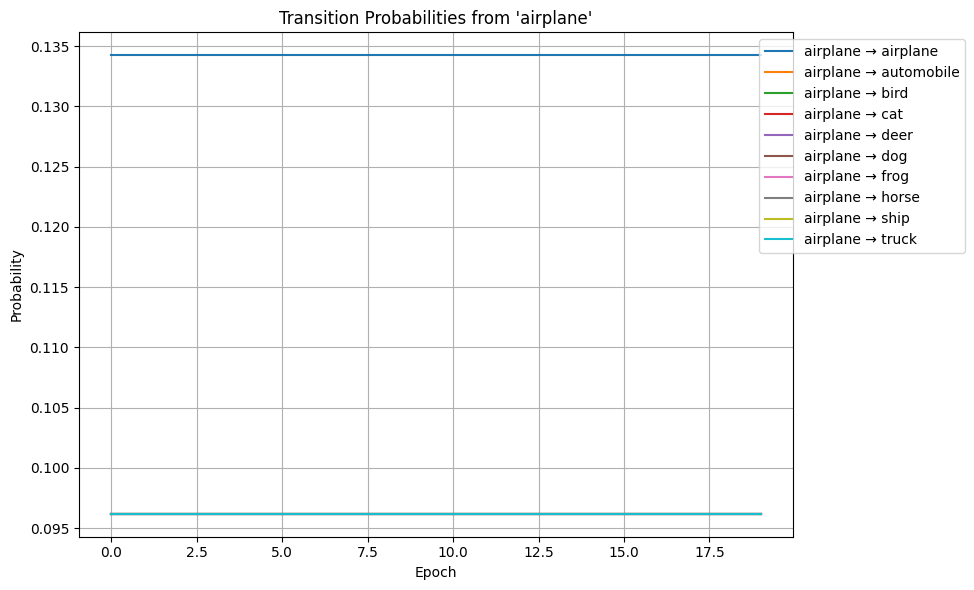


Starting training for 50% noise
----------------------------------------
Epoch 1/20 | Train Loss: 2.0504 | Val Loss: 1.2368 | Train Acc: 0.3415 | Val Acc: 0.7260 | Precision: 0.7315 | Recall: 0.7260
Epoch 2/20 | Train Loss: 1.8787 | Val Loss: 1.1516 | Train Acc: 0.4393 | Val Acc: 0.7555 | Precision: 0.7599 | Recall: 0.7555
Epoch 3/20 | Train Loss: 1.8005 | Val Loss: 1.1788 | Train Acc: 0.4697 | Val Acc: 0.7528 | Precision: 0.7585 | Recall: 0.7528
Epoch 4/20 | Train Loss: 1.7274 | Val Loss: 1.1813 | Train Acc: 0.4935 | Val Acc: 0.7290 | Precision: 0.7478 | Recall: 0.7290
Epoch 5/20 | Train Loss: 1.6450 | Val Loss: 1.0661 | Train Acc: 0.5182 | Val Acc: 0.7558 | Precision: 0.7565 | Recall: 0.7558
Epoch 6/20 | Train Loss: 1.5535 | Val Loss: 1.3627 | Train Acc: 0.5410 | Val Acc: 0.7164 | Precision: 0.7169 | Recall: 0.7164
Epoch 7/20 | Train Loss: 1.4471 | Val Loss: 1.1746 | Train Acc: 0.5660 | Val Acc: 0.7025 | Precision: 0.7042 | Recall: 0.7025
Epoch 8/20 | Train Loss: 1.2868 | Val Loss: 

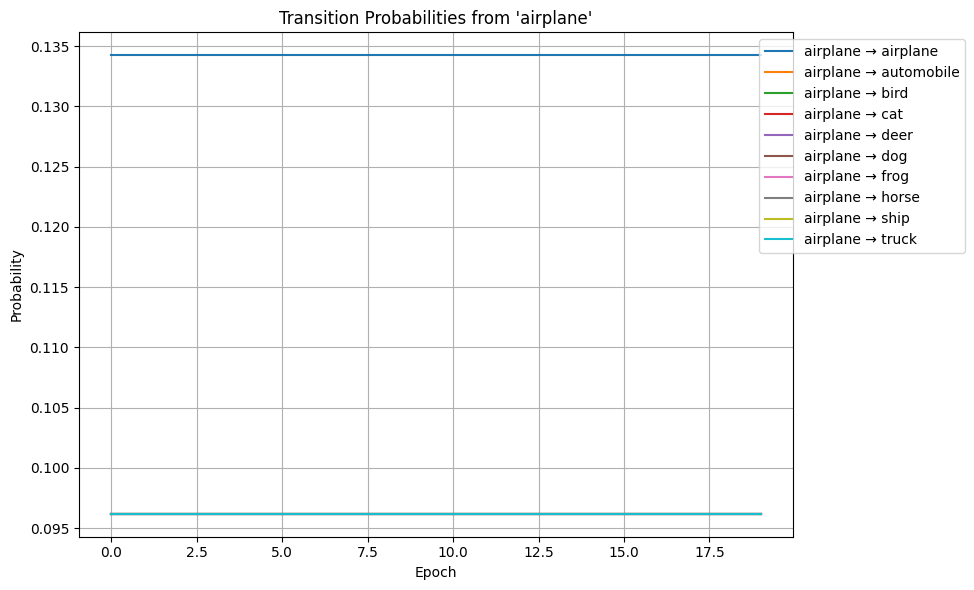


Starting training for 60% noise
----------------------------------------
Epoch 1/20 | Train Loss: 2.1769 | Val Loss: 1.4867 | Train Acc: 0.2608 | Val Acc: 0.6684 | Precision: 0.6665 | Recall: 0.6684
Epoch 2/20 | Train Loss: 2.0558 | Val Loss: 1.2904 | Train Acc: 0.3503 | Val Acc: 0.7324 | Precision: 0.7349 | Recall: 0.7324
Epoch 3/20 | Train Loss: 1.9954 | Val Loss: 1.4082 | Train Acc: 0.3787 | Val Acc: 0.6856 | Precision: 0.6966 | Recall: 0.6856
Epoch 4/20 | Train Loss: 1.9365 | Val Loss: 1.2796 | Train Acc: 0.4021 | Val Acc: 0.7119 | Precision: 0.7195 | Recall: 0.7119
Epoch 5/20 | Train Loss: 1.8727 | Val Loss: 1.2288 | Train Acc: 0.4256 | Val Acc: 0.7409 | Precision: 0.7427 | Recall: 0.7409
Epoch 6/20 | Train Loss: 1.8056 | Val Loss: 1.2889 | Train Acc: 0.4458 | Val Acc: 0.7068 | Precision: 0.7093 | Recall: 0.7068
Epoch 7/20 | Train Loss: 1.7054 | Val Loss: 1.3473 | Train Acc: 0.4737 | Val Acc: 0.6643 | Precision: 0.6677 | Recall: 0.6643
Epoch 8/20 | Train Loss: 1.5806 | Val Loss: 

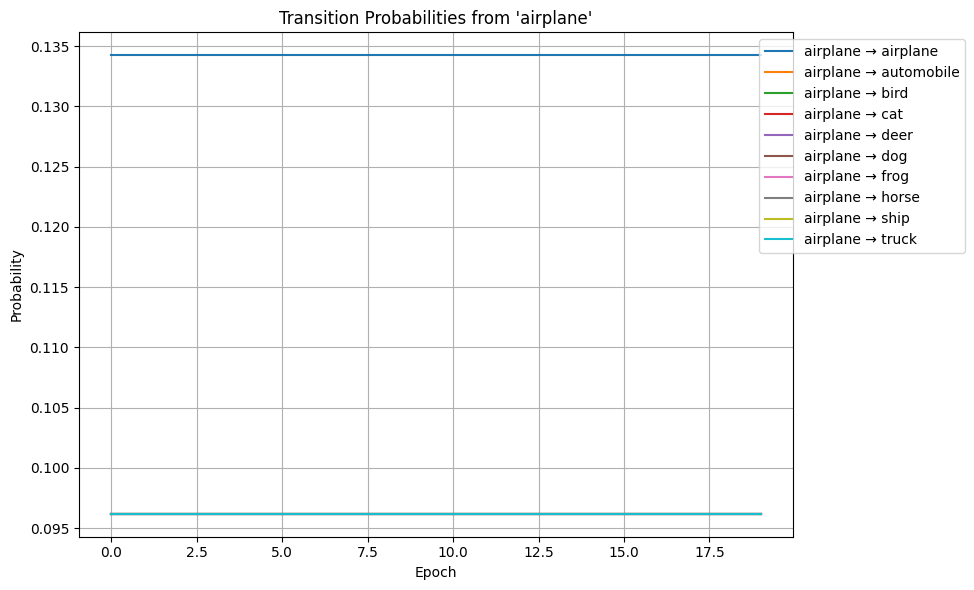

In [ ]:
num_classes = 10
resnet50_model = ResNet50().to(device)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for noise_level in [10, 20, 30, 40, 50, 60]:
    print(f"\nStarting training for {noise_level}% noise\n{'-'*40}")

    history, T_history = run_training_for_noise_level(
        train_loader=train_loaders[noise_level],
        model_path=resnet50_model_paths[noise_level],
        history_path=resnet50_history_paths[noise_level],
        T_path=resnet50_T_paths[noise_level],
        delta_T_path=resnet50_delta_T_save_paths[noise_level],
        val_loader=cifar10_test_loader,
        device=device,
        model="resnet50",
        epochs = 20
    )

    plot_T_evolution(T_history, class_idx=0)


In [ ]:
num_classes = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet50_model = ResNet50().to(device)

for noise_level in [10, 20, 30, 40, 50, 60]:
    print(f"\nStarting training for {noise_level}% noise\n{'-'*40}")

    history, T_history = run_t_estimation_training_for_noise_level(
        train_loader=train_loaders[noise_level],
        model_path=t_estimation_resnet50_model_paths[noise_level],
        history_path=t_estimation_resnet50_history_paths[noise_level],
        T_path=t_estimation_resnet50_T_paths[noise_level],
        delta_T_path=t_estimation_resnet50_T_paths[noise_level],
        val_loader=cifar10_test_loader,
        device=device,
        model="resnet50",
        epochs = 20
    )



Starting training for 10% noise
----------------------------------------


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-37-e347008fce6f>", line 8, in <cell line: 0>
    history, T_history = run_t_estimation_training_for_noise_level(
                         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<ipython-input-27-b8c8e64f0d85>", line 192, in run_t_estimation_training_for_noise_level
    history, T_history = T_estimation_train(
                         ^^^^^^^^^^^^^^^^^^^
  File "<ipython-input-35-1018c7599f4c>", line 62, in T_estimation_train
    for x_batch, y_noisy in train_loader:
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 708, in __next__
    data = self._next_data()
           ^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 764, in _next_data
    data = self._dataset_fetcher.

## Plots for Cifar-10

In [ ]:
nr_cnn_jsons = [nr_cnn_cifar10_10_percent_history_path,
                #nr_cnn_cifar10_20_percent_history_path,
                #nr_cnn_cifar10_30_percent_history_path, nr_cnn_cifar10_40_percent_history_path,
                #nr_cnn_cifar10_50_percent_history_path, nr_cnn_cifar10_60_percent_history_path
]

File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_10_percent_history.json, Noise Level: 10%
Training Accuracy: [32.972, 45.254, 50.564, 54.032000000000004, 57.391999999999996]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_20_percent_history.json, Noise Level: 20%
Training Accuracy: [29.148000000000003, 39.798, 44.344, 47.762, 50.705999999999996]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_30_percent_history.json, Noise Level: 30%
Training Accuracy: [27.094, 35.686, 39.422000000000004, 42.166, 44.968]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_40_percent_history.json, Noise Level: 40%
Training Accuracy: [24.46, 31.41, 34.756, 36.412, 38

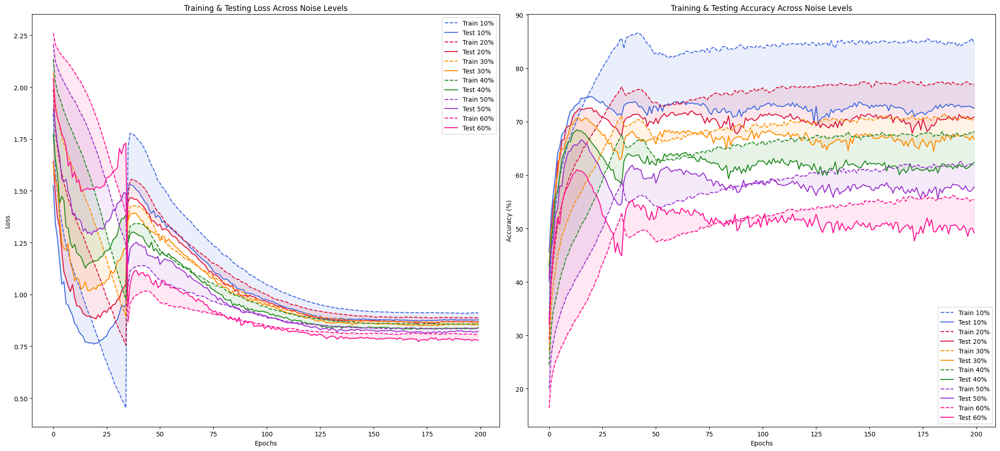

In [ ]:
model_names = ["10% Noise", "20% Noise",
               "30% Noise", "40% Noise",
               "50% Noise", "60% Noise"]
plot_training_history(nr_cnn_jsons)

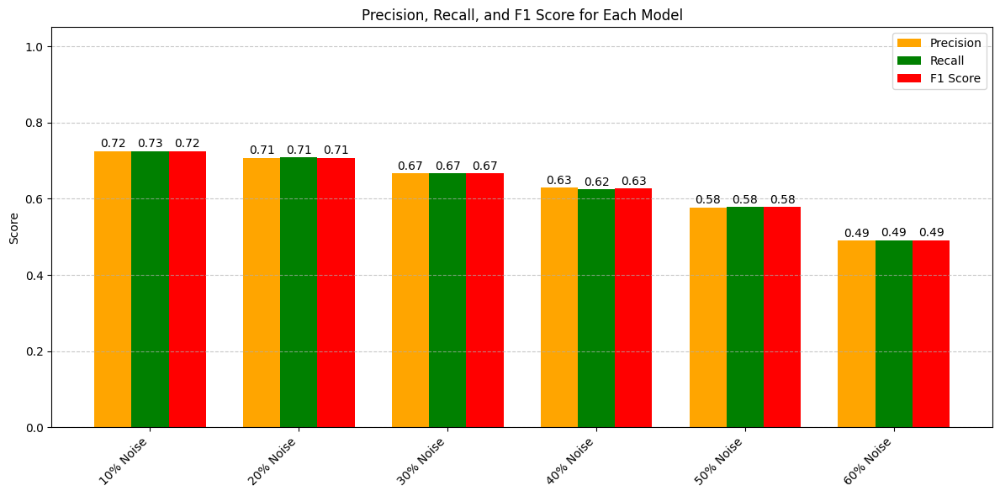

In [ ]:
plot_coteaching_metrics(nr_cnn_jsons, model_names)


nr_cnn_cifar10_10_percent.pth - Most Misclassified Classes (Noise Level: Unknown%):
Total Misclassifications: 2749
  - dog → cat (170 times)
  - cat → dog (154 times)
  - bird → deer (92 times)


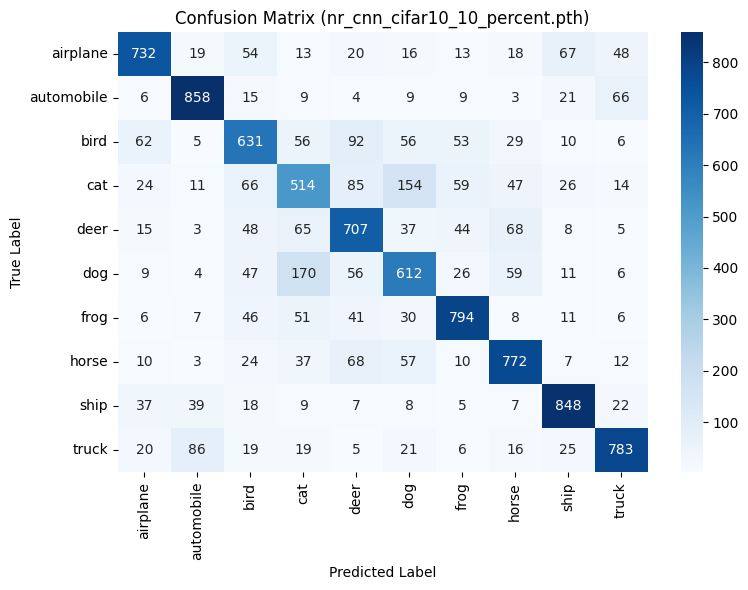


nr_cnn_cifar10_20_percent.pth - Most Misclassified Classes (Noise Level: Unknown%):
Total Misclassifications: 2914
  - cat → dog (167 times)
  - dog → cat (166 times)
  - automobile → truck (111 times)


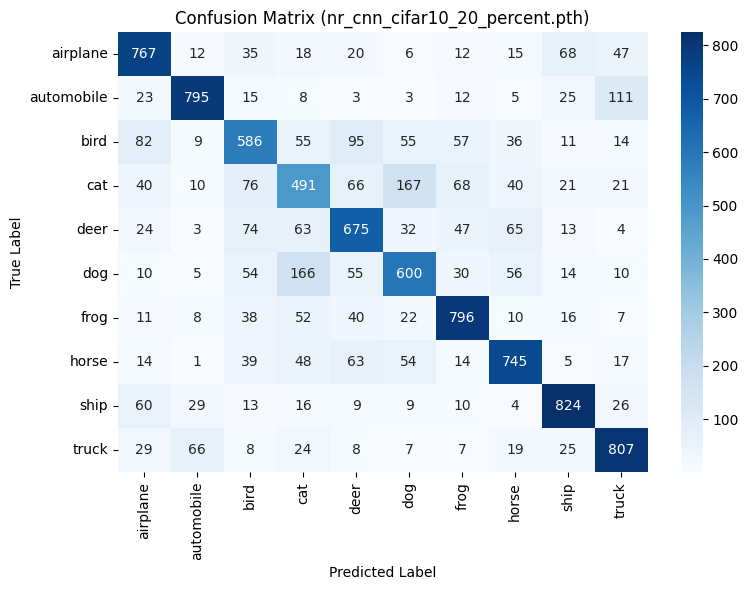


nr_cnn_cifar10_30_percent.pth - Most Misclassified Classes (Noise Level: Unknown%):
Total Misclassifications: 3333
  - dog → cat (165 times)
  - cat → dog (157 times)
  - automobile → truck (133 times)


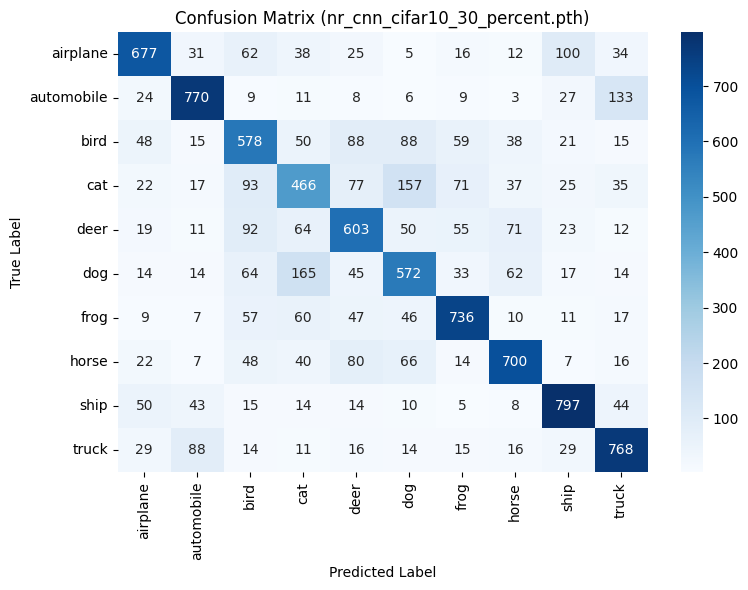


nr_cnn_cifar10_40_percent.pth - Most Misclassified Classes (Noise Level: Unknown%):
Total Misclassifications: 3759
  - dog → cat (184 times)
  - cat → dog (120 times)
  - deer → bird (110 times)


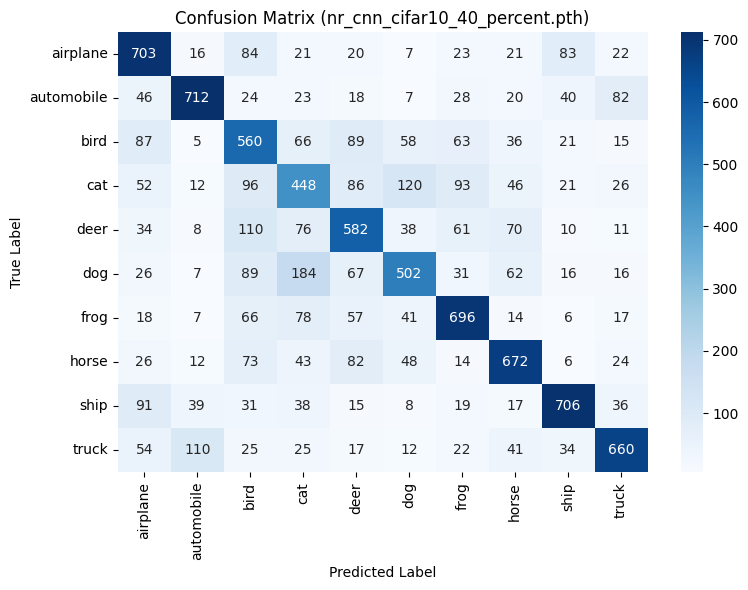


nr_cnn_cifar10_50_percent.pth - Most Misclassified Classes (Noise Level: Unknown%):
Total Misclassifications: 4220
  - cat → dog (172 times)
  - dog → cat (171 times)
  - deer → bird (126 times)


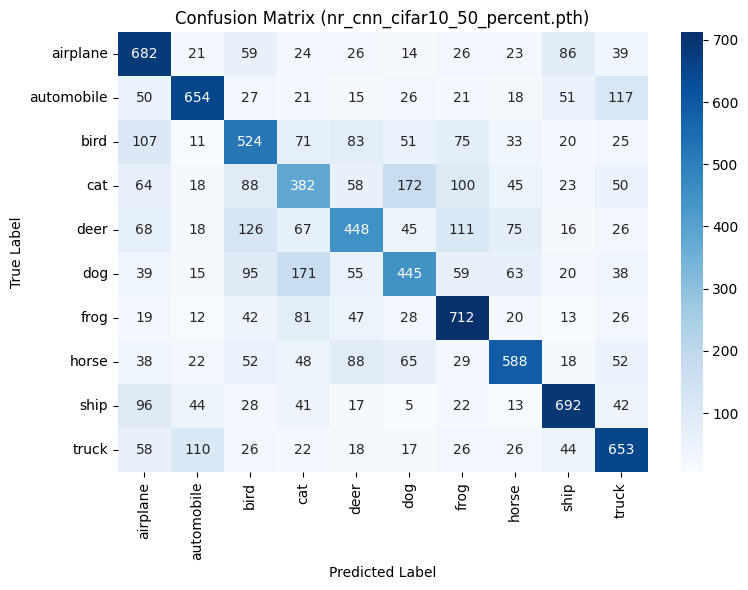


nr_cnn_cifar10_60_percent.pth - Most Misclassified Classes (Noise Level: Unknown%):
Total Misclassifications: 5084
  - bird → deer (160 times)
  - cat → dog (156 times)
  - dog → cat (155 times)


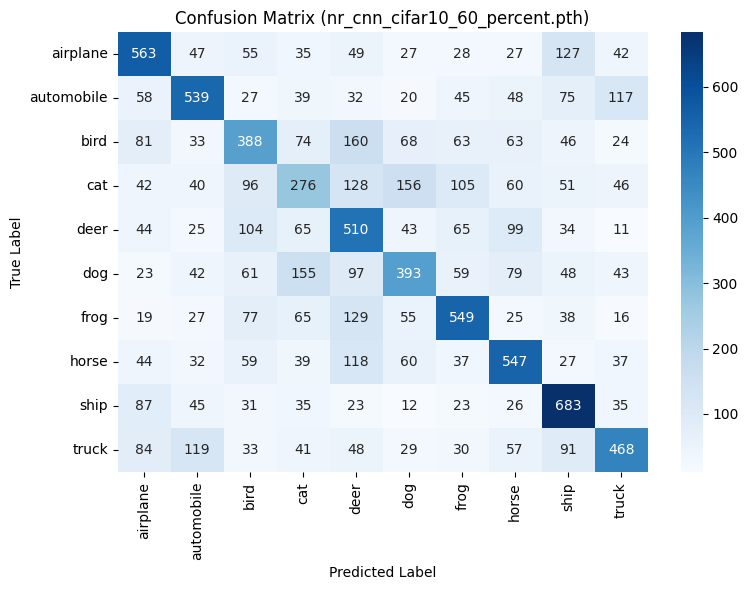

In [ ]:
nr_cnn_pt_paths = [nr_cnn_cifar10_10_percent_path, nr_cnn_cifar10_20_percent_path, nr_cnn_cifar10_30_percent_path,
                   nr_cnn_cifar10_40_percent_path, nr_cnn_cifar10_50_percent_path, nr_cnn_cifar10_60_percent_path]

test_loaders = [cifar10_test_loader, cifar10_test_loader, cifar10_test_loader,
                cifar10_test_loader, cifar10_test_loader, cifar10_test_loader]

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plot_misclassified_classes_from_dataloaders(nr_cnn_pt_paths,test_loaders, CNN, class_names  )

In [ ]:
#def evaluate_models_json(model_ath, history_json_path, model_class, test_loader, device='cuda'):


nr_cnn_cifar10_10_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent.pth")
nr_cnn_cifar10_20_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent.pth")
nr_cnn_cifar10_30_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent.pth")
nr_cnn_cifar10_40_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent.pth")
nr_cnn_cifar10_50_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent.pth")
nr_cnn_cifar10_60_percent_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent.pth")

nr_cnn_cifar10_10_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_10_percent_history.json")
nr_cnn_cifar10_20_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_20_percent_history.json")
nr_cnn_cifar10_30_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_30_percent_history.json")
nr_cnn_cifar10_40_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_40_percent_history.json")
nr_cnn_cifar10_50_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_50_percent_history.json")
nr_cnn_cifar10_60_percent_history_path = os.path.join(nr_cnn_cifar10_save_dir, "nr_cnn_cifar10_60_percent_history.json")



evaluate_models_json(nr_cnn_cifar10_10_percent_path,nr_cnn_cifar10_10_percent_history_path, CNN, cifar10_test_loader)
evaluate_models_json(nr_cnn_cifar10_20_percent_path,nr_cnn_cifar10_20_percent_history_path, CNN, cifar10_test_loader)
evaluate_models_json(nr_cnn_cifar10_30_percent_path,nr_cnn_cifar10_30_percent_history_path, CNN, cifar10_test_loader)
evaluate_models_json(nr_cnn_cifar10_40_percent_path,nr_cnn_cifar10_40_percent_history_path, CNN, cifar10_test_loader)
evaluate_models_json(nr_cnn_cifar10_50_percent_path,nr_cnn_cifar10_50_percent_history_path, CNN, cifar10_test_loader)
evaluate_models_json(nr_cnn_cifar10_60_percent_path,nr_cnn_cifar10_60_percent_history_path, CNN, cifar10_test_loader)


Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_10_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.7251 |       0.9695

Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_20_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.7086 |       0.9676

Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_cnn_cifar10_30_percent_history.json')
Model      |  Sensitivity |  Specificity
--------------------------------------
Model 1    |       0.6667 |       0.9630

Model Comparison: File'/content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkp

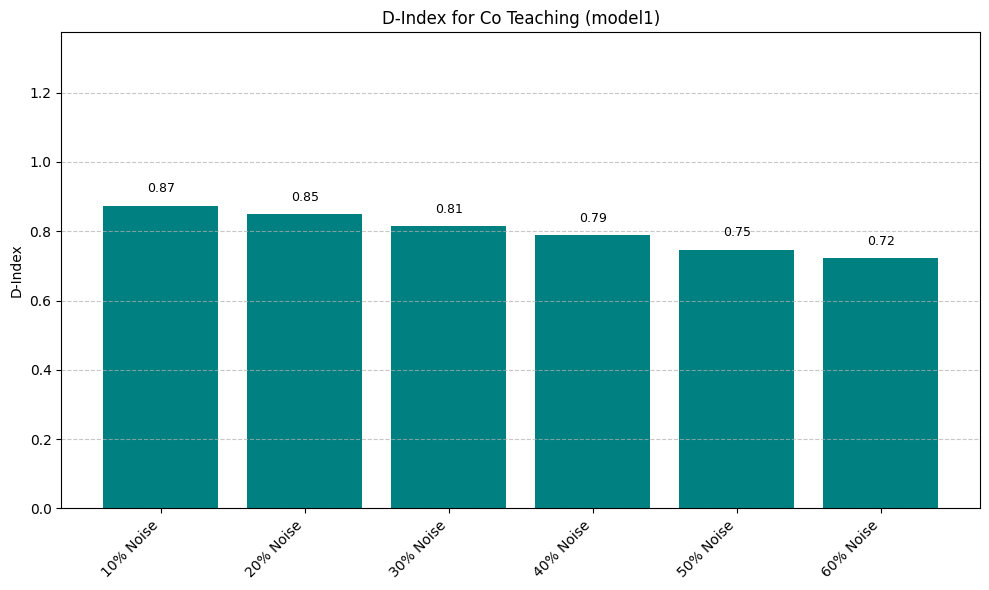

In [ ]:
model_names = ["10% Noise", "20% Noise",
               "30% Noise", "40% Noise",
               "50% Noise", "60% Noise"]
plot_dindex(nr_cnn_jsons, model_names)

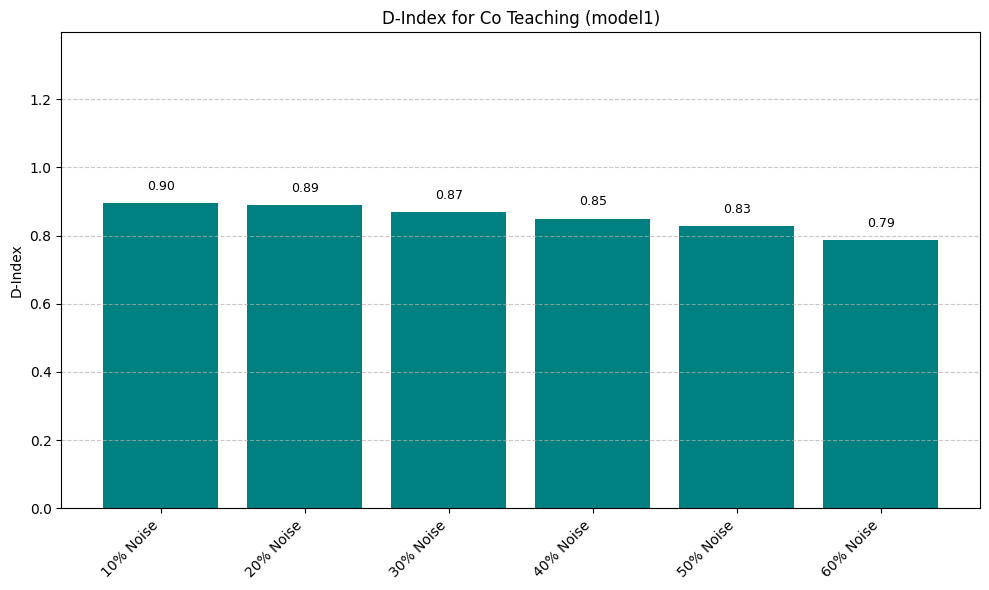

In [ ]:
model_names = ["10% Noise", "20% Noise",
               "30% Noise", "40% Noise",
               "50% Noise", "60% Noise"]
plot_dindex(nr_cnn_jsons, model_names)

## NR - ResNet Visuals

In [ ]:
nr_resnet_jsons = [nr_resnet_cifar10_10_percent_history_path,
                   nr_resnet_cifar10_20_percent_history_path,
                   nr_resnet_cifar10_30_percent_history_path,
                   nr_resnet_cifar10_40_percent_history_path,
                   nr_resnet_cifar10_50_percent_history_path,
                   nr_resnet_cifar10_60_percent_history_path
                   ]

model_names = ["10% Noise", "20% Noise",
               "30% Noise", "40% Noise",
               "50% Noise", "60% Noise"]

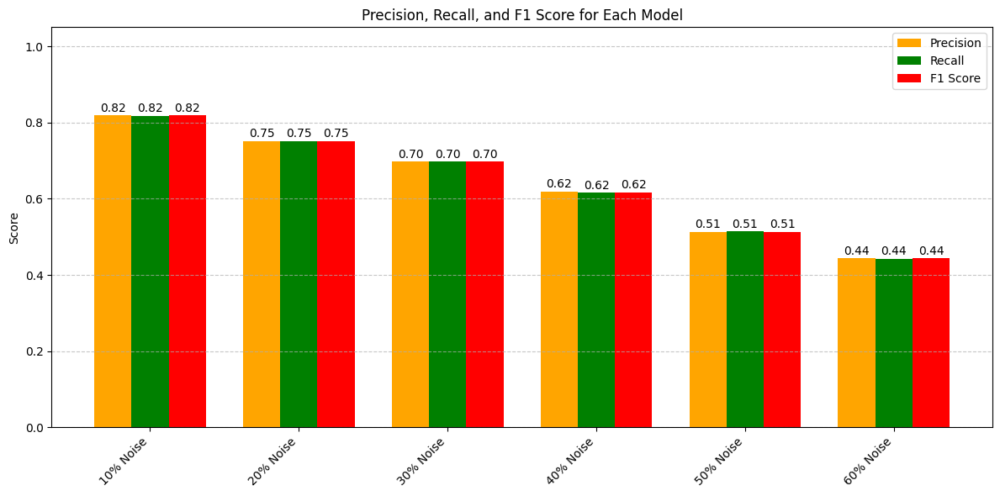

In [ ]:
plot_coteaching_metrics(nr_resnet_jsons, model_names)

File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_resnet_cifar10_10_percent_history.json, Noise Level: 10%
Training Accuracy: [62.775999999999996, 77.00200000000001, 81.396, 83.91199999999999, 85.566]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_resnet_cifar10_20_percent_history.json, Noise Level: 20%
Training Accuracy: [55.322, 68.17800000000001, 72.64, 75.212, 77.61]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_resnet_cifar10_30_percent_history.json, Noise Level: 30%
Training Accuracy: [48.378, 60.263999999999996, 63.966, 66.44200000000001, 68.404]
File: /content/drive/MyDrive/Spring 2025 Capstone - Han Deep Learning/Model Checkpoints/Noise Robust (NR) CNNs/CIFAR 10/nr_resnet_cifar10_40_percent_history.json, Noise Level: 40%
Training Accuracy: [41.396, 51.615

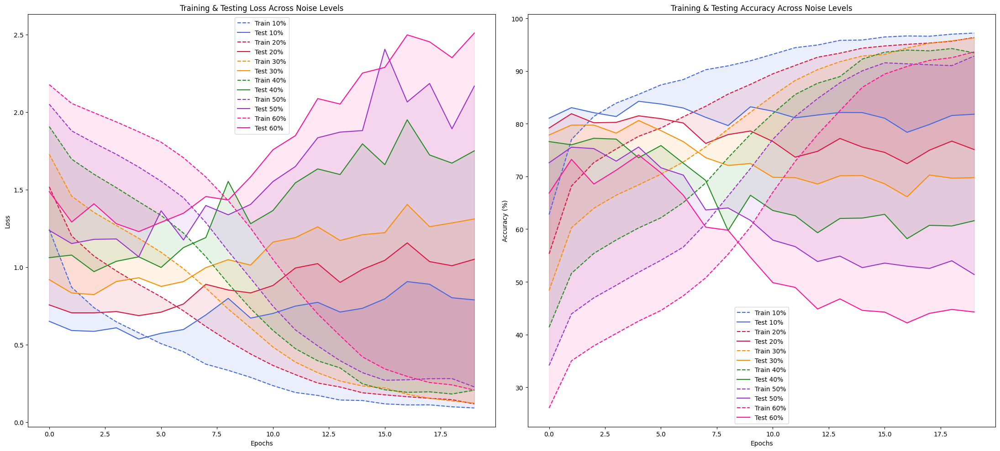

In [ ]:
plot_training_history(nr_resnet_jsons)

In [ ]:
import pkg_resources

packages = [
    "tensorflow",
    "keras",
    "numpy",
    "scikit-learn",
    "matplotlib",
    "seaborn",
    "torch",
    "torchvision",
    "pytz"
]

for package in packages:
    try:
        version = pkg_resources.get_distribution(package).version
        print(f"{package}=={version}")
    except pkg_resources.DistributionNotFound:
        print(f"{package} is not installed.")


tensorflow==2.18.0
keras==3.8.0
numpy==2.0.2
scikit-learn==1.6.1
matplotlib==3.10.0
seaborn==0.13.2
torch==2.6.0+cu124
torchvision==0.21.0+cu124
pytz==2025.2


<ipython-input-19-11203d2e806c>:1: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources
